In [0]:
import tensorflow.keras as keras
keras.__version__

'2.2.4-tf'

In [0]:
from tensorflow.keras import backend as K   # Use tensorflow.keras
K.clear_session()

In [0]:

from tensorflow.keras import layers
from tensorflow.keras import regularizers
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow import set_random_seed

from numpy.random import seed

import numpy as np

import imageio

In [0]:
epochs = 40
batch_size = 128     # Batch size is 32 instead of 16.
global im_store
global dp_store

In [0]:
class PlotEpoch(keras.callbacks.Callback):

    def on_epoch_end(self, epoch, logs={}):
        
        plot_types(decoder,qt, standard_scaler = False)
 
        
plot_epoch = PlotEpoch()

In [0]:
callback_list = [
                 keras.callbacks.ReduceLROnPlateau(
                     monitor = 'val_loss',
                     factor = 0.5,
                     patience = 10,
                     verbose =1 #true
                 ),
                 plot_epoch
]

Use PReLU instead of ReLU.

In [0]:
def make_vae( 
    img_shape = (389+1, ),
    latent_dim = 1, 
    dense_width = 600,
    l2_penalty=0.00001,
    l1_penalty=0.0,
    encoder_dropout_rate=0.5,
    decoder_dropout_rate=0.0,
    entanglement_penalty = 1,
    hidden_n = 2):
  
  input_img = keras.Input(shape=img_shape)

  # The last input indicate to the network whether this is validation
  is_validation = input_img[:,-1] 
  input_data = input_img[:,:-1] 


  # Test the PReLU

  # x = layers.Dense(dense_width, activation='relu',
  #                 kernel_regularizer=regularizers.l1_l2(
  #                     l1=l1_penalty,l2=l2_penalty))(input_data)
  x = layers.Dense(dense_width, activation=layers.PReLU(alpha_regularizer=regularizers.l1_l2(
                      l1=l1_penalty,l2=l2_penalty)), \
                   kernel_regularizer=regularizers.l1_l2(
                      l1=l1_penalty,l2=l2_penalty))(input_data)



  x = layers.Dropout(encoder_dropout_rate)(x)

  for i in range(hidden_n):
    x = layers.Dense(dense_width, activation=layers.PReLU(alpha_regularizer=regularizers.l1_l2(
                      l1=l1_penalty,l2=l2_penalty)), 
                     kernel_regularizer=regularizers.l1_l2(
                        l1=l1_penalty,l2=l2_penalty))(x)
    x = layers.Dropout(encoder_dropout_rate)(x)

  z_mean = layers.Dense(latent_dim)(x)
  z_log_var = layers.Dense(latent_dim)(x)
  
  # Reduce sampling variance to near zero on validation (idea credit: Shahaf Grofit)
  is_validation_change = is_validation*100
  z_log_var = keras.layers.Subtract()([z_log_var, is_validation_change])
 
  def sampling(args):
      z_mean, z_log_var = args
      epsilon = K.random_normal(shape=(K.shape(z_mean)[0], latent_dim),
                                mean=0., stddev=1.)
      return z_mean + K.exp(z_log_var) * epsilon

  class CustomVariationalLayer(keras.layers.Layer):

    def vae_loss(self, x, z_decoded):
        is_validation = x[:,-1] 
        input_data = x[:,:-1] 
        x = K.flatten(input_data)
        z_decoded = K.flatten(z_decoded)
        xent_loss = keras.metrics.binary_crossentropy(x, z_decoded)
        kl_loss = -5e-4 * K.mean(
            1 + z_log_var - K.square(z_mean) 
            - entanglement_penalty*K.exp(z_log_var), axis=-1)
        
        # Penalize for variance, but only in training 
        return K.mean(xent_loss + (1-is_validation)*kl_loss)

    def call(self, inputs):
        x = inputs[0]
        z_decoded = inputs[1]
        loss = self.vae_loss(x, z_decoded)
        self.add_loss(loss, inputs=inputs)
        # We don't use this output.
        return x    

  z = layers.Lambda(sampling)([z_mean, z_log_var])

  encoder = Model(input_img,z_mean) # Maybe better if Model(input_data,z_mean)

  # This is the input where we will feed `z`.
  decoder_input = layers.Input(K.int_shape(z)[1:])
  print(decoder_input.shape)
  x = layers.Dense(dense_width, 
                   activation=layers.PReLU(alpha_regularizer=regularizers.l1_l2(
                      l1=l1_penalty,l2=l2_penalty)),
                   kernel_regularizer=regularizers.l1_l2(
                      l1=l1_penalty,l2=l2_penalty))(decoder_input)
  x = layers.Dropout(decoder_dropout_rate)(x)

  for i in range(hidden_n):
    x = layers.Dense(dense_width, 
                     activation=layers.PReLU(alpha_regularizer=regularizers.l1_l2(
                      l1=l1_penalty,l2=l2_penalty)),
                      kernel_regularizer=regularizers.l1_l2(
                        l1=l1_penalty,l2=l2_penalty))(x)
    x = layers.Dropout(decoder_dropout_rate)(x)


  x = layers.Dense(img_shape[0]-1, 
                   activation=layers.PReLU(alpha_regularizer=regularizers.l1_l2(
                      l1=l1_penalty,l2=l2_penalty)),
                    kernel_regularizer=regularizers.l1_l2(
                      l1=l1_penalty,l2=l2_penalty))(x)

  # This is our decoder model.
  decoder = Model(decoder_input, x)

  # We then apply it to `z` to recover the decoded `z`.
  z_decoded = decoder(z)

  # We call our custom layer on the input and the decoded output,
  # to obtain the score. Note that the objective is computed by 
  # this special final layer.
  y = CustomVariationalLayer()([input_img, z_decoded])

  vae = Model(input_img, y)

  vae.compile(optimizer='adam', loss=None) 
  
  return (vae, encoder, decoder)

In [0]:
import pandas as pd 
df=pd.read_csv("https://github.com/yaniv256/VAEs-in-Economics/blob/master/Data/Timeuse/time_shares_only_2013.csv?raw=true")
df

,Sleeping,Television_and_movies__not_religious_,Work__main_job,Eating_and_drinking,Socializing_and_communicating_with_others,Washing__dressing_and_grooming_oneself,Food_and_drink_preparation_,Interior_cleaning,Reading_for_personal_interest,Relaxing__thinking_,Shopping__except_groceries__food_and_gas,Travel_related_to_working,Playing_games,Laundry,Computer_use_for_leisure__exc__Games_,Lawn__garden__and_houseplant_care,Insufficient_detail_in_verbatim,Physical_care_for_hh_children,Attending_religious_services,Playing_with_hh_children__not_sports,Kitchen_and_food_clean_up,Grocery_shopping,Travel_related_to_eating_and_drinking,Research_homework_for_class_for_degree__certification__or_licensure,Travel_related_to_shopping__ex_groceries__food__and_gas,Household___personal_organization_and_planning,Taking_class_for_degree__certification__or_licensure,Travel_related_to_socializing_and_communicating,Health_related_self_care,Attending_or_hosting_parties_receptions_ceremonies,Work__other_job_s_,Gap_can_t_remember,Travel_related_to_caring_for___helping_hh_children,Sleeplessness,Travel_related_to_grocery_shopping,Walking,Care_for_animals_and_pets__not_veterinary_care_,Walking___exercising___playing_with_animals,Participation_in_religious_practices,Interior_arrangement__decoration____repairs,...,Travel_rel__to_socializing__relaxing____leisure__n_e_c__,Waiting_associated_w_banking_financial_services,Waiting_associated_w_admin__activities__education_,Travel_related_to_using_lawn_and_garden_services,Travel_related_to_nonhh_children_s_education,Waiting_associated_with_work_related_activities,Using_interior_cleaning_services_,Waiting_assoc__w_attending_hosting_social_events,Watching_rugby,Watching_skiing__ice_skating__snowboarding,Travel_related_to_personal_care__n_e_c__,Travel_related_to_education__n_e_c__,Travel_related_to_using_household_services__n_e_c__,Travel_related_to_work__n_e_c__,Travel_rel__to_religious_spiritual_activities__n_e_c__,Waiting_associated_w_purchasing_selling_real_estate,Waiting_associated_with_socializing__n_e_c__,Travel_related_to_consumer_purchases__n_e_c__,Security_procedures_related_to_work,Using_pet_services__n_e_c__,Telephone_calls_to_from_paid_child_or_adult_care_providers,Travel_related_to_using_legal_services,Lawn_and_garden__n_e_c___,Waiting_associated_with_research_homework,Waiting_associated_with_pet_services,Waiting_associated_with_other_income_generating_activities,Using_vehicle_maint____repair_svcs__n_e_c__,Housework__n_e_c___,Using_lawn_and_garden_services__n_e_c__,Security_procedures_rel__to_govt_svcs_civic_obligations__n_e_c__,Activities_related_to_nonhh_child_s_educ___n_e_c__,Waiting_associated_with_job_search_or_interview,Work_and_work_related_activities__n_e_c__,Government_services__n_e_c__,Public_health___safety_activities__n_e_c__,Travel_related_to_household_activities__n_e_c__,Travel_rel__to_govt_svcs___civic_obligations__n_e_c__,Food___drink_prep__presentation____clean_up__n_e_c___,Telephone_calls__n_e_c__,Public_health_activities
0,540,330,0,35,0,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,455,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,580,95,0,75,0,35,60,25,15,0,0,0,0,0,50,0,0,80,0,309,20,60,0,0,0,5,0,0,0,0,0,0,0,0,10,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,450,60,0,170,0,90,105,0,20,0,0,0,0,0,0,0,0,0,0,0,15,15,0,0,0,0,0,0,0,0,0,0,0,0,40,0,145,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,450,65,680,70,0,30,0,0,0,0,0,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,60,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,570,90,0,120,0,0,60,0,0,0,0,0,0,30,0,0,0,0,0,0,0,0,0,510,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

In [0]:
from sklearn.preprocessing import QuantileTransformer

qt_trans = QuantileTransformer(n_quantiles=1000, random_state=0)
qt = pd.DataFrame(qt_trans.fit_transform(df))
qt.columns = df.columns
qt

,Sleeping,Television_and_movies__not_religious_,Work__main_job,Eating_and_drinking,Socializing_and_communicating_with_others,Washing__dressing_and_grooming_oneself,Food_and_drink_preparation_,Interior_cleaning,Reading_for_personal_interest,Relaxing__thinking_,Shopping__except_groceries__food_and_gas,Travel_related_to_working,Playing_games,Laundry,Computer_use_for_leisure__exc__Games_,Lawn__garden__and_houseplant_care,Insufficient_detail_in_verbatim,Physical_care_for_hh_children,Attending_religious_services,Playing_with_hh_children__not_sports,Kitchen_and_food_clean_up,Grocery_shopping,Travel_related_to_eating_and_drinking,Research_homework_for_class_for_degree__certification__or_licensure,Travel_related_to_shopping__ex_groceries__food__and_gas,Household___personal_organization_and_planning,Taking_class_for_degree__certification__or_licensure,Travel_related_to_socializing_and_communicating,Health_related_self_care,Attending_or_hosting_parties_receptions_ceremonies,Work__other_job_s_,Gap_can_t_remember,Travel_related_to_caring_for___helping_hh_children,Sleeplessness,Travel_related_to_grocery_shopping,Walking,Care_for_animals_and_pets__not_veterinary_care_,Walking___exercising___playing_with_animals,Participation_in_religious_practices,Interior_arrangement__decoration____repairs,...,Travel_rel__to_socializing__relaxing____leisure__n_e_c__,Waiting_associated_w_banking_financial_services,Waiting_associated_w_admin__activities__education_,Travel_related_to_using_lawn_and_garden_services,Travel_related_to_nonhh_children_s_education,Waiting_associated_with_work_related_activities,Using_interior_cleaning_services_,Waiting_assoc__w_attending_hosting_social_events,Watching_rugby,Watching_skiing__ice_skating__snowboarding,Travel_related_to_personal_care__n_e_c__,Travel_related_to_education__n_e_c__,Travel_related_to_using_household_services__n_e_c__,Travel_related_to_work__n_e_c__,Travel_rel__to_religious_spiritual_activities__n_e_c__,Waiting_associated_w_purchasing_selling_real_estate,Waiting_associated_with_socializing__n_e_c__,Travel_related_to_consumer_purchases__n_e_c__,Security_procedures_related_to_work,Using_pet_services__n_e_c__,Telephone_calls_to_from_paid_child_or_adult_care_providers,Travel_related_to_using_legal_services,Lawn_and_garden__n_e_c___,Waiting_associated_with_research_homework,Waiting_associated_with_pet_services,Waiting_associated_with_other_income_generating_activities,Using_vehicle_maint____repair_svcs__n_e_c__,Housework__n_e_c___,Using_lawn_and_garden_services__n_e_c__,Security_procedures_rel__to_govt_svcs_civic_obligations__n_e_c__,Activities_related_to_nonhh_child_s_educ___n_e_c__,Waiting_associated_with_job_search_or_interview,Work_and_work_related_activities__n_e_c__,Government_services__n_e_c__,Public_health___safety_activities__n_e_c__,Travel_related_to_household_activities__n_e_c__,Travel_rel__to_govt_svcs___civic_obligations__n_e_c__,Food___drink_prep__presentation____clean_up__n_e_c___,Telephone_calls__n_e_c__,Public_health_activities
0,0.571572,0.831832,0.000000,0.304805,0.000000,0.311311,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.997387,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.693193,0.400901,0.000000,0.646146,0.000000,0.508008,0.825325,0.782282,0.791792,0.000000,0.0,0.000000,0.000000,0.000000,0.919920,0.0,0.000000,0.961962,0.0,0.995862,0.851852,0.958458,0.000000,0.000000,0.0,0.871371,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.877878,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.262262,0.304304,0.000000,0.958959,0.000000,0.903403,0.937437,0.000000,

In [0]:
from sklearn.model_selection import train_test_split 
x_train, x_test = train_test_split(qt, test_size=0.33, random_state=42)
train_examples = x_train.shape[0]
flag_0 = np.zeros((train_examples,1),dtype=x_train.values.dtype)
x_train = np.concatenate((x_train.values,flag_0),axis=-1)
test_examples = x_test.shape[0]
flag_1 = np.ones((test_examples,1),dtype=x_test.values.dtype)
x_test = np.concatenate((x_test.values,flag_1),axis=-1)

In [0]:
import matplotlib.pyplot as plt
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
import seaborn as sns

sns.set()
sns.set_style("darkgrid")

def plot_types(decoder, data, n_type = 40, each_hight = 20, approx_width=400, 
               n_activity =  30, lowest_percentile= 0.1, 
               highest_percentile = 99.9, figsize=(10, 10),
               cmap='viridis', n_xlabels=9, spacing = -0.02, standard_scaler=True):
  
  global im_store
  global dp_store
  
  # definitions for the axes
  left, width = 0.05, 0.40
  bottom, height = 0.025, 0.65
  

  rect_scatter = [left, bottom, width, height]
  rect_histx = [left, bottom + height + spacing, width, 0.3]
  rect_colorbar = [left+width+0.1, bottom + height + spacing +0.05, width, 0.03]

  # start with a rectangular Figure
  plt.figure(figsize=figsize)

  ax_scatter = plt.axes(rect_scatter)
  ax_scatter.tick_params(direction='in', top=True, right=True)
  ax_histx = plt.axes(rect_histx)
  ax_histx.tick_params(direction='in', labelbottom=False)
  ax_colorbar = plt.axes(rect_colorbar)
  ax_colorbar.tick_params(direction='in', labelbottom=False, labelleft=False)

  each_width = np.int(np.ceil(approx_width/n_type))
  figure = np.zeros((each_hight*n_activity,n_type*each_width))
  # Linearly spaced coordinates on the unit square were transformed
  # through the inverse CDF (ppf) of the Gaussian
  # to produce values of the latent variables z,
  # since the prior of the latent space is Gaussian
  
  # We need to add a column of ones to indicate validation
  test_examples = data.shape[0]
  flag_1 = np.ones((test_examples,1),dtype=data.values.dtype)
  data = np.concatenate((data.values,flag_1),axis=-1)
  encoded_data=encoder.predict(data)

  lowest=np.percentile(encoded_data, lowest_percentile)
  highest=np.percentile(encoded_data, highest_percentile)

  #print(lowest,highest)

  grid_x = np.linspace(lowest, highest, n_type)

  for i, xi in enumerate(grid_x):
      z_sample = np.array([[xi]])
      x_decoded = decoder.predict(z_sample)
      figure[0:n_activity*each_hight,i*each_width : (i + 1)*each_width] = \
      np.repeat(x_decoded[0,0:n_activity],each_hight).reshape(n_activity*each_hight,1)

  if standard_scaler:
    figure=np.transpose(figure)
    scaler = StandardScaler()
    figure=scaler.fit_transform(figure)
    figure=np.transpose(figure)


  im_store.append(figure)

  im = ax_scatter.imshow(figure, cmap=cmap)
  plt.colorbar(im, ax= ax_colorbar, orientation='horizontal', fraction=1)

  prec = pd.DataFrame(np.percentile(df,[50, 75, 95, 99],axis=0))

  ax_scatter.text(1.02*n_type*each_width,
                  0.8*each_hight -each_hight, '50%  75%  95%  99%', fontsize=14)

  for i in range(n_activity):

    ax_scatter.text(1.02*n_type*each_width,
                    0.8*each_hight+i*each_hight, 
                    '{:5.1f} {:5.1f} {:5.1f} {:5.1f}   '.format(prec.iloc[0,i]/60, 
                                                             prec.iloc[1,i]/60,
                                                             prec.iloc[2,i]/60,
                                                             prec.iloc[3,i]/60)  
                    + df.columns[i].replace("_", " ")
, fontsize=14)

  bins=np.append(grid_x-(grid_x[1]-grid_x[0])/2,
                 grid_x[n_type-1]+(grid_x[1]-grid_x[0])/2)

  
  ax_scatter.set_xticks( np.linspace(0,n_type*each_width,n_xlabels))
  ax_scatter.set_xticklabels(np.round(np.linspace(bins[0], bins[n_type], n_xlabels),
                                      decimals=2))  
  ax_scatter.set_yticks([])

  ax_histx.set_xticks( np.linspace(bins[0], bins[n_type], n_xlabels))
  ax_histx.set_xticklabels(np.round(np.linspace(bins[0], bins[n_type], n_xlabels),
                                      decimals=2))
  

  dp_store.append(encoded_data)
  
  sns.distplot(encoded_data,ax=ax_histx,bins=bins,kde=False,
               rug=False).set_xlim(bins[0],bins[n_type])
  
  #plt.savefig('{}.png'.format('type_plot' + str()))

  plt.show()

  #try: decoder
  #except NameError:
  #  print("No input")
  #else: 
  #  plot_types(decoder,qt, standard_scaler = False);

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
(?, 1)
Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 390)]        0                                            
__________________________________________________________________________________________________
tf_op_layer_strided_slice_1 (Te [(None, 389)]        0           input_1[0][0]                    
__________________________________________________________________________________________________
dense (Dense)                   (None, 600)          234600      tf_op_layer_strided_slice_1[0][0]
__________________________________________________________________________________________________
dropout (Dropout)               (None, 600)          0           dense[0][0]                      
____

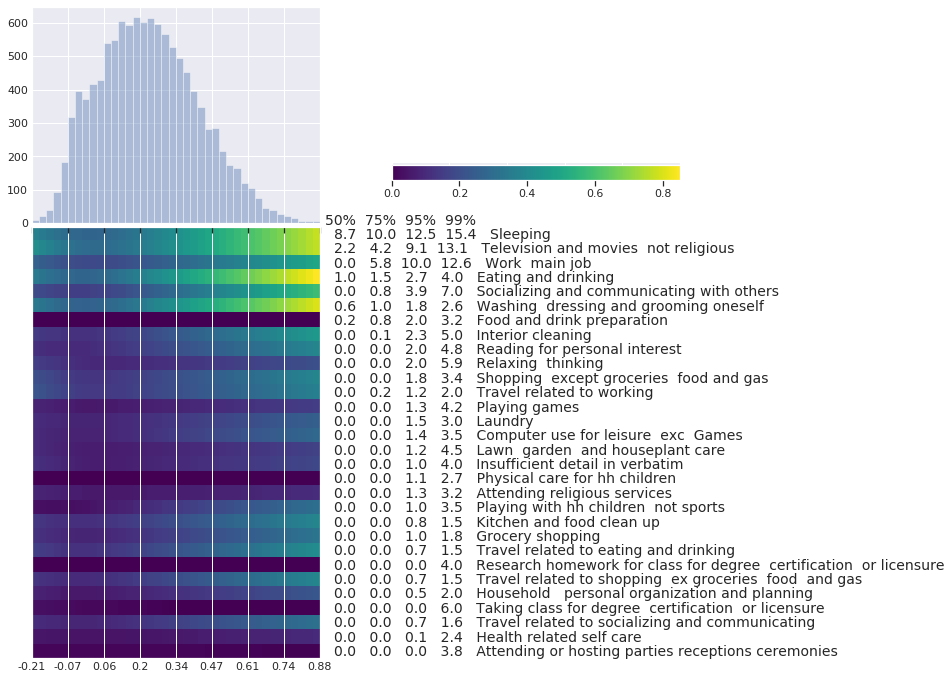

7627/7627 [==============================] - 8s 1ms/sample - loss: 0.1319 - val_loss: 0.1226
Epoch 2/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.1107

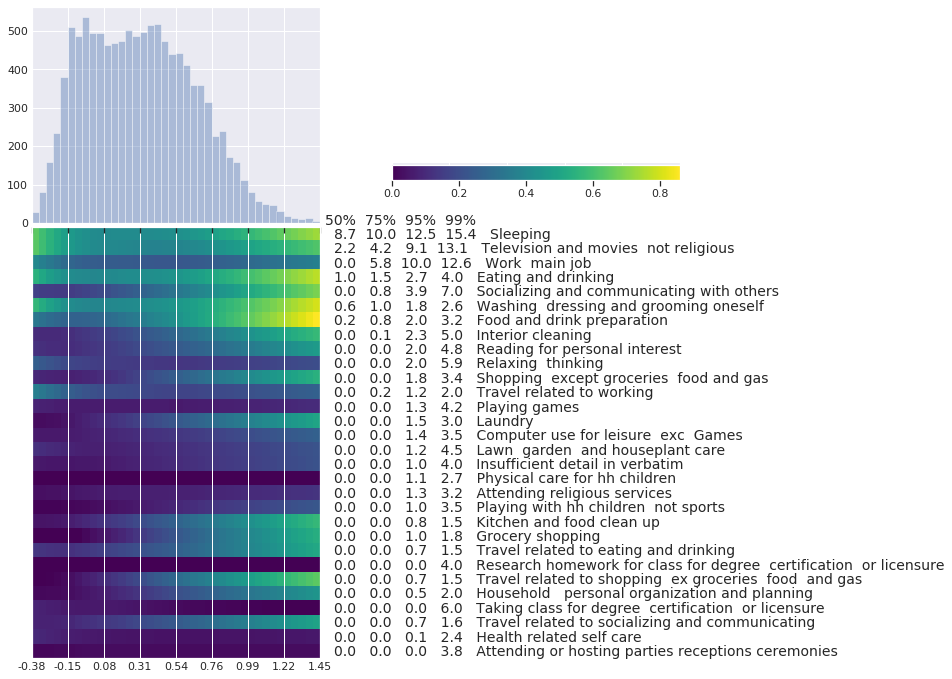

7627/7627 [==============================] - 7s 887us/sample - loss: 0.1107 - val_loss: 0.1073
Epoch 3/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.1085

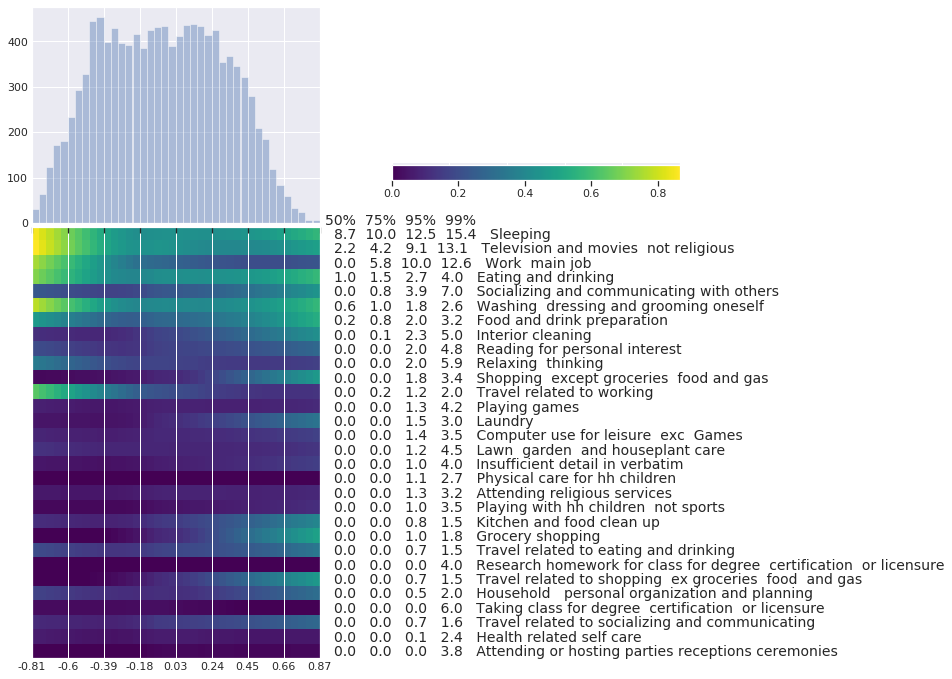

7627/7627 [==============================] - 7s 879us/sample - loss: 0.1085 - val_loss: 0.1084
Epoch 4/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0965

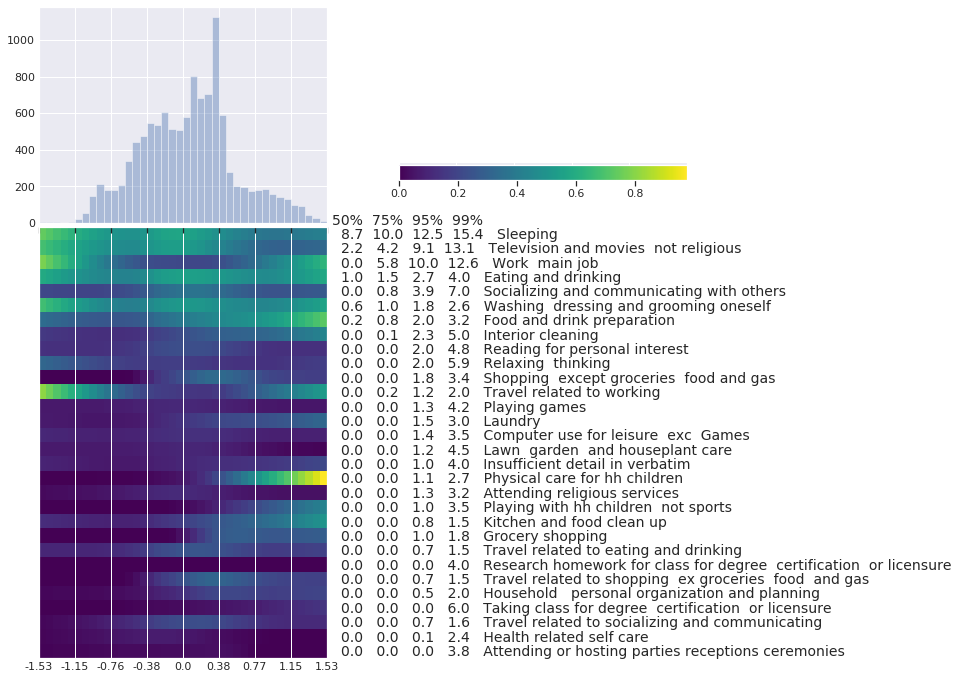

7627/7627 [==============================] - 7s 912us/sample - loss: 0.0966 - val_loss: 0.0972
Epoch 18/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0976

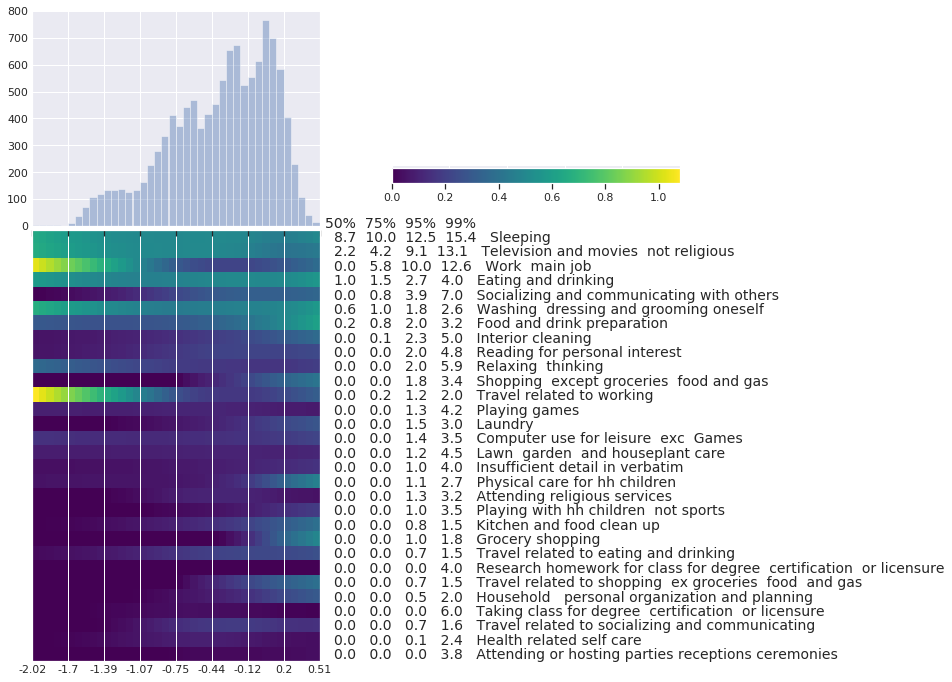

7627/7627 [==============================] - 7s 871us/sample - loss: 0.0976 - val_loss: 0.0978
Epoch 19/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0969

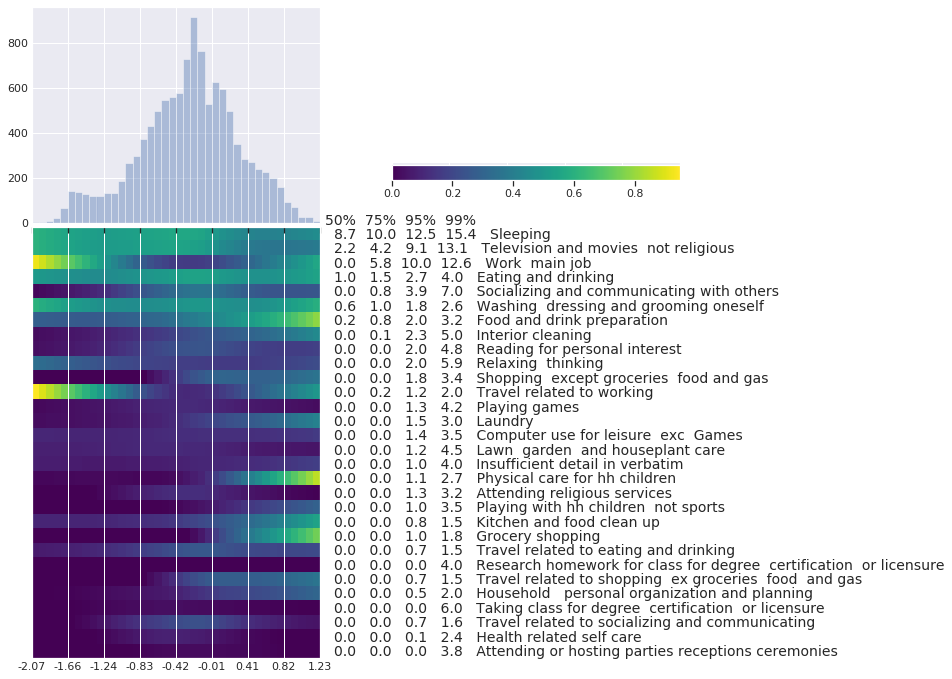

7627/7627 [==============================] - 7s 870us/sample - loss: 0.0967 - val_loss: 0.0969
Epoch 20/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0968

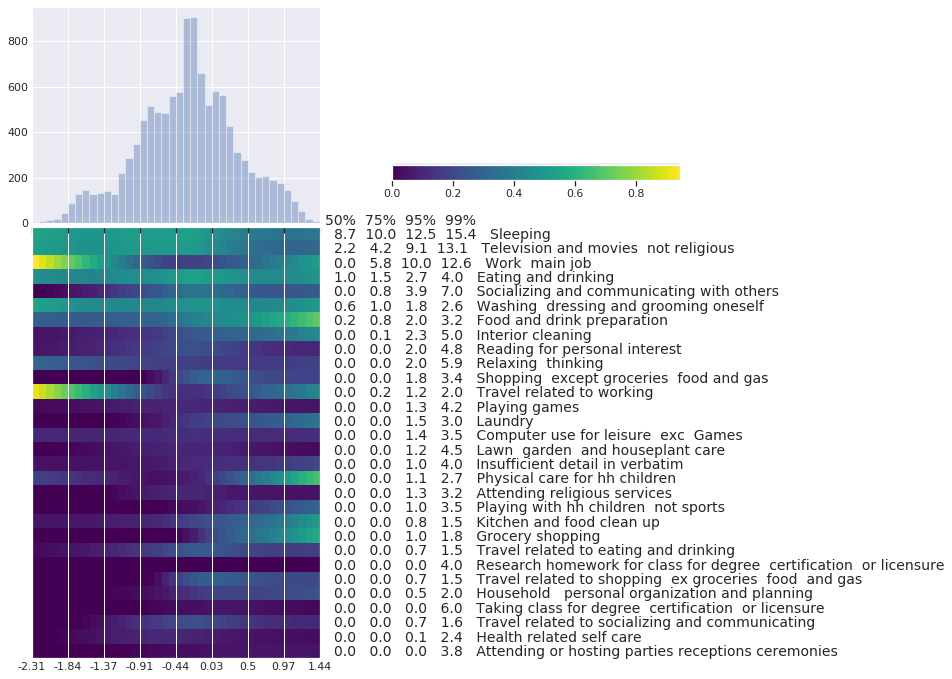

7627/7627 [==============================] - 7s 894us/sample - loss: 0.0967 - val_loss: 0.0965
Epoch 21/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0956

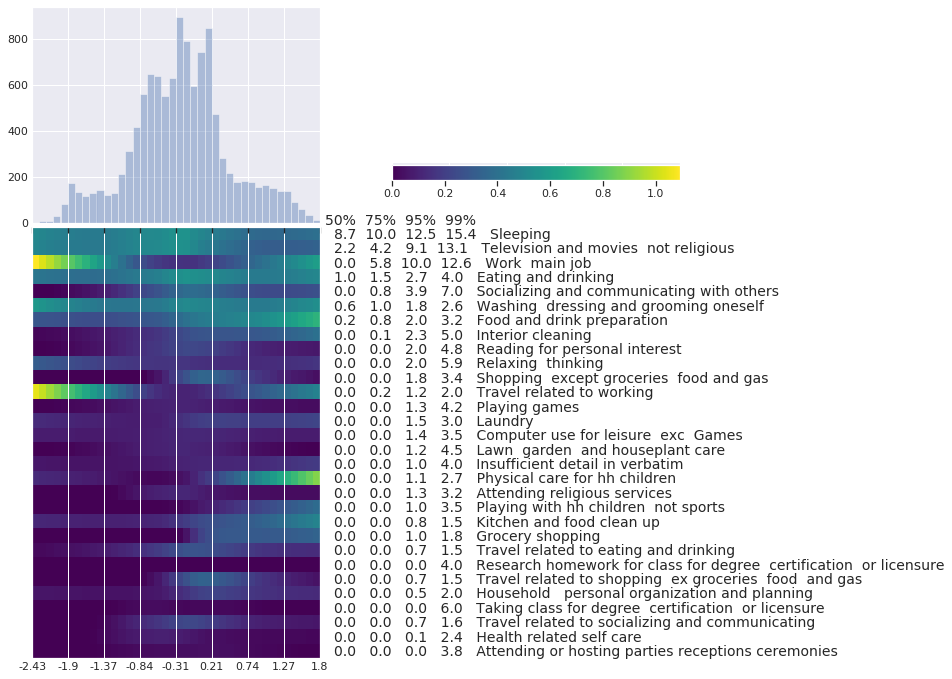

7627/7627 [==============================] - 7s 893us/sample - loss: 0.0956 - val_loss: 0.0962
Epoch 22/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0955

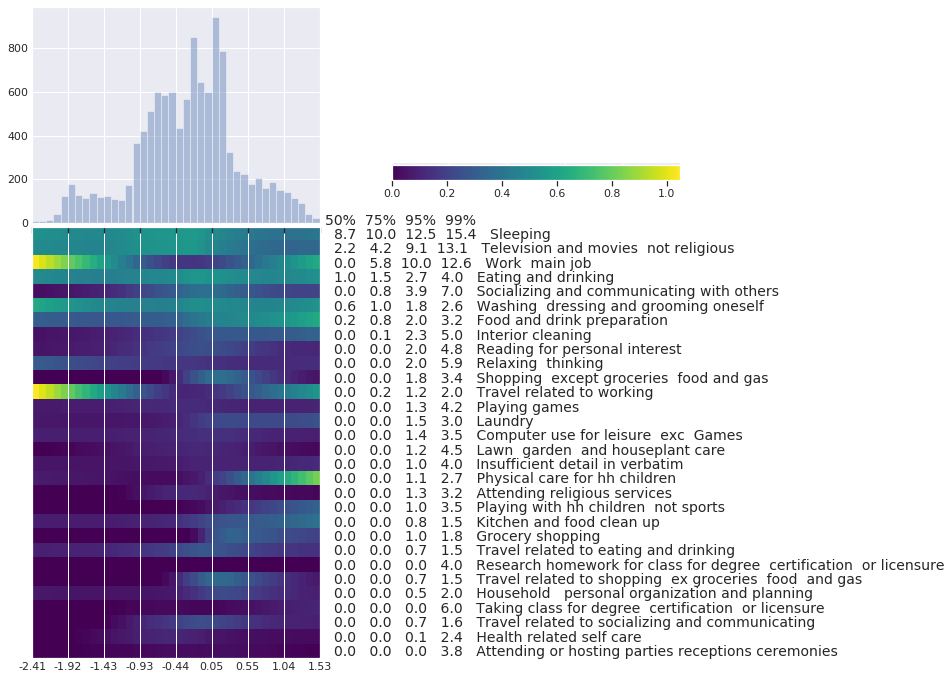

7627/7627 [==============================] - 7s 882us/sample - loss: 0.0956 - val_loss: 0.0956
Epoch 23/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0959

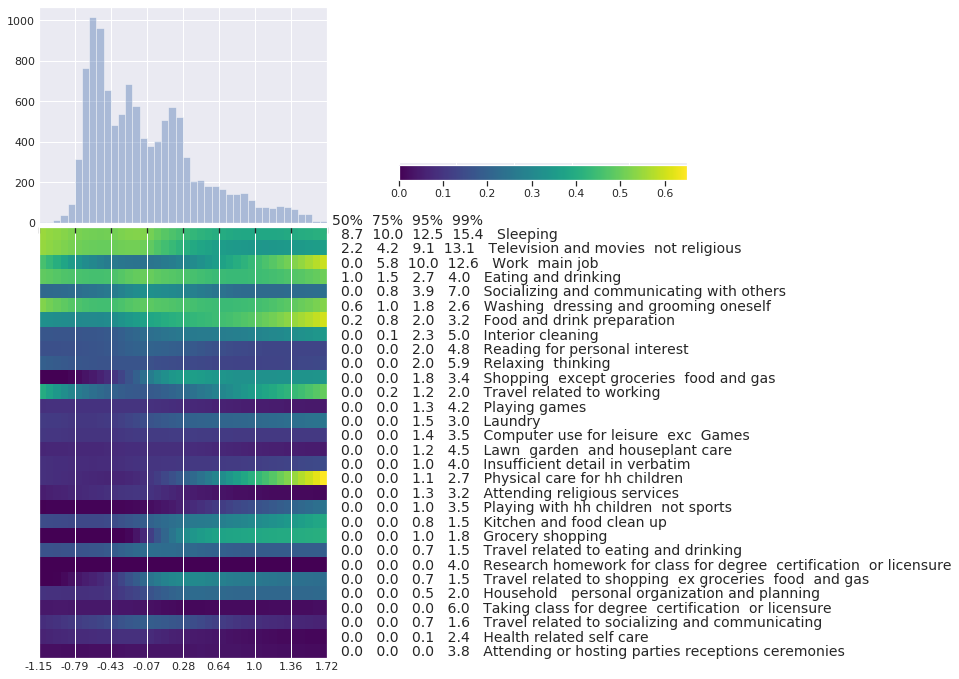

7627/7627 [==============================] - 7s 904us/sample - loss: 0.0959 - val_loss: 0.0981
Epoch 24/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0968

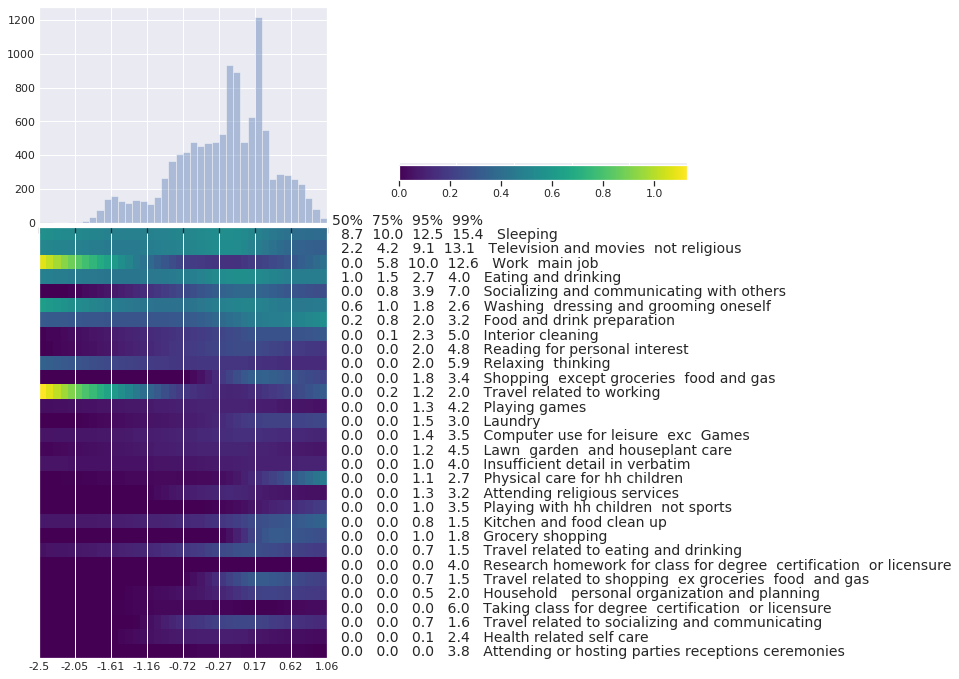

7627/7627 [==============================] - 7s 899us/sample - loss: 0.0967 - val_loss: 0.0970
Epoch 25/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.1004

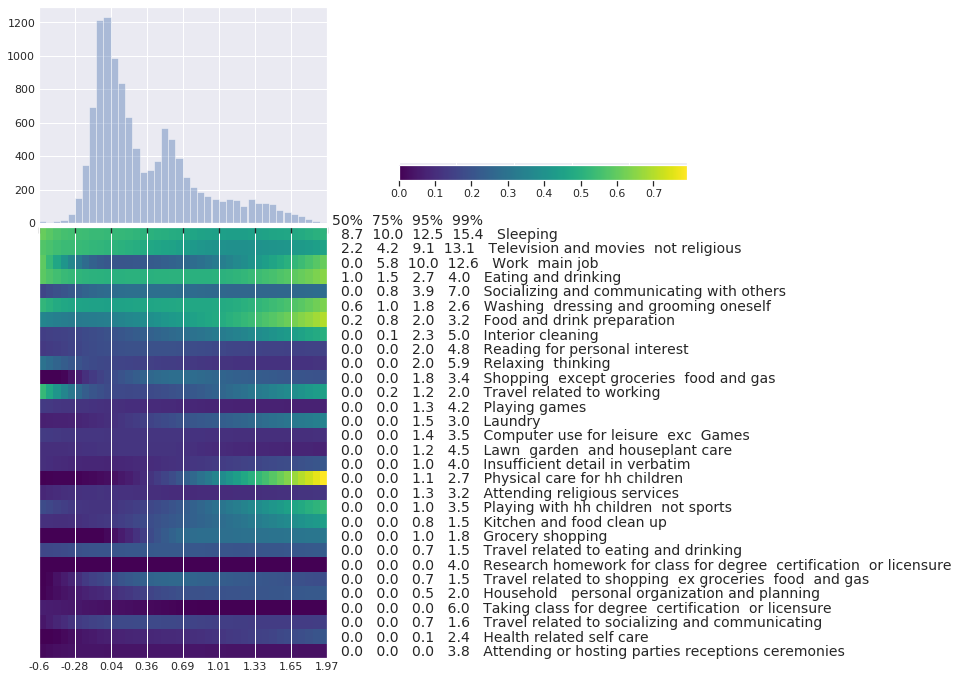

7627/7627 [==============================] - 7s 870us/sample - loss: 0.1004 - val_loss: 0.0989
Epoch 26/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0977

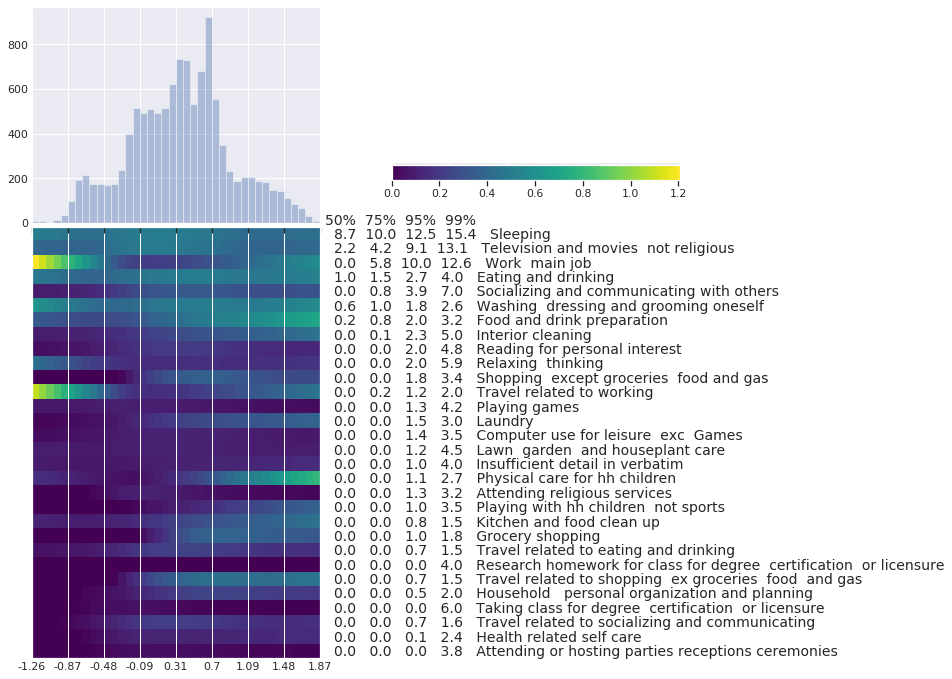

7627/7627 [==============================] - 7s 852us/sample - loss: 0.0977 - val_loss: 0.0994
Epoch 27/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.1040

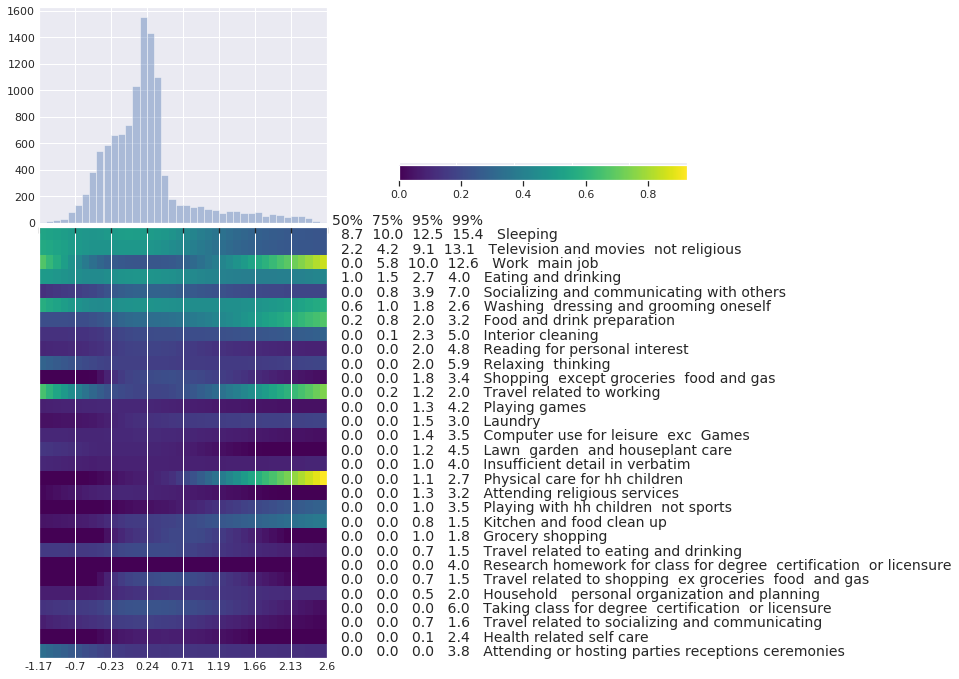

7627/7627 [==============================] - 8s 1ms/sample - loss: 0.1039 - val_loss: 0.1019
Epoch 28/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0994

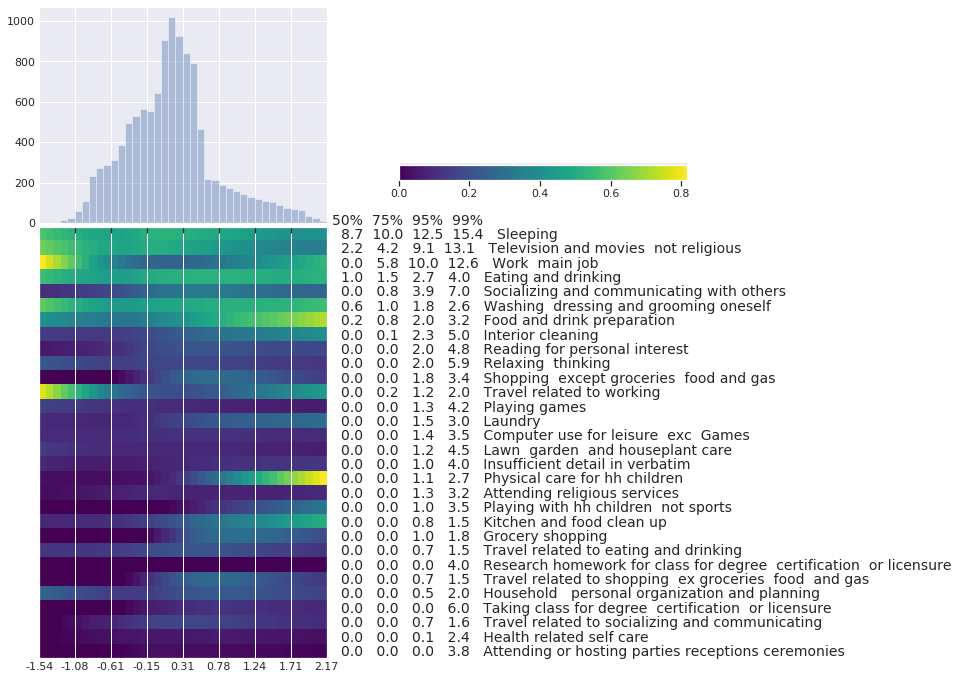

7627/7627 [==============================] - 7s 931us/sample - loss: 0.0995 - val_loss: 0.0992
Epoch 29/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0984

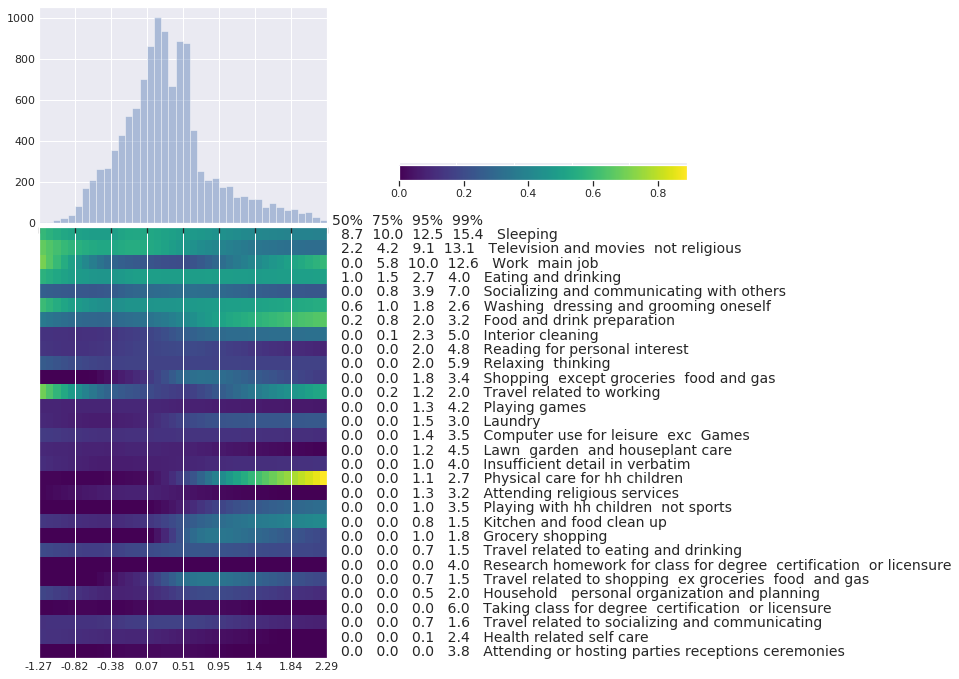

7627/7627 [==============================] - 7s 954us/sample - loss: 0.0985 - val_loss: 0.0981
Epoch 30/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0968

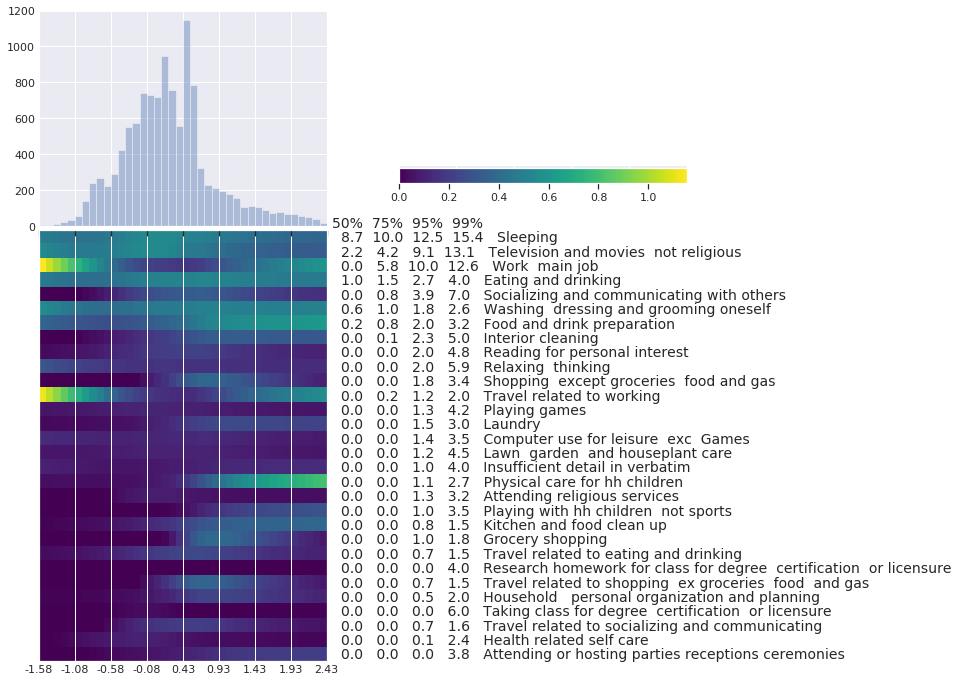

7627/7627 [==============================] - 7s 907us/sample - loss: 0.0967 - val_loss: 0.0968
Epoch 31/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0967

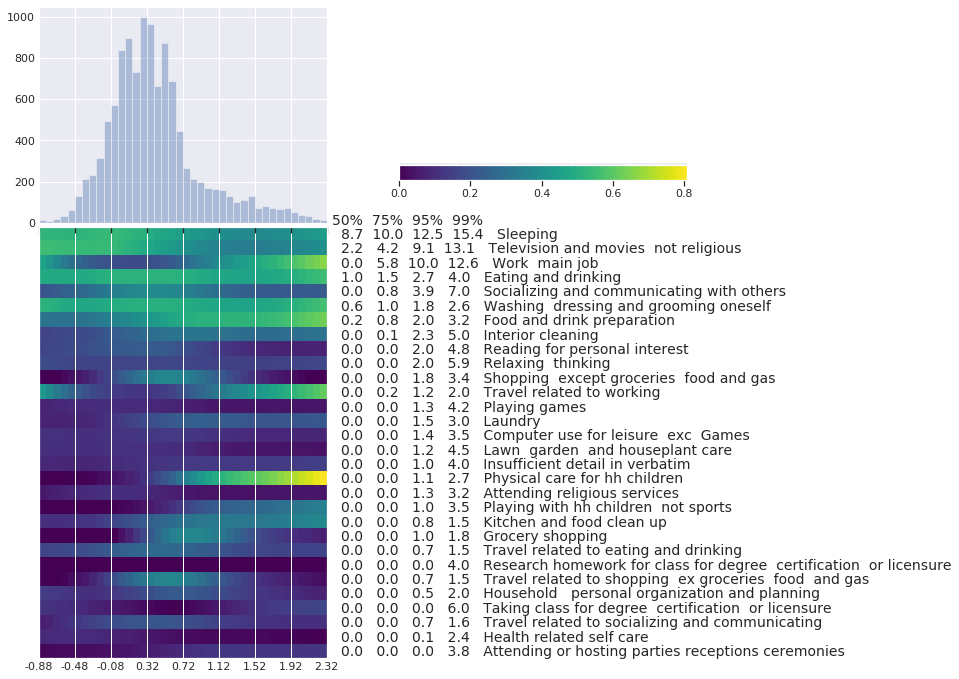

7627/7627 [==============================] - 7s 908us/sample - loss: 0.0967 - val_loss: 0.0987
Epoch 32/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0983
Epoch 00032: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.


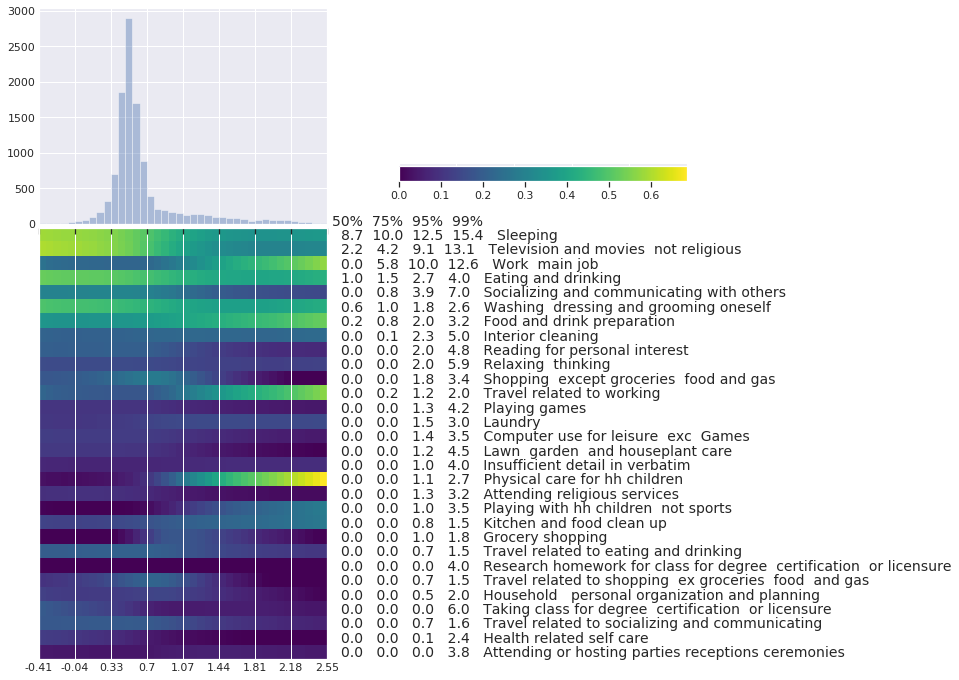

7627/7627 [==============================] - 7s 906us/sample - loss: 0.0983 - val_loss: 0.1011
Epoch 33/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0988

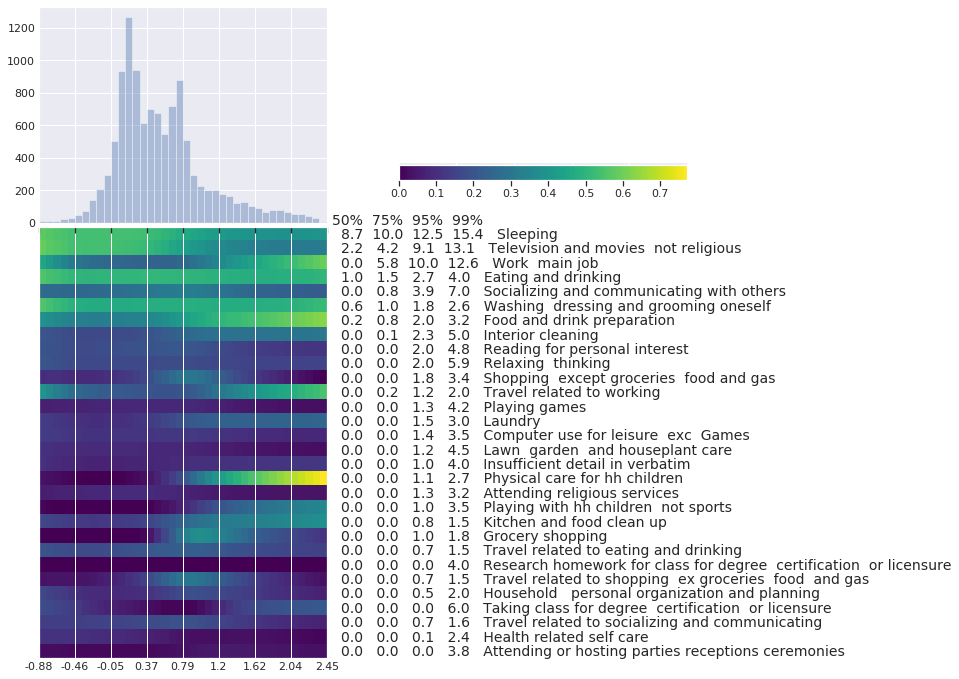

7627/7627 [==============================] - 7s 915us/sample - loss: 0.0988 - val_loss: 0.0978
Epoch 34/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0967

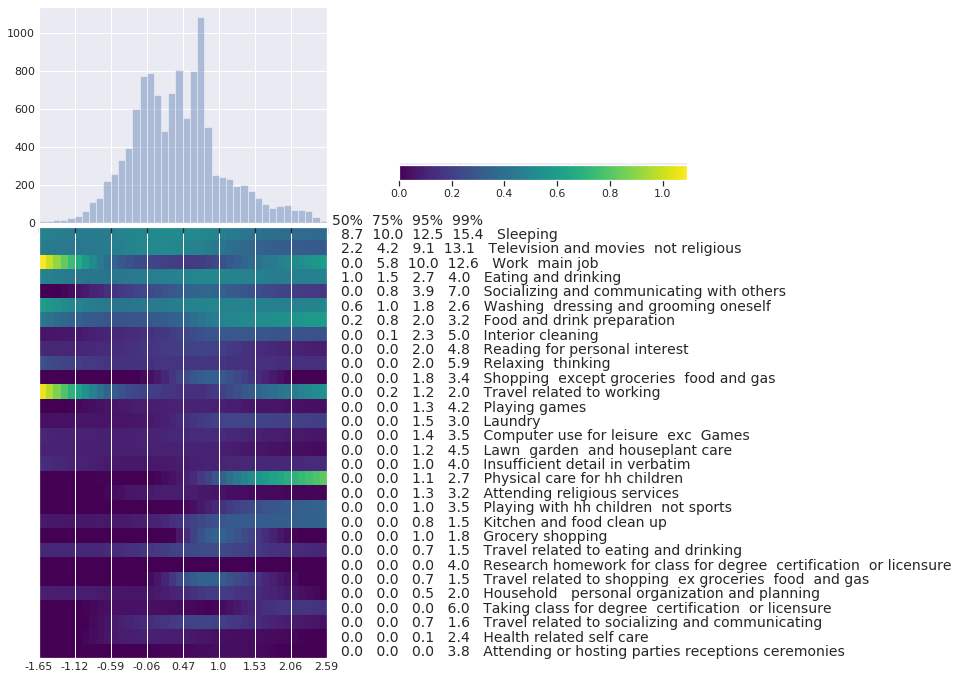

7627/7627 [==============================] - 7s 921us/sample - loss: 0.0967 - val_loss: 0.0970
Epoch 35/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0964

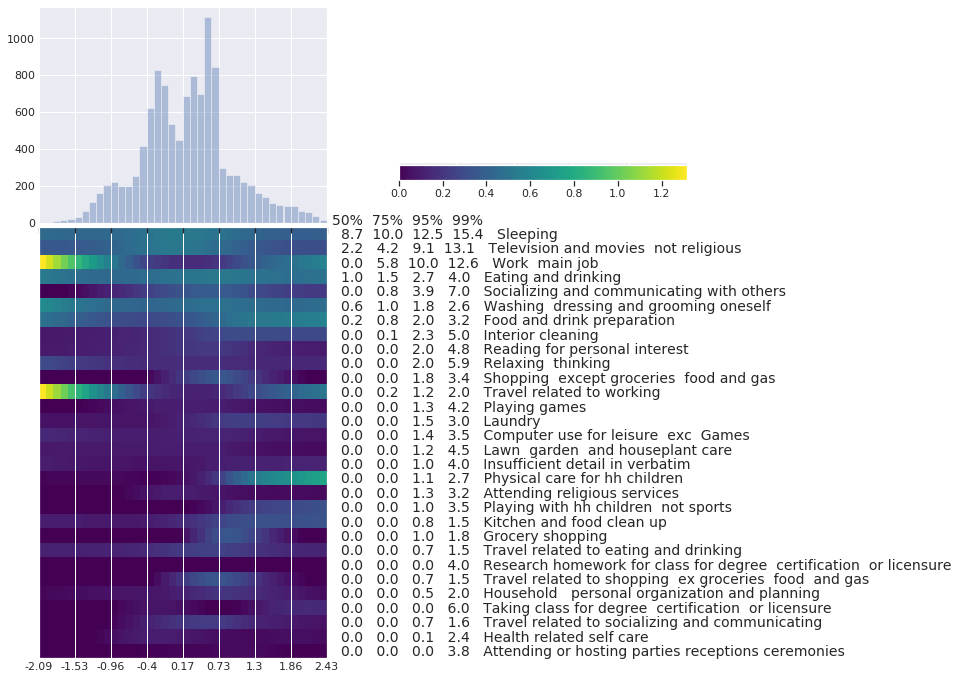

7627/7627 [==============================] - 7s 944us/sample - loss: 0.0965 - val_loss: 0.0968
Epoch 36/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0959

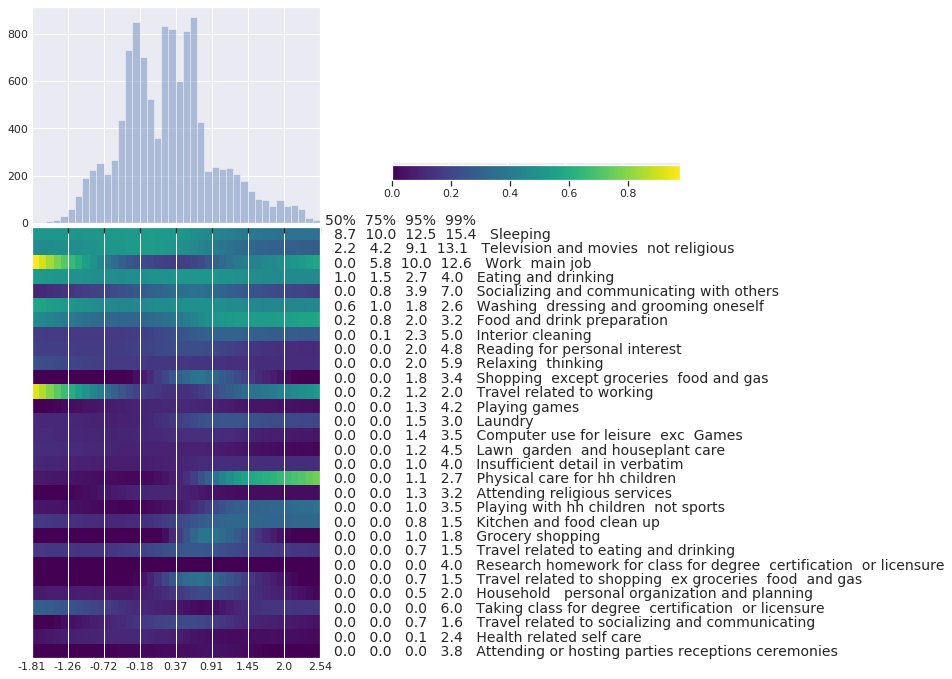

7627/7627 [==============================] - 7s 909us/sample - loss: 0.0959 - val_loss: 0.0963
Epoch 37/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0953

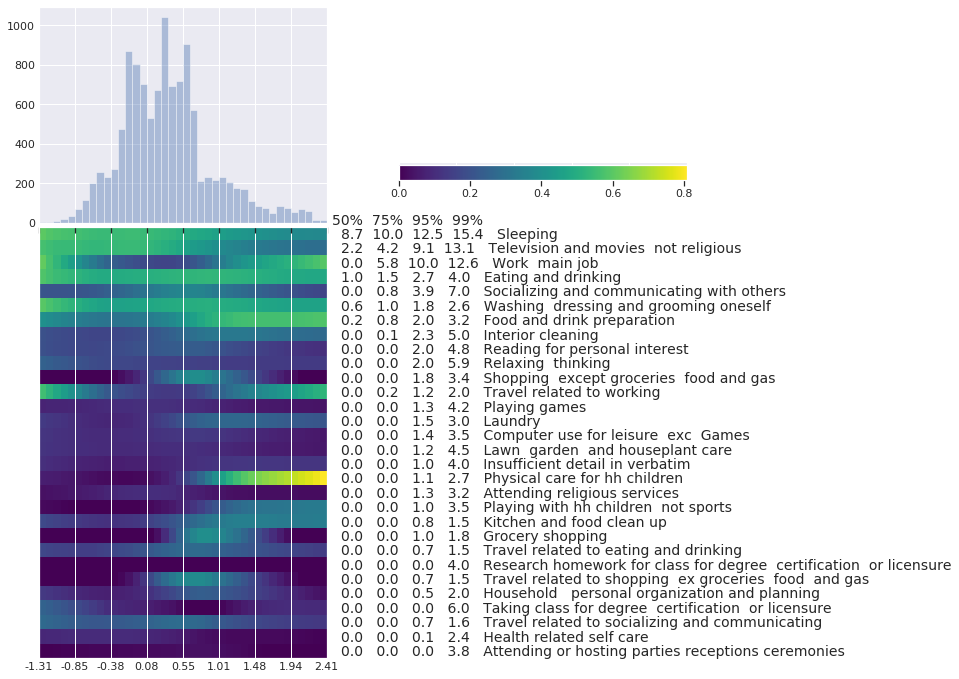

7627/7627 [==============================] - 7s 928us/sample - loss: 0.0954 - val_loss: 0.0964
Epoch 38/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0959

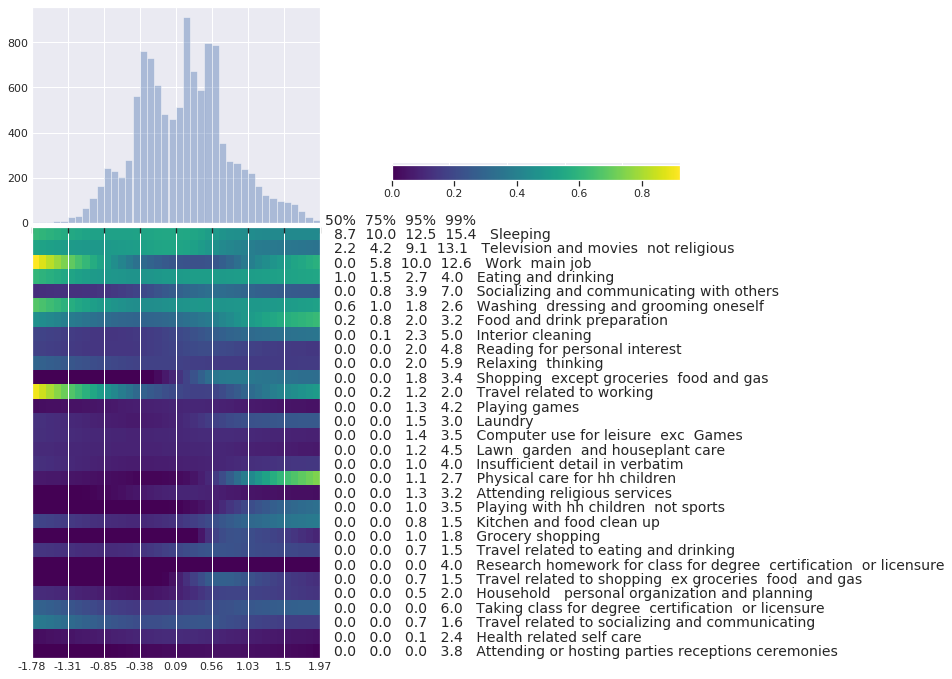

7627/7627 [==============================] - 7s 922us/sample - loss: 0.0958 - val_loss: 0.0981
Epoch 39/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0964

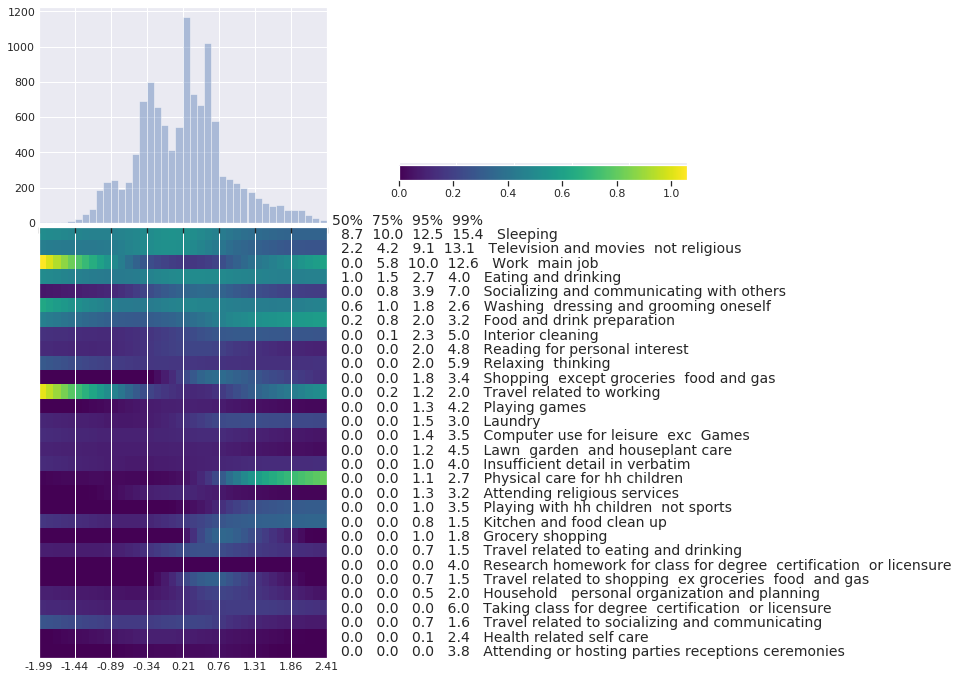

7627/7627 [==============================] - 7s 925us/sample - loss: 0.0965 - val_loss: 0.0962
Epoch 40/40
7552/7627 [============================>.] - ETA: 0s - loss: 0.0950

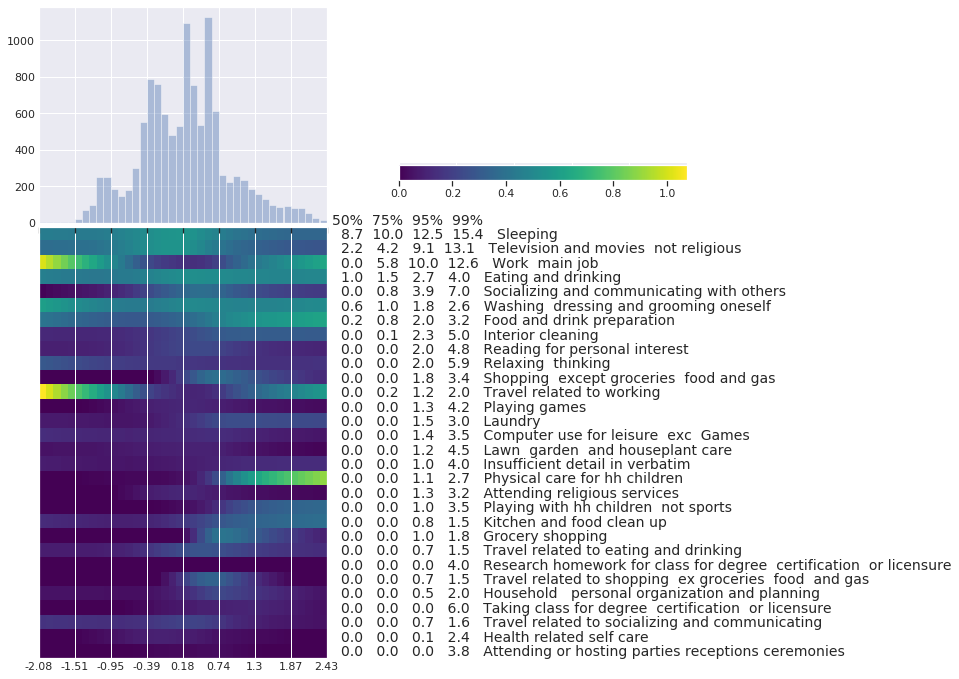

7627/7627 [==============================] - 7s 923us/sample - loss: 0.0950 - val_loss: 0.0953


In [0]:
seed(100)
set_random_seed(100)
im_store = []
dp_store = []
(vae, encoder, decoder) = make_vae(l2_penalty=0.000001,
                                   l1_penalty=0.0, 
                                   encoder_dropout_rate=0.2)  # encoder_dropout_rate 0.2
vae.summary()

fitted = vae.fit(
    x=x_train, 
    y=None,
    shuffle=True,
    epochs=epochs,
    batch_size=batch_size,
    validation_data=(x_test, None),
    callbacks = callback_list
    )

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.path as path
import matplotlib.animation as animation
from matplotlib import animation, rc
from IPython.display import HTML

import matplotlib.pyplot as plt
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
import seaborn as sns

sns.set()
sns.set_style("darkgrid")

def plot_animated(decoder, data, n_type = 40, each_hight = 20, approx_width=400, 
               n_activity =  30, lowest_percentile= 0.1, 
               highest_percentile = 99.9, figsize=(10, 10),
               cmap='viridis', n_xlabels=9, spacing = -0.02, standard_scaler=True):

  global im_store
  global dp_store

  plt.rcParams['axes.facecolor'] = 'white'
    
  # definitions for the axes
  left, width = 0.05, 0.40
  bottom, height = 0.025, 0.65

  rect_scatter = [left, bottom, width, height]
  rect_histx = [left, bottom + height + spacing, width, 0.3]
  rect_colorbar = [left+width+0.1, bottom + height + spacing +0.05, width, 0.03]

  # start with a rectangular Figure
  #fig, ax = plt.subplots()
  #plt.figure(figsize=figsize)
  fig, (ax_histx, ax_scatter, ax_colorbar) = plt.subplots(3,1, figsize=figsize)

  ax_scatter = plt.axes(rect_scatter)
  ax_scatter.tick_params(direction='in', top=True, right=True)
  ax_histx = plt.axes(rect_histx)
  ax_histx.tick_params(direction='in', labelbottom=False)
  ax_colorbar = plt.axes(rect_colorbar)
  ax_colorbar.tick_params(direction='in', labelbottom=False, labelleft=False)

  each_width = np.int(np.ceil(approx_width/n_type))
  figure = np.zeros((each_hight*n_activity,n_type*each_width))
  # Linearly spaced coordinates on the unit square were transformed
  # through the inverse CDF (ppf) of the Gaussian
  # to produce values of the latent variables z,
  # since the prior of the latent space is Gaussian

  # We need to add a column of ones to indicate validation
  test_examples = data.shape[0]
  flag_1 = np.ones((test_examples,1),dtype=data.values.dtype)
  data = np.concatenate((data.values,flag_1),axis=-1)
  encoded_data=encoder.predict(data)

  lowest=np.percentile(encoded_data, lowest_percentile)
  highest=np.percentile(encoded_data, highest_percentile)

  grid_x = np.linspace(lowest, highest, n_type)

  for i, xi in enumerate(grid_x):
      z_sample = np.array([[xi]])
      x_decoded = decoder.predict(z_sample)
      figure[0:n_activity*each_hight,i*each_width : (i + 1)*each_width] = \
      np.repeat(x_decoded[0,0:n_activity],each_hight).reshape(n_activity*each_hight,1)

  if standard_scaler:
    figure=np.transpose(figure)
    scaler = StandardScaler()
    figure=scaler.fit_transform(figure)
    figure=np.transpose(figure)

  im = ax_scatter.imshow(figure, cmap=cmap)
  plt.colorbar(im, ax= ax_colorbar, orientation='horizontal', fraction=1)

  prec = pd.DataFrame(np.percentile(df,[50, 75, 95, 99],axis=0))

  ax_scatter.text(1.02*n_type*each_width,
                  0.8*each_hight -each_hight, '50%  75%  95%  99%', fontsize=12)

  for i in range(n_activity):

    ax_scatter.text(1.02*n_type*each_width,
                    0.8*each_hight+i*each_hight, 
                    '{:5.1f} {:5.1f} {:5.1f} {:5.1f}   '.format(prec.iloc[0,i]/60, 
                                                              prec.iloc[1,i]/60,
                                                              prec.iloc[2,i]/60,
                                                              prec.iloc[3,i]/60)  
                    + df.columns[i].replace("_", " ")
  , fontsize=14)

  bins=np.append(grid_x-(grid_x[1]-grid_x[0])/2,
                  grid_x[n_type-1]+(grid_x[1]-grid_x[0])/2)


  ax_scatter.set_xticks( np.linspace(0,n_type*each_width,n_xlabels))
  ax_scatter.set_xticklabels(np.round(np.linspace(bins[0], bins[n_type], n_xlabels),
                                      decimals=2))  
  ax_scatter.set_yticks([])

  ax_histx.set_xticks( np.linspace(bins[0], bins[n_type], n_xlabels))
  ax_histx.set_xticklabels(np.round(np.linspace(bins[0], bins[n_type], n_xlabels),
                                      decimals=2))

  # histogram our data with numpy
  data = dp_store[0]
  n, bins = np.histogram(data, 100)

  # get the corners of the rectangles for the histogram
  left = np.array(bins[:-1])
  right = np.array(bins[1:])
  bottom = np.zeros(len(left))
  top = bottom + n
  nrects = len(left)

  nverts = nrects * (1 + 3 + 1)
  verts = np.zeros((nverts, 2))
  codes = np.ones(nverts, int) * path.Path.LINETO
  codes[0::5] = path.Path.MOVETO
  codes[4::5] = path.Path.CLOSEPOLY
  verts[0::5, 0] = left
  verts[0::5, 1] = bottom
  verts[1::5, 0] = left
  verts[1::5, 1] = top
  verts[2::5, 0] = right
  verts[2::5, 1] = top
  verts[3::5, 0] = right
  verts[3::5, 1] = bottom

  patch = None

  barpath = path.Path(verts, codes)
  patch = patches.PathPatch(
      barpath, facecolor='green', edgecolor='yellow', alpha=0.5)

  ax_histx.add_patch(patch)
  ax_histx.set_xlim(left[0], right[-1])
  ax_histx.set_ylim(bottom.min(), 1.8*top.max())

  im = ax_scatter.imshow(im_store[0], cmap=cmap)

  # Hide grid lines
  #ax_histx.grid(False)
  #ax_scatter.grid(False)
  #ax_colorbar.grid(False)

  ## Hide axes ticks
  #ax.set_xticks([])
  #ax.set_yticks([])
  #ax.set_zticks([])

  #plt.grid(b=None)

  def animate(i):

    data = dp_store[i]
    n, bins = np.histogram(data, 100)
    top = bottom + n
    verts[1::5, 1] = top
    verts[2::5, 1] = top
    ax_histx.set_title("Epoch " + str(i+1))
    im.set_array(im_store[i])

    return [patch,im, ]
  plt.close()
  anim = animation.FuncAnimation(fig, animate, epochs, repeat=False, blit=True)
  rc('animation', html='html5')
  return(anim)

In [0]:
plot_animated(decoder,qt, standard_scaler = False)

In [0]:
len(im_store)

40

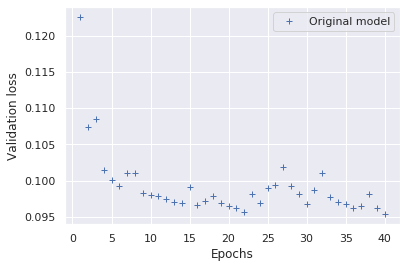

In [0]:
epochs_grid = range(1, epochs+1)
val_loss1 = fitted.history['val_loss']
#val_loss2 = fitted2.history['val_loss']


import matplotlib.pyplot as plt

# b+ is for "blue cross"
plt.plot(epochs_grid, val_loss1, 'b+', label='Original model')
# "bo" is for "blue dot"
#plt.plot(epochs_grid, val_loss2, 'bo', label='Alternative model')
plt.xlabel('Epochs')
plt.ylabel('Validation loss')
plt.legend()

plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:39: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


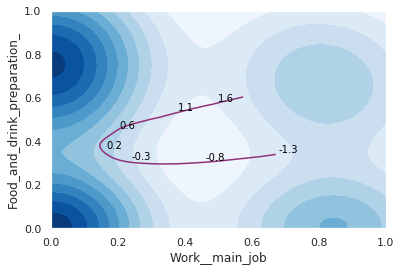

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt

def encode_plot2d(
    data,
    encoder, 
    decoder,
    ax=plt.axes(),
    x_col = 'Work__main_job',
    y_col = 'Food_and_drink_preparation_',
    lowest_percentile=1,
    highest_percentile = 99,
    n=70,
    step=10):

  flag_1 = np.ones((data.shape[0],1),dtype=data.values.dtype)
  data_ = np.concatenate((data.values,flag_1),axis=-1)
  encoded_data=encoder.predict(data_)

  lowest=np.percentile(encoded_data, lowest_percentile)
  highest=np.percentile(encoded_data, highest_percentile)

  grid_x = np.linspace(lowest, highest, n)

  filtered=pd.DataFrame((decoder.predict(grid_x)))
  filtered.columns = df.columns
  
  sns.kdeplot(data[x_col], data[y_col], cmap="Blues", shade=True, bw=.2, cut=0, legend=True, ax=ax)
  sns.lineplot(x = filtered[x_col], y=filtered[y_col], linewidth=1.5, 
                color= '#8E3179', sort=False, ax=ax)
  
  for i in range(0,n,step):
      ax.text(filtered[x_col][i]+0.01, filtered[y_col][i]+0.01, np.round(grid_x[i],1), 
              horizontalalignment='left', size='small', color='black')
  
  plt.savefig(x_col+'_'+y_col+'.png')
  plt.show()
  
encode_plot2d(qt,encoder,decoder, ax=plt.axes())

In [0]:
flag_1 = np.ones((qt.shape[0],1),dtype=qt.values.dtype)
data = np.concatenate((qt.values,flag_1),axis=-1)
encoded_data=encoder.predict(data)
pd.DataFrame(encoded_data)

,0
0,0.127096
1,0.879971
2,0.686847
3,0.072278
4,-0.490403
...,...
11380,-0.248035
11381,-0.804245
11382,-0.755463
11383,-0.447285


In [0]:
filtered=pd.DataFrame((decoder.predict(encoded_data)))
filtered.columns = df.columns
filtered

,Sleeping,Television_and_movies__not_religious_,Work__main_job,Eating_and_drinking,Socializing_and_communicating_with_others,Washing__dressing_and_grooming_oneself,Food_and_drink_preparation_,Interior_cleaning,Reading_for_personal_interest,Relaxing__thinking_,Shopping__except_groceries__food_and_gas,Travel_related_to_working,Playing_games,Laundry,Computer_use_for_leisure__exc__Games_,Lawn__garden__and_houseplant_care,Insufficient_detail_in_verbatim,Physical_care_for_hh_children,Attending_religious_services,Playing_with_hh_children__not_sports,Kitchen_and_food_clean_up,Grocery_shopping,Travel_related_to_eating_and_drinking,Research_homework_for_class_for_degree__certification__or_licensure,Travel_related_to_shopping__ex_groceries__food__and_gas,Household___personal_organization_and_planning,Taking_class_for_degree__certification__or_licensure,Travel_related_to_socializing_and_communicating,Health_related_self_care,Attending_or_hosting_parties_receptions_ceremonies,Work__other_job_s_,Gap_can_t_remember,Travel_related_to_caring_for___helping_hh_children,Sleeplessness,Travel_related_to_grocery_shopping,Walking,Care_for_animals_and_pets__not_veterinary_care_,Walking___exercising___playing_with_animals,Participation_in_religious_practices,Interior_arrangement__decoration____repairs,...,Travel_rel__to_socializing__relaxing____leisure__n_e_c__,Waiting_associated_w_banking_financial_services,Waiting_associated_w_admin__activities__education_,Travel_related_to_using_lawn_and_garden_services,Travel_related_to_nonhh_children_s_education,Waiting_associated_with_work_related_activities,Using_interior_cleaning_services_,Waiting_assoc__w_attending_hosting_social_events,Watching_rugby,Watching_skiing__ice_skating__snowboarding,Travel_related_to_personal_care__n_e_c__,Travel_related_to_education__n_e_c__,Travel_related_to_using_household_services__n_e_c__,Travel_related_to_work__n_e_c__,Travel_rel__to_religious_spiritual_activities__n_e_c__,Waiting_associated_w_purchasing_selling_real_estate,Waiting_associated_with_socializing__n_e_c__,Travel_related_to_consumer_purchases__n_e_c__,Security_procedures_related_to_work,Using_pet_services__n_e_c__,Telephone_calls_to_from_paid_child_or_adult_care_providers,Travel_related_to_using_legal_services,Lawn_and_garden__n_e_c___,Waiting_associated_with_research_homework,Waiting_associated_with_pet_services,Waiting_associated_with_other_income_generating_activities,Using_vehicle_maint____repair_svcs__n_e_c__,Housework__n_e_c___,Using_lawn_and_garden_services__n_e_c__,Security_procedures_rel__to_govt_svcs_civic_obligations__n_e_c__,Activities_related_to_nonhh_child_s_educ___n_e_c__,Waiting_associated_with_job_search_or_interview,Work_and_work_related_activities__n_e_c__,Government_services__n_e_c__,Public_health___safety_activities__n_e_c__,Travel_related_to_household_activities__n_e_c__,Travel_rel__to_govt_svcs___civic_obligations__n_e_c__,Food___drink_prep__presentation____clean_up__n_e_c___,Telephone_calls__n_e_c__,Public_health_activities
0,0.557949,0.549851,0.157089,0.521018,0.347192,0.490979,0.351089,0.219946,0.220545,0.174925,0.180664,0.127871,0.114603,0.130634,0.124232,0.097888,0.083456,0.044129,0.113868,0.030203,0.162923,0.000000,0.242441,0.0,0.156129,0.111077,0.070642,0.207839,0.091111,0.027582,0.0,0.065738,0.000000,0.035077,0.000000,0.053686,0.095220,0.059809,0.060279,0.018064,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.435163,0.392049,0.285756,0.506465,0.325630,0.480983,0.497030,0.309278,0.201013,0.154309,0.358778,0.218423,0.083875,0.251452,0.132206,0.085636,0.118514,0.394969,0.064367,0.198067,0.304005,0.407397,0.244987,0.0,0.284313,0.218208,0.102771,0.145766,0.043053,0.030899,0.0,0.084877,0.288554,0.048597,0.364955,0.045293,0.117503,0.065146,0.046272,0.025661,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

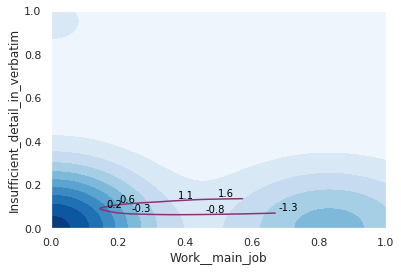

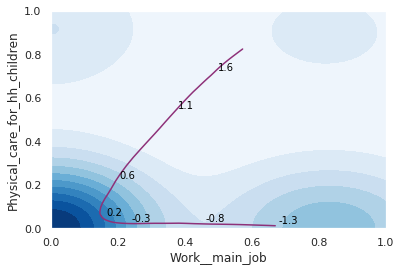

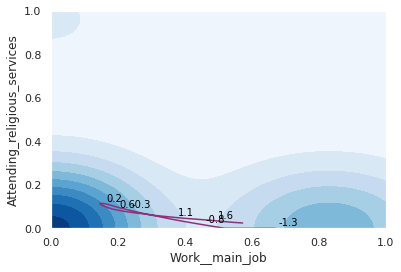

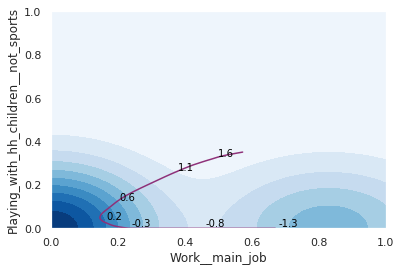

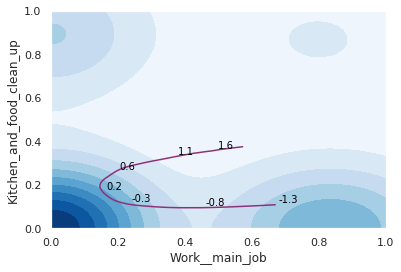

...

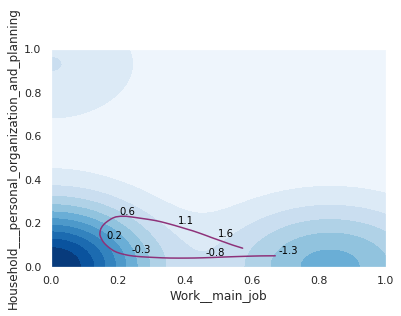

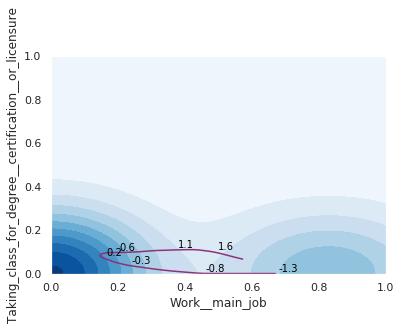

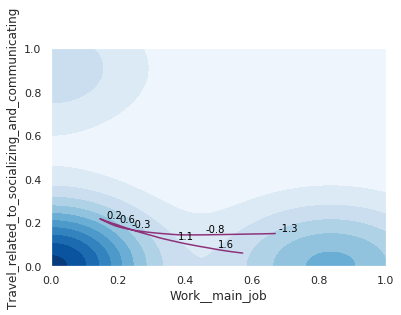

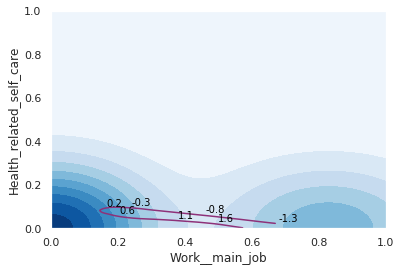

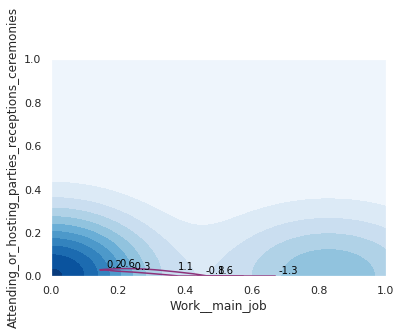

In [0]:
for field in filtered.columns[16:30]:
    
     encode_plot2d(qt,encoder,decoder, ax=plt.axes(), y_col=field)

In [0]:
filtered-qt

,Sleeping,Television_and_movies__not_religious_,Work__main_job,Eating_and_drinking,Socializing_and_communicating_with_others,Washing__dressing_and_grooming_oneself,Food_and_drink_preparation_,Interior_cleaning,Reading_for_personal_interest,Relaxing__thinking_,Shopping__except_groceries__food_and_gas,Travel_related_to_working,Playing_games,Laundry,Computer_use_for_leisure__exc__Games_,Lawn__garden__and_houseplant_care,Insufficient_detail_in_verbatim,Physical_care_for_hh_children,Attending_religious_services,Playing_with_hh_children__not_sports,Kitchen_and_food_clean_up,Grocery_shopping,Travel_related_to_eating_and_drinking,Research_homework_for_class_for_degree__certification__or_licensure,Travel_related_to_shopping__ex_groceries__food__and_gas,Household___personal_organization_and_planning,Taking_class_for_degree__certification__or_licensure,Travel_related_to_socializing_and_communicating,Health_related_self_care,Attending_or_hosting_parties_receptions_ceremonies,Work__other_job_s_,Gap_can_t_remember,Travel_related_to_caring_for___helping_hh_children,Sleeplessness,Travel_related_to_grocery_shopping,Walking,Care_for_animals_and_pets__not_veterinary_care_,Walking___exercising___playing_with_animals,Participation_in_religious_practices,Interior_arrangement__decoration____repairs,...,Travel_rel__to_socializing__relaxing____leisure__n_e_c__,Waiting_associated_w_banking_financial_services,Waiting_associated_w_admin__activities__education_,Travel_related_to_using_lawn_and_garden_services,Travel_related_to_nonhh_children_s_education,Waiting_associated_with_work_related_activities,Using_interior_cleaning_services_,Waiting_assoc__w_attending_hosting_social_events,Watching_rugby,Watching_skiing__ice_skating__snowboarding,Travel_related_to_personal_care__n_e_c__,Travel_related_to_education__n_e_c__,Travel_related_to_using_household_services__n_e_c__,Travel_related_to_work__n_e_c__,Travel_rel__to_religious_spiritual_activities__n_e_c__,Waiting_associated_w_purchasing_selling_real_estate,Waiting_associated_with_socializing__n_e_c__,Travel_related_to_consumer_purchases__n_e_c__,Security_procedures_related_to_work,Using_pet_services__n_e_c__,Telephone_calls_to_from_paid_child_or_adult_care_providers,Travel_related_to_using_legal_services,Lawn_and_garden__n_e_c___,Waiting_associated_with_research_homework,Waiting_associated_with_pet_services,Waiting_associated_with_other_income_generating_activities,Using_vehicle_maint____repair_svcs__n_e_c__,Housework__n_e_c___,Using_lawn_and_garden_services__n_e_c__,Security_procedures_rel__to_govt_svcs_civic_obligations__n_e_c__,Activities_related_to_nonhh_child_s_educ___n_e_c__,Waiting_associated_with_job_search_or_interview,Work_and_work_related_activities__n_e_c__,Government_services__n_e_c__,Public_health___safety_activities__n_e_c__,Travel_related_to_household_activities__n_e_c__,Travel_rel__to_govt_svcs___civic_obligations__n_e_c__,Food___drink_prep__presentation____clean_up__n_e_c___,Telephone_calls__n_e_c__,Public_health_activities
0,-0.013622,-0.281981,0.157089,0.216214,0.347192,0.179668,0.351089,0.219946,0.220545,0.174925,0.180664,0.127871,0.114603,0.130634,0.124232,0.097888,0.083456,0.044129,0.113868,0.030203,0.162923,0.000000,0.242441,-0.997387,0.156129,0.111077,0.070642,0.207839,0.091111,0.027582,0.0,0.065738,0.000000,0.035077,0.000000,0.053686,0.095220,0.059809,0.060279,0.018064,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-0.258030,-0.008851,0.285756,-0.139681,0.325630,-0.027025,-0.328295,-0.473004,-0.590778,0.154309,0.358778,0.218423,0.083875,0.251452,-0.787714,0.085636,0.118514,-0.566993,0.064367,-0.797795,-0.547847,-0.551061,0.244987,0.000000,0.284313,-0.653163,0.102771,0.145766,0.043053,0.030899,0.0,0.084877,0.288554,0.048597,-0.512923,0.045293,0.117503,0.065146,0.046272,0.025661,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [0]:
dp_store

[array([[-0.05829187],
        [ 0.5299448 ],
        [ 0.25982657],
        ...,
        [ 0.17279755],
        [ 0.13163953],
        [ 0.565643  ]], dtype=float32), array([[ 0.03833402],
        [ 0.83745164],
        [ 0.48814017],
        ...,
        [-0.12569477],
        [ 0.05050111],
        [ 0.73509383]], dtype=float32), array([[-0.33361754],
        [ 0.51550096],
        [ 0.27147144],
        ...,
        [-0.5739293 ],
        [-0.29298192],
        [ 0.4525864 ]], dtype=float32), array([[-0.01329234],
        [ 0.81029385],
        [ 0.5687485 ],
        ...,
        [-0.41932002],
        [-0.14018708],
        [ 0.5201547 ]], dtype=float32), array([[-0.07086411],
        [ 0.924788  ],
        [ 0.704018  ],
        ...,
        [-0.5573919 ],
        [-0.20462991],
        [ 0.931041  ]], dtype=float32), array([[ 0.02698041],
        [ 1.0937277 ],
        [ 0.6703214 ],
        ...,
        [-0.6241768 ],
        [-0.07209237],
        [ 1.11255   ]], dtype=float32

In [0]:
im_store

[array([[0.37217405, 0.37217405, 0.37217405, ..., 0.77371287, 0.77371287,
         0.77371287],
        [0.37217405, 0.37217405, 0.37217405, ..., 0.77371287, 0.77371287,
         0.77371287],
        [0.37217405, 0.37217405, 0.37217405, ..., 0.77371287, 0.77371287,
         0.77371287],
        ...,
        [0.01166509, 0.01166509, 0.01166509, ..., 0.0036177 , 0.0036177 ,
         0.0036177 ],
        [0.01166509, 0.01166509, 0.01166509, ..., 0.0036177 , 0.0036177 ,
         0.0036177 ],
        [0.01166509, 0.01166509, 0.01166509, ..., 0.0036177 , 0.0036177 ,
         0.0036177 ]]),
 array([[0.64239234, 0.64239234, 0.64239234, ..., 0.73312396, 0.73312396,
         0.73312396],
        [0.64239234, 0.64239234, 0.64239234, ..., 0.73312396, 0.73312396,
         0.73312396],
        [0.64239234, 0.64239234, 0.64239234, ..., 0.73312396, 0.73312396,
         0.73312396],
        ...,
        [0.01585528, 0.01585528, 0.01585528, ..., 0.0275534 , 0.0275534 ,
         0.0275534 ],
        [0.0

In [0]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

In [0]:
def f(drop1,drop2):
    encode_plot2d(qt,encoder,decoder, x_col = drop1, y_col = drop2, ax=plt.axes())

interact(f, drop1=np.asarray(qt.columns), drop2=np.asarray(qt.columns));

interactive(children=(Dropdown(description='drop1', options=('Sleeping', 'Television_and_movies__not_religious…

In [0]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from sklearn.model_selection import train_test_split
from pprint import pprint
from kerastuner.tuners import RandomSearch, BayesianOptimization

%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 16, 10

#RANDOM_SEED = 42

#np.random.seed(RANDOM_SEED)
#tf.random.set_seed(RANDOM_SEED)

In [4]:
!gdown --id 1uWHjZ3y9XZKpcJ4fkSwjQJ-VDbZS-7xi --output titanic.csv

Downloading...
From: https://drive.google.com/uc?id=1uWHjZ3y9XZKpcJ4fkSwjQJ-VDbZS-7xi
To: /content/titanic.csv
100% 61.2k/61.2k [00:00<00:00, 51.0MB/s]


In [0]:
df = pd.read_csv('titanic.csv')

In [6]:
df.shape

(891, 12)

In [7]:
df.columns

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')

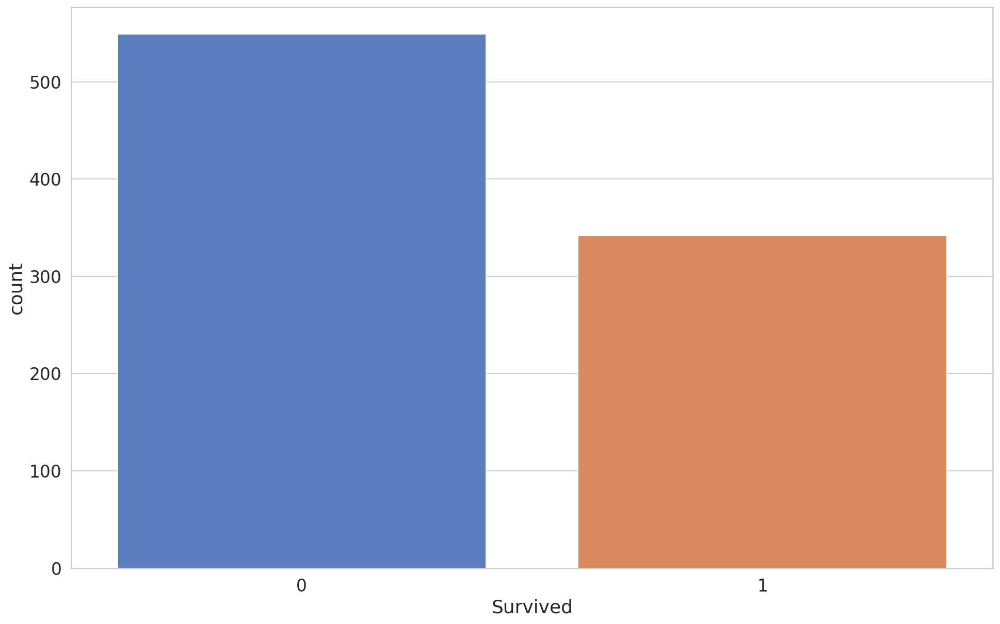

In [8]:
sns.countplot(df.Survived);

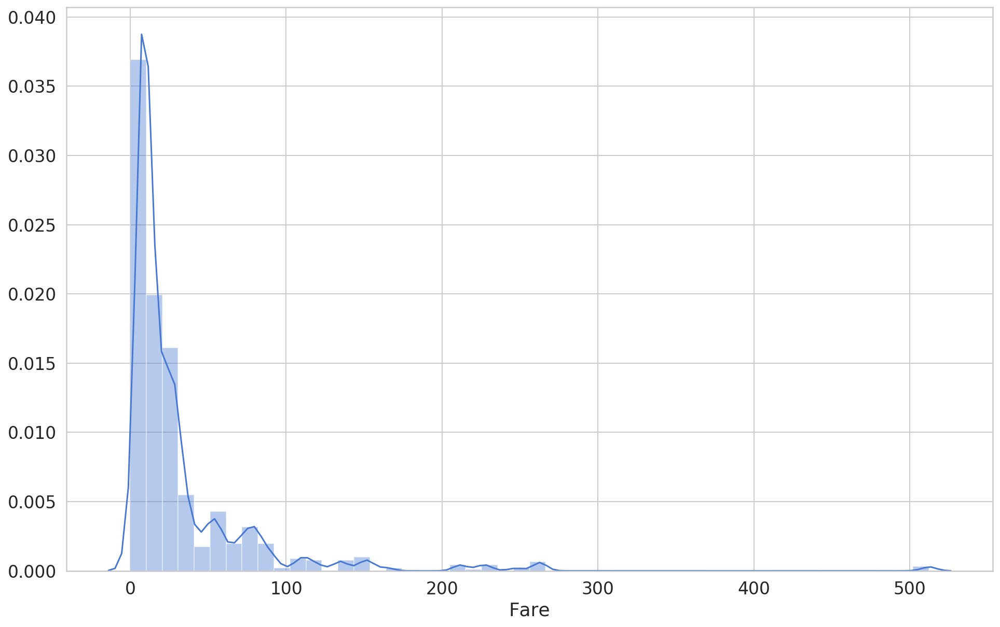

In [9]:
sns.distplot(df.Fare);

In [10]:
missing = df.isnull().sum()
missing[missing > 0].sort_values(ascending=False)

Cabin       687
Age         177
Embarked      2
dtype: int64

In [0]:
df = df.drop(['Cabin', 'Name', 'Ticket', 'PassengerId'], axis=1)

In [12]:
df.shape

(891, 8)

In [0]:
df['Age'] = df['Age'].fillna(df['Age'].mean())

In [0]:
df['Embarked'] = df['Embarked'].fillna(df['Embarked'].mode()[0])

In [15]:
df.columns

Index(['Survived', 'Pclass', 'Sex', 'Age', 'SibSp', 'Parch', 'Fare',
       'Embarked'],
      dtype='object')

In [0]:
df = pd.get_dummies(df, columns=['Sex', 'Embarked', 'Pclass'])

In [0]:
X = df.drop('Survived', axis=1)
y = df.Survived

In [0]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [0]:
def tune_optimizer_model(hp):
    model = keras.Sequential()
    model.add(keras.layers.Dense(units=18, activation="relu", input_shape=[X_train.shape[1]]))

    model.add(keras.layers.Dense(1, activation='sigmoid'))

    optimizer = hp.Choice('optimizer', ['adam', 'sgd', 'rmsprop'])

    model.compile(
        optimizer=optimizer,
        loss = 'binary_crossentropy', 
        metrics = ['accuracy'])
    return model

In [22]:
MAX_TRIALS = 20
EXECUTIONS_PER_TRIAL = 5

tuner = RandomSearch(
    tune_optimizer_model,
    objective='val_accuracy',
    max_trials=MAX_TRIALS,
    executions_per_trial=EXECUTIONS_PER_TRIAL,
    directory='test_dir', 
    project_name='tune_optimizer'
)

tuner.search_space_summary()

INFO:tensorflow:Reloading Oracle from existing project test_dir/tune_optimizer/oracle.json


In [23]:
TRAIN_EPOCHS = 20

tuner.search(x=X_train,
             y=y_train,
             epochs=TRAIN_EPOCHS,
             validation_data=(X_test, y_test))

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 745us/sample - loss: 1.0775 - accuracy: 0.6826 - val_loss: 0.8114 - val_accuracy: 0.6425
Epoch 2/20
712/712 [==============================] - 0s 115us/sample - loss: 0.7296 - accuracy: 0.6657 - val_loss: 0.6619 - val_accuracy: 0.6536
Epoch 3/20
712/712 [==============================] - 0s 104us/sample - loss: 0.6672 - accuracy: 0.6475 - val_loss: 0.6240 - val_accuracy: 0.6760
Epoch 4/20
712/712 [==============================] - 0s 97us/sample - loss: 0.6352 - accuracy: 0.6713 - val_loss: 0.6206 - val_accuracy: 0.6816
Epoch 5/20
712/712 [==============================] - 0s 86us/sample - loss: 0.6183 - accuracy: 0.6756 - val_loss: 0.6392 - val_accuracy: 0.6592
Epoch 6/20
712/712 [==============================] - 0s 81us/sample - loss: 0.5934 - accuracy: 0.6868 - val_loss: 0.7117 - val_accuracy: 0.6313
Epoch 7/20
712/712 [==============================] - 0s 88us/sample - loss: 0.58

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 625us/sample - loss: 5.9716 - accuracy: 0.3890 - val_loss: 4.4937 - val_accuracy: 0.3631
Epoch 2/20
712/712 [==============================] - 0s 84us/sample - loss: 3.0393 - accuracy: 0.3806 - val_loss: 2.2436 - val_accuracy: 0.3352
Epoch 3/20
712/712 [==============================] - 0s 80us/sample - loss: 1.6737 - accuracy: 0.3230 - val_loss: 1.3716 - val_accuracy: 0.3575
Epoch 4/20
712/712 [==============================] - 0s 96us/sample - loss: 0.9123 - accuracy: 0.4410 - val_loss: 0.6185 - val_accuracy: 0.6592
Epoch 5/20
712/712 [==============================] - 0s 104us/sample - loss: 0.6033 - accuracy: 0.6910 - val_loss: 0.5345 - val_accuracy: 0.7318
Epoch 6/20
712/712 [==============================] - 0s 90us/sample - loss: 0.5719 - accuracy: 0.7191 - val_loss: 0.5233 - val_accuracy: 0.7598
Epoch 7/20
712/712 [==============================] - 0s 94us/sample - loss: 0.562

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 533us/sample - loss: 1.6582 - accuracy: 0.5604 - val_loss: 1.1435 - val_accuracy: 0.6816
Epoch 2/20
712/712 [==============================] - 0s 75us/sample - loss: 1.1422 - accuracy: 0.6138 - val_loss: 4.9914 - val_accuracy: 0.3631
Epoch 3/20
712/712 [==============================] - 0s 72us/sample - loss: 1.0692 - accuracy: 0.6657 - val_loss: 1.3433 - val_accuracy: 0.2961
Epoch 4/20
712/712 [==============================] - 0s 73us/sample - loss: 0.7054 - accuracy: 0.6573 - val_loss: 0.9200 - val_accuracy: 0.5363
Epoch 5/20
712/712 [==============================] - 0s 74us/sample - loss: 0.6559 - accuracy: 0.6629 - val_loss: 0.5850 - val_accuracy: 0.6648
Epoch 6/20
712/712 [==============================] - 0s 80us/sample - loss: 0.7151 - accuracy: 0.6728 - val_loss: 0.6579 - val_accuracy: 0.6760
Epoch 7/20
712/712 [==============================] - 0s 83us/sample - loss: 0.6366

INFO:tensorflow:Oracle triggered exit


In [24]:
tuner.results_summary()

In [25]:
tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values

{'optimizer': 'adam'}

In [0]:
best_model = tuner.get_best_models()[0]

In [27]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 18)                234       
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 19        
Total params: 253
Trainable params: 253
Non-trainable params: 0
_________________________________________________________________


In [0]:
def tune_rl_momentum_model(hp):
    model = keras.Sequential()
    model.add(keras.layers.Dense(units=18, activation="relu", input_shape=[X_train.shape[1]]))

    model.add(keras.layers.Dense(1, activation='sigmoid'))

    lr = hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])
    momentum = hp.Choice('momentum', [0.0, 0.2, 0.4, 0.6, 0.8, 0.9])

    model.compile(
        optimizer=keras.optimizers.SGD(lr, momentum=momentum),
        loss = 'binary_crossentropy', 
        metrics = ['accuracy'])
    return model

In [0]:
def create_random_tuner(model_builder, project_name):
  tuner = RandomSearch(
    model_builder,
    objective='val_accuracy',
    max_trials=MAX_TRIALS,
    executions_per_trial=EXECUTIONS_PER_TRIAL,
    directory='test_dir', 
    project_name=project_name
  )

  tuner.search_space_summary()
  return tuner

In [0]:
def random_search_params(model_builder, project_name):
  tuner = create_random_tuner(model_builder, project_name)
  tuner.search(x=X_train,
             y=y_train,
             epochs=TRAIN_EPOCHS,
             validation_data=(X_test, y_test))
  
  tuner.results_summary()

  pprint(tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values)

In [31]:
random_search_params(tune_rl_momentum_model, project_name="tune_lr_momentum")

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 528us/sample - loss: 3.2774 - accuracy: 0.4902 - val_loss: 1.5412 - val_accuracy: 0.3352
Epoch 2/20
712/712 [==============================] - 0s 85us/sample - loss: 0.9367 - accuracy: 0.5632 - val_loss: 0.6623 - val_accuracy: 0.6480
Epoch 3/20
712/712 [==============================] - 0s 73us/sample - loss: 0.7035 - accuracy: 0.6896 - val_loss: 0.6280 - val_accuracy: 0.6425
Epoch 4/20
712/712 [==============================] - 0s 84us/sample - loss: 0.6343 - accuracy: 0.7008 - val_loss: 0.5942 - val_accuracy: 0.6704
Epoch 5/20
712/712 [==============================] - 0s 81us/sample - loss: 0.6209 - accuracy: 0.6994 - val_loss: 0.6277 - val_accuracy: 0.6536
Epoch 6/20
712/712 [==============================] - 0s 80us/sample - loss: 0.6392 - accuracy: 0.6882 - val_loss: 0.6571 - val_accuracy: 0.6648
Epoch 7/20
712/712 [==============================] - 0s 75us/sample - loss: 0.6176

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 554us/sample - loss: 2.3148 - accuracy: 0.6208 - val_loss: 0.7362 - val_accuracy: 0.6704
Epoch 2/20
712/712 [==============================] - 0s 82us/sample - loss: 0.6337 - accuracy: 0.6896 - val_loss: 1.2127 - val_accuracy: 0.6201
Epoch 3/20
712/712 [==============================] - 0s 85us/sample - loss: 1.2614 - accuracy: 0.6320 - val_loss: 0.5581 - val_accuracy: 0.7709
Epoch 4/20
712/712 [==============================] - 0s 81us/sample - loss: 0.6297 - accuracy: 0.6994 - val_loss: 0.6473 - val_accuracy: 0.6592
Epoch 5/20
712/712 [==============================] - 0s 79us/sample - loss: 0.6403 - accuracy: 0.7051 - val_loss: 0.5304 - val_accuracy: 0.7542
Epoch 6/20
712/712 [==============================] - 0s 82us/sample - loss: 0.6111 - accuracy: 0.6952 - val_loss: 0.5583 - val_accuracy: 0.7654
Epoch 7/20
712/712 [==============================] - 0s 77us/sample - loss: 0.5855

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 572us/sample - loss: 1.0584 - accuracy: 0.5632 - val_loss: 0.6954 - val_accuracy: 0.3631
Epoch 2/20
712/712 [==============================] - 0s 92us/sample - loss: 0.6803 - accuracy: 0.5660 - val_loss: 0.6408 - val_accuracy: 0.6369
Epoch 3/20
712/712 [==============================] - 0s 74us/sample - loss: 0.6321 - accuracy: 0.6110 - val_loss: 0.6122 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 88us/sample - loss: 0.6295 - accuracy: 0.6110 - val_loss: 0.6192 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 78us/sample - loss: 0.6231 - accuracy: 0.6110 - val_loss: 0.6139 - val_accuracy: 0.6369
Epoch 6/20
712/712 [==============================] - 0s 75us/sample - loss: 0.6262 - accuracy: 0.6110 - val_loss: 0.6189 - val_accuracy: 0.6369
Epoch 7/20
712/712 [==============================] - 0s 89us/sample - loss: 0.6224

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 582us/sample - loss: 3.0987 - accuracy: 0.5983 - val_loss: 0.8116 - val_accuracy: 0.6313
Epoch 2/20
712/712 [==============================] - 0s 88us/sample - loss: 0.6753 - accuracy: 0.6433 - val_loss: 0.6507 - val_accuracy: 0.6313
Epoch 3/20
712/712 [==============================] - 0s 88us/sample - loss: 0.6394 - accuracy: 0.6728 - val_loss: 0.7340 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 92us/sample - loss: 0.6560 - accuracy: 0.6840 - val_loss: 0.7139 - val_accuracy: 0.6592
Epoch 5/20
712/712 [==============================] - 0s 92us/sample - loss: 0.6678 - accuracy: 0.6587 - val_loss: 0.6301 - val_accuracy: 0.6704
Epoch 6/20
712/712 [==============================] - 0s 88us/sample - loss: 0.6536 - accuracy: 0.6756 - val_loss: 0.6498 - val_accuracy: 0.6536
Epoch 7/20
712/712 [==============================] - 0s 96us/sample - loss: 0.6185

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 605us/sample - loss: 1.1035 - accuracy: 0.6222 - val_loss: 1.0608 - val_accuracy: 0.6648
Epoch 2/20
712/712 [==============================] - 0s 86us/sample - loss: 0.9463 - accuracy: 0.6770 - val_loss: 0.9131 - val_accuracy: 0.6425
Epoch 3/20
712/712 [==============================] - 0s 78us/sample - loss: 0.8727 - accuracy: 0.6798 - val_loss: 0.8255 - val_accuracy: 0.6425
Epoch 4/20
712/712 [==============================] - 0s 81us/sample - loss: 0.8201 - accuracy: 0.6770 - val_loss: 0.7774 - val_accuracy: 0.6536
Epoch 5/20
712/712 [==============================] - 0s 75us/sample - loss: 0.7791 - accuracy: 0.6812 - val_loss: 0.7374 - val_accuracy: 0.6648
Epoch 6/20
712/712 [==============================] - 0s 103us/sample - loss: 0.7486 - accuracy: 0.6798 - val_loss: 0.7082 - val_accuracy: 0.6816
Epoch 7/20
712/712 [==============================] - 0s 96us/sample - loss: 0.725

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 563us/sample - loss: 4.2842 - accuracy: 0.3890 - val_loss: 3.2088 - val_accuracy: 0.3631
Epoch 2/20
712/712 [==============================] - 0s 74us/sample - loss: 2.1352 - accuracy: 0.3876 - val_loss: 1.3526 - val_accuracy: 0.3352
Epoch 3/20
712/712 [==============================] - 0s 96us/sample - loss: 1.0212 - accuracy: 0.3961 - val_loss: 0.8560 - val_accuracy: 0.5028
Epoch 4/20
712/712 [==============================] - 0s 90us/sample - loss: 0.7577 - accuracy: 0.6461 - val_loss: 0.7015 - val_accuracy: 0.6592
Epoch 5/20
712/712 [==============================] - 0s 85us/sample - loss: 0.6796 - accuracy: 0.6798 - val_loss: 0.6482 - val_accuracy: 0.6760
Epoch 6/20
712/712 [==============================] - 0s 125us/sample - loss: 0.6422 - accuracy: 0.6966 - val_loss: 0.6350 - val_accuracy: 0.6816
Epoch 7/20
712/712 [==============================] - 0s 77us/sample - loss: 0.635

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 609us/sample - loss: 0.6950 - accuracy: 0.6376 - val_loss: 0.6911 - val_accuracy: 0.6145
Epoch 2/20
712/712 [==============================] - 0s 91us/sample - loss: 0.6925 - accuracy: 0.6236 - val_loss: 0.6698 - val_accuracy: 0.6425
Epoch 3/20
712/712 [==============================] - 0s 79us/sample - loss: 0.6708 - accuracy: 0.6531 - val_loss: 0.7372 - val_accuracy: 0.5922
Epoch 4/20
712/712 [==============================] - 0s 95us/sample - loss: 0.7224 - accuracy: 0.6419 - val_loss: 0.6869 - val_accuracy: 0.6760
Epoch 5/20
712/712 [==============================] - 0s 82us/sample - loss: 0.7028 - accuracy: 0.6320 - val_loss: 0.6810 - val_accuracy: 0.6425
Epoch 6/20
712/712 [==============================] - 0s 74us/sample - loss: 0.6852 - accuracy: 0.6657 - val_loss: 0.6541 - val_accuracy: 0.6536
Epoch 7/20
712/712 [==============================] - 0s 81us/sample - loss: 0.6564

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 563us/sample - loss: 1.2845 - accuracy: 0.6573 - val_loss: 5.4687 - val_accuracy: 0.3687
Epoch 2/20
712/712 [==============================] - 0s 85us/sample - loss: 1.3198 - accuracy: 0.6756 - val_loss: 0.5665 - val_accuracy: 0.6983
Epoch 3/20
712/712 [==============================] - 0s 77us/sample - loss: 0.6158 - accuracy: 0.6812 - val_loss: 0.6309 - val_accuracy: 0.6704
Epoch 4/20
712/712 [==============================] - 0s 82us/sample - loss: 0.6047 - accuracy: 0.6798 - val_loss: 0.6037 - val_accuracy: 0.6816
Epoch 5/20
712/712 [==============================] - 0s 85us/sample - loss: 0.5944 - accuracy: 0.6798 - val_loss: 0.5876 - val_accuracy: 0.6927
Epoch 6/20
712/712 [==============================] - 0s 95us/sample - loss: 0.6060 - accuracy: 0.6826 - val_loss: 0.5587 - val_accuracy: 0.7207
Epoch 7/20
712/712 [==============================] - 0s 81us/sample - loss: 0.5874

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 604us/sample - loss: 0.8725 - accuracy: 0.6812 - val_loss: 0.7208 - val_accuracy: 0.6592
Epoch 2/20
712/712 [==============================] - 0s 101us/sample - loss: 0.7078 - accuracy: 0.6629 - val_loss: 0.9911 - val_accuracy: 0.5922
Epoch 3/20
712/712 [==============================] - 0s 88us/sample - loss: 0.6983 - accuracy: 0.6573 - val_loss: 0.7120 - val_accuracy: 0.6480
Epoch 4/20
712/712 [==============================] - 0s 100us/sample - loss: 0.6766 - accuracy: 0.6601 - val_loss: 0.6277 - val_accuracy: 0.6816
Epoch 5/20
712/712 [==============================] - 0s 86us/sample - loss: 0.6592 - accuracy: 0.6419 - val_loss: 1.0398 - val_accuracy: 0.6480
Epoch 6/20
712/712 [==============================] - 0s 89us/sample - loss: 0.6616 - accuracy: 0.6545 - val_loss: 0.6105 - val_accuracy: 0.6872
Epoch 7/20
712/712 [==============================] - 0s 86us/sample - loss: 0.64

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 610us/sample - loss: 19.0777 - accuracy: 0.3890 - val_loss: 19.2098 - val_accuracy: 0.3631
Epoch 2/20
712/712 [==============================] - 0s 84us/sample - loss: 16.8874 - accuracy: 0.3890 - val_loss: 17.0011 - val_accuracy: 0.3631
Epoch 3/20
712/712 [==============================] - 0s 88us/sample - loss: 14.8952 - accuracy: 0.3890 - val_loss: 14.9081 - val_accuracy: 0.3631
Epoch 4/20
712/712 [==============================] - 0s 76us/sample - loss: 13.0003 - accuracy: 0.3890 - val_loss: 13.0291 - val_accuracy: 0.3631
Epoch 5/20
712/712 [==============================] - 0s 89us/sample - loss: 11.2887 - accuracy: 0.3890 - val_loss: 11.2454 - val_accuracy: 0.3631
Epoch 6/20
712/712 [==============================] - 0s 85us/sample - loss: 9.6619 - accuracy: 0.3890 - val_loss: 9.5751 - val_accuracy: 0.3631
Epoch 7/20
712/712 [==============================] - 0s 80us/sample - lo

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 626us/sample - loss: 1.6033 - accuracy: 0.6138 - val_loss: 1.6552 - val_accuracy: 0.6034
Epoch 2/20
712/712 [==============================] - 0s 81us/sample - loss: 0.8955 - accuracy: 0.6461 - val_loss: 0.9117 - val_accuracy: 0.6034
Epoch 3/20
712/712 [==============================] - 0s 91us/sample - loss: 0.7994 - accuracy: 0.6601 - val_loss: 0.8686 - val_accuracy: 0.6927
Epoch 4/20
712/712 [==============================] - 0s 80us/sample - loss: 0.8855 - accuracy: 0.6433 - val_loss: 0.8205 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 86us/sample - loss: 0.6729 - accuracy: 0.6657 - val_loss: 1.7913 - val_accuracy: 0.6369
Epoch 6/20
712/712 [==============================] - 0s 79us/sample - loss: 0.6971 - accuracy: 0.6699 - val_loss: 1.2333 - val_accuracy: 0.3855
Epoch 7/20
712/712 [==============================] - 0s 83us/sample - loss: 0.7277

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 600us/sample - loss: 2.0849 - accuracy: 0.5899 - val_loss: 1.9381 - val_accuracy: 0.6536
Epoch 2/20
712/712 [==============================] - 0s 78us/sample - loss: 0.9391 - accuracy: 0.6376 - val_loss: 1.9859 - val_accuracy: 0.3631
Epoch 3/20
712/712 [==============================] - 0s 84us/sample - loss: 0.8315 - accuracy: 0.6376 - val_loss: 1.0217 - val_accuracy: 0.3631
Epoch 4/20
712/712 [==============================] - 0s 83us/sample - loss: 0.6588 - accuracy: 0.6924 - val_loss: 1.0804 - val_accuracy: 0.3687
Epoch 5/20
712/712 [==============================] - 0s 95us/sample - loss: 0.6896 - accuracy: 0.6531 - val_loss: 1.1004 - val_accuracy: 0.6369
Epoch 6/20
712/712 [==============================] - 0s 92us/sample - loss: 0.6613 - accuracy: 0.6812 - val_loss: 0.6663 - val_accuracy: 0.6816
Epoch 7/20
712/712 [==============================] - 0s 75us/sample - loss: 0.5730

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 617us/sample - loss: 1.0993 - accuracy: 0.6236 - val_loss: 0.8886 - val_accuracy: 0.6704
Epoch 2/20
712/712 [==============================] - 0s 85us/sample - loss: 0.8160 - accuracy: 0.6447 - val_loss: 0.7475 - val_accuracy: 0.6704
Epoch 3/20
712/712 [==============================] - 0s 83us/sample - loss: 0.7224 - accuracy: 0.6573 - val_loss: 0.7038 - val_accuracy: 0.6648
Epoch 4/20
712/712 [==============================] - 0s 89us/sample - loss: 0.6924 - accuracy: 0.6643 - val_loss: 0.6892 - val_accuracy: 0.6704
Epoch 5/20
712/712 [==============================] - 0s 96us/sample - loss: 0.6814 - accuracy: 0.6713 - val_loss: 0.6810 - val_accuracy: 0.6816
Epoch 6/20
712/712 [==============================] - 0s 95us/sample - loss: 0.6751 - accuracy: 0.6798 - val_loss: 0.6752 - val_accuracy: 0.6872
Epoch 7/20
712/712 [==============================] - 0s 88us/sample - loss: 0.6708

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 548us/sample - loss: 11.2960 - accuracy: 0.3890 - val_loss: 10.3253 - val_accuracy: 0.3631
Epoch 2/20
712/712 [==============================] - 0s 72us/sample - loss: 8.0698 - accuracy: 0.3890 - val_loss: 7.2313 - val_accuracy: 0.3631
Epoch 3/20
712/712 [==============================] - 0s 78us/sample - loss: 5.3798 - accuracy: 0.3890 - val_loss: 4.6075 - val_accuracy: 0.3631
Epoch 4/20
712/712 [==============================] - 0s 84us/sample - loss: 3.1884 - accuracy: 0.3890 - val_loss: 2.5363 - val_accuracy: 0.3631
Epoch 5/20
712/712 [==============================] - 0s 87us/sample - loss: 1.7008 - accuracy: 0.3890 - val_loss: 1.5620 - val_accuracy: 0.4413
Epoch 6/20
712/712 [==============================] - 0s 90us/sample - loss: 1.2749 - accuracy: 0.5393 - val_loss: 1.3606 - val_accuracy: 0.5978
Epoch 7/20
712/712 [==============================] - 0s 89us/sample - loss: 1.17

INFO:tensorflow:Oracle triggered exit


{'learning_rate': 0.01, 'momentum': 0.0}


In [0]:
def tune_neurons_model(hp):
    model = keras.Sequential()
    model.add(keras.layers.Dense(units=hp.Int('units',
                                        min_value=8,
                                        max_value=128,
                                        step=16),
                                 activation="relu", 
                                 input_shape=[X_train.shape[1]]))

    model.add(keras.layers.Dense(1, activation='sigmoid'))

    model.compile(
        optimizer="adam",
        loss = 'binary_crossentropy', 
        metrics = ['accuracy'])
    return model

In [33]:
random_search_params(tune_neurons_model, project_name="tune_neurons")

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 614us/sample - loss: 2.7068 - accuracy: 0.3357 - val_loss: 2.4053 - val_accuracy: 0.3352
Epoch 2/20
712/712 [==============================] - 0s 89us/sample - loss: 1.7483 - accuracy: 0.3525 - val_loss: 1.4918 - val_accuracy: 0.3855
Epoch 3/20
712/712 [==============================] - 0s 81us/sample - loss: 1.0996 - accuracy: 0.5014 - val_loss: 0.9600 - val_accuracy: 0.6089
Epoch 4/20
712/712 [==============================] - 0s 97us/sample - loss: 0.8049 - accuracy: 0.6278 - val_loss: 0.7214 - val_accuracy: 0.6536
Epoch 5/20
712/712 [==============================] - 0s 101us/sample - loss: 0.6914 - accuracy: 0.6713 - val_loss: 0.6352 - val_accuracy: 0.6816
Epoch 6/20
712/712 [==============================] - 0s 81us/sample - loss: 0.6513 - accuracy: 0.6910 - val_loss: 0.6070 - val_accuracy: 0.6760
Epoch 7/20
712/712 [==============================] - 0s 89us/sample - loss: 0.637

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 730us/sample - loss: 0.7251 - accuracy: 0.6587 - val_loss: 0.6288 - val_accuracy: 0.6704
Epoch 2/20
712/712 [==============================] - 0s 146us/sample - loss: 0.5945 - accuracy: 0.6952 - val_loss: 0.5225 - val_accuracy: 0.7318
Epoch 3/20
712/712 [==============================] - 0s 103us/sample - loss: 0.5522 - accuracy: 0.7416 - val_loss: 0.5113 - val_accuracy: 0.7318
Epoch 4/20
712/712 [==============================] - 0s 99us/sample - loss: 0.5594 - accuracy: 0.7247 - val_loss: 0.5715 - val_accuracy: 0.6760
Epoch 5/20
712/712 [==============================] - 0s 112us/sample - loss: 0.5400 - accuracy: 0.7472 - val_loss: 0.4645 - val_accuracy: 0.8045
Epoch 6/20
712/712 [==============================] - 0s 138us/sample - loss: 0.5003 - accuracy: 0.7556 - val_loss: 0.4720 - val_accuracy: 0.7877
Epoch 7/20
712/712 [==============================] - 0s 104us/sample - loss: 0

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 662us/sample - loss: 1.2211 - accuracy: 0.5478 - val_loss: 0.8256 - val_accuracy: 0.5642
Epoch 2/20
712/712 [==============================] - 0s 101us/sample - loss: 0.7156 - accuracy: 0.6587 - val_loss: 0.6662 - val_accuracy: 0.6872
Epoch 3/20
712/712 [==============================] - 0s 89us/sample - loss: 0.6294 - accuracy: 0.6728 - val_loss: 0.6076 - val_accuracy: 0.6704
Epoch 4/20
712/712 [==============================] - 0s 110us/sample - loss: 0.5912 - accuracy: 0.6798 - val_loss: 0.5676 - val_accuracy: 0.6983
Epoch 5/20
712/712 [==============================] - 0s 96us/sample - loss: 0.5653 - accuracy: 0.7107 - val_loss: 0.5463 - val_accuracy: 0.7374
Epoch 6/20
712/712 [==============================] - 0s 100us/sample - loss: 0.5512 - accuracy: 0.7275 - val_loss: 0.5286 - val_accuracy: 0.7486
Epoch 7/20
712/712 [==============================] - 0s 82us/sample - loss: 0.5

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 676us/sample - loss: 4.3871 - accuracy: 0.6110 - val_loss: 1.9614 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 107us/sample - loss: 1.0067 - accuracy: 0.6264 - val_loss: 0.7918 - val_accuracy: 0.6536
Epoch 3/20
712/712 [==============================] - 0s 103us/sample - loss: 0.6639 - accuracy: 0.6713 - val_loss: 0.6179 - val_accuracy: 0.6816
Epoch 4/20
712/712 [==============================] - 0s 107us/sample - loss: 0.6073 - accuracy: 0.6938 - val_loss: 0.5764 - val_accuracy: 0.6480
Epoch 5/20
712/712 [==============================] - 0s 103us/sample - loss: 0.5837 - accuracy: 0.7008 - val_loss: 0.5460 - val_accuracy: 0.7095
Epoch 6/20
712/712 [==============================] - 0s 112us/sample - loss: 0.5645 - accuracy: 0.7177 - val_loss: 0.5243 - val_accuracy: 0.7318
Epoch 7/20
712/712 [==============================] - 0s 92us/sample - loss: 0

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 693us/sample - loss: 2.6785 - accuracy: 0.6152 - val_loss: 0.8157 - val_accuracy: 0.5978
Epoch 2/20
712/712 [==============================] - 0s 106us/sample - loss: 0.7472 - accuracy: 0.5604 - val_loss: 0.6374 - val_accuracy: 0.6704
Epoch 3/20
712/712 [==============================] - 0s 102us/sample - loss: 0.6329 - accuracy: 0.6713 - val_loss: 0.5968 - val_accuracy: 0.7207
Epoch 4/20
712/712 [==============================] - 0s 111us/sample - loss: 0.5911 - accuracy: 0.7149 - val_loss: 0.5354 - val_accuracy: 0.7430
Epoch 5/20
712/712 [==============================] - 0s 111us/sample - loss: 0.5614 - accuracy: 0.7388 - val_loss: 0.5071 - val_accuracy: 0.7598
Epoch 6/20
712/712 [==============================] - 0s 100us/sample - loss: 0.5366 - accuracy: 0.7289 - val_loss: 0.4985 - val_accuracy: 0.7430
Epoch 7/20
712/712 [==============================] - 0s 103us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 701us/sample - loss: 0.7874 - accuracy: 0.5702 - val_loss: 0.6161 - val_accuracy: 0.6704
Epoch 2/20
712/712 [==============================] - 0s 128us/sample - loss: 0.5981 - accuracy: 0.6615 - val_loss: 0.5457 - val_accuracy: 0.7598
Epoch 3/20
712/712 [==============================] - 0s 94us/sample - loss: 0.5599 - accuracy: 0.7163 - val_loss: 0.5275 - val_accuracy: 0.7374
Epoch 4/20
712/712 [==============================] - 0s 133us/sample - loss: 0.5300 - accuracy: 0.7346 - val_loss: 0.4960 - val_accuracy: 0.7430
Epoch 5/20
712/712 [==============================] - 0s 110us/sample - loss: 0.5137 - accuracy: 0.7528 - val_loss: 0.5695 - val_accuracy: 0.7877
Epoch 6/20
712/712 [==============================] - 0s 116us/sample - loss: 0.5168 - accuracy: 0.7598 - val_loss: 0.4462 - val_accuracy: 0.8547
Epoch 7/20
712/712 [==============================] - 0s 102us/sample - loss: 0

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 691us/sample - loss: 0.9549 - accuracy: 0.6882 - val_loss: 0.6736 - val_accuracy: 0.6983
Epoch 2/20
712/712 [==============================] - 0s 88us/sample - loss: 0.6228 - accuracy: 0.6826 - val_loss: 0.5589 - val_accuracy: 0.6983
Epoch 3/20
712/712 [==============================] - 0s 144us/sample - loss: 0.5706 - accuracy: 0.7191 - val_loss: 0.5471 - val_accuracy: 0.7207
Epoch 4/20
712/712 [==============================] - 0s 112us/sample - loss: 0.5604 - accuracy: 0.7317 - val_loss: 0.4912 - val_accuracy: 0.7430
Epoch 5/20
712/712 [==============================] - 0s 109us/sample - loss: 0.5245 - accuracy: 0.7612 - val_loss: 0.4770 - val_accuracy: 0.7709
Epoch 6/20
712/712 [==============================] - 0s 108us/sample - loss: 0.5195 - accuracy: 0.7669 - val_loss: 0.4578 - val_accuracy: 0.7765
Epoch 7/20
712/712 [==============================] - 0s 106us/sample - loss: 0

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 647us/sample - loss: 1.4657 - accuracy: 0.4522 - val_loss: 0.7328 - val_accuracy: 0.6313
Epoch 2/20
712/712 [==============================] - 0s 99us/sample - loss: 0.7234 - accuracy: 0.6685 - val_loss: 0.6594 - val_accuracy: 0.6648
Epoch 3/20
712/712 [==============================] - 0s 85us/sample - loss: 0.6427 - accuracy: 0.6924 - val_loss: 0.5876 - val_accuracy: 0.6648
Epoch 4/20
712/712 [==============================] - 0s 100us/sample - loss: 0.6004 - accuracy: 0.6980 - val_loss: 0.5685 - val_accuracy: 0.7039
Epoch 5/20
712/712 [==============================] - 0s 99us/sample - loss: 0.5703 - accuracy: 0.7093 - val_loss: 0.5265 - val_accuracy: 0.7207
Epoch 6/20
712/712 [==============================] - 0s 96us/sample - loss: 0.5510 - accuracy: 0.7275 - val_loss: 0.5090 - val_accuracy: 0.7598
Epoch 7/20
712/712 [==============================] - 0s 93us/sample - loss: 0.537

INFO:tensorflow:Oracle triggered exit


{'units': 88}


In [0]:
def tune_layers_model(hp):
    model = keras.Sequential()

    model.add(keras.layers.Dense(units=128,
                                 activation="relu", 
                                 input_shape=[X_train.shape[1]]))

    for i in range(hp.Int('num_layers', 1, 6)):
      model.add(keras.layers.Dense(units=hp.Int('units_' + str(i),
                                            min_value=8,
                                            max_value=64,
                                            step=8),
                               activation='relu'))

    model.add(keras.layers.Dense(1, activation='sigmoid'))

    model.compile(
        optimizer="adam",
        loss = 'binary_crossentropy', 
        metrics = ['accuracy'])
    return model

In [35]:
random_search_params(tune_layers_model, project_name="tune_layers")

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 861us/sample - loss: 0.6278 - accuracy: 0.6840 - val_loss: 0.5928 - val_accuracy: 0.6704
Epoch 2/20
712/712 [==============================] - 0s 127us/sample - loss: 0.6041 - accuracy: 0.6952 - val_loss: 0.5853 - val_accuracy: 0.6648
Epoch 3/20
712/712 [==============================] - 0s 109us/sample - loss: 0.5945 - accuracy: 0.6896 - val_loss: 0.5812 - val_accuracy: 0.7318
Epoch 4/20
712/712 [==============================] - 0s 140us/sample - loss: 0.5971 - accuracy: 0.7079 - val_loss: 0.5604 - val_accuracy: 0.7207
Epoch 5/20
712/712 [==============================] - 0s 126us/sample - loss: 0.5795 - accuracy: 0.7205 - val_loss: 0.5449 - val_accuracy: 0.7207
Epoch 6/20
712/712 [==============================] - 0s 113us/sample - loss: 0.5660 - accuracy: 0.7233 - val_loss: 0.5297 - val_accuracy: 0.7151
Epoch 7/20
712/712 [==============================] - 0s 130us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 863us/sample - loss: 0.6452 - accuracy: 0.6770 - val_loss: 0.5957 - val_accuracy: 0.6816
Epoch 2/20
712/712 [==============================] - 0s 153us/sample - loss: 0.6027 - accuracy: 0.6952 - val_loss: 0.5898 - val_accuracy: 0.6927
Epoch 3/20
712/712 [==============================] - 0s 157us/sample - loss: 0.5918 - accuracy: 0.7107 - val_loss: 0.5560 - val_accuracy: 0.7486
Epoch 4/20
712/712 [==============================] - 0s 121us/sample - loss: 0.5779 - accuracy: 0.7135 - val_loss: 0.5701 - val_accuracy: 0.6480
Epoch 5/20
712/712 [==============================] - 0s 129us/sample - loss: 0.5550 - accuracy: 0.7261 - val_loss: 0.5137 - val_accuracy: 0.7374
Epoch 6/20
712/712 [==============================] - 0s 141us/sample - loss: 0.5543 - accuracy: 0.7430 - val_loss: 0.4754 - val_accuracy: 0.7598
Epoch 7/20
712/712 [==============================] - 0s 117us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 776us/sample - loss: 0.8685 - accuracy: 0.6306 - val_loss: 0.8695 - val_accuracy: 0.5978
Epoch 2/20
712/712 [==============================] - 0s 140us/sample - loss: 0.7282 - accuracy: 0.6559 - val_loss: 0.7926 - val_accuracy: 0.6369
Epoch 3/20
712/712 [==============================] - 0s 137us/sample - loss: 0.6519 - accuracy: 0.6587 - val_loss: 0.6173 - val_accuracy: 0.6872
Epoch 4/20
712/712 [==============================] - 0s 139us/sample - loss: 0.6029 - accuracy: 0.7163 - val_loss: 0.6006 - val_accuracy: 0.7151
Epoch 5/20
712/712 [==============================] - 0s 139us/sample - loss: 0.5777 - accuracy: 0.7079 - val_loss: 0.5066 - val_accuracy: 0.7598
Epoch 6/20
712/712 [==============================] - 0s 100us/sample - loss: 0.5402 - accuracy: 0.7542 - val_loss: 0.5526 - val_accuracy: 0.7542
Epoch 7/20
712/712 [==============================] - 0s 125us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 964us/sample - loss: 0.7142 - accuracy: 0.5478 - val_loss: 0.6757 - val_accuracy: 0.6816
Epoch 2/20
712/712 [==============================] - 0s 108us/sample - loss: 0.6801 - accuracy: 0.6840 - val_loss: 0.6708 - val_accuracy: 0.6760
Epoch 3/20
712/712 [==============================] - 0s 114us/sample - loss: 0.6775 - accuracy: 0.6559 - val_loss: 0.6639 - val_accuracy: 0.6983
Epoch 4/20
712/712 [==============================] - 0s 131us/sample - loss: 0.6666 - accuracy: 0.6699 - val_loss: 0.6528 - val_accuracy: 0.6983
Epoch 5/20
712/712 [==============================] - 0s 143us/sample - loss: 0.6590 - accuracy: 0.6742 - val_loss: 0.6432 - val_accuracy: 0.7039
Epoch 6/20
712/712 [==============================] - 0s 125us/sample - loss: 0.6511 - accuracy: 0.6826 - val_loss: 0.6335 - val_accuracy: 0.7039
Epoch 7/20
712/712 [==============================] - 0s 98us/sample - loss: 0

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 923us/sample - loss: 0.6390 - accuracy: 0.6489 - val_loss: 0.5966 - val_accuracy: 0.6648
Epoch 2/20
712/712 [==============================] - 0s 136us/sample - loss: 0.6129 - accuracy: 0.6882 - val_loss: 0.5851 - val_accuracy: 0.6648
Epoch 3/20
712/712 [==============================] - 0s 134us/sample - loss: 0.5999 - accuracy: 0.6840 - val_loss: 0.5718 - val_accuracy: 0.7039
Epoch 4/20
712/712 [==============================] - 0s 143us/sample - loss: 0.5790 - accuracy: 0.7008 - val_loss: 0.5565 - val_accuracy: 0.7486
Epoch 5/20
712/712 [==============================] - 0s 144us/sample - loss: 0.5611 - accuracy: 0.7317 - val_loss: 0.5187 - val_accuracy: 0.7486
Epoch 6/20
712/712 [==============================] - 0s 147us/sample - loss: 0.5342 - accuracy: 0.7374 - val_loss: 0.4505 - val_accuracy: 0.7877
Epoch 7/20
712/712 [==============================] - 0s 134us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 863us/sample - loss: 0.6668 - accuracy: 0.6643 - val_loss: 0.6025 - val_accuracy: 0.6704
Epoch 2/20
712/712 [==============================] - 0s 122us/sample - loss: 0.6109 - accuracy: 0.6728 - val_loss: 0.5994 - val_accuracy: 0.6592
Epoch 3/20
712/712 [==============================] - 0s 146us/sample - loss: 0.6011 - accuracy: 0.6770 - val_loss: 0.5836 - val_accuracy: 0.6816
Epoch 4/20
712/712 [==============================] - 0s 127us/sample - loss: 0.6037 - accuracy: 0.6924 - val_loss: 0.5671 - val_accuracy: 0.6816
Epoch 5/20
712/712 [==============================] - 0s 117us/sample - loss: 0.5799 - accuracy: 0.7065 - val_loss: 0.5763 - val_accuracy: 0.6536
Epoch 6/20
712/712 [==============================] - 0s 137us/sample - loss: 0.5745 - accuracy: 0.7008 - val_loss: 0.5276 - val_accuracy: 0.6983
Epoch 7/20
712/712 [==============================] - 0s 138us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 984us/sample - loss: 0.6286 - accuracy: 0.6756 - val_loss: 0.6084 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 153us/sample - loss: 0.6219 - accuracy: 0.6713 - val_loss: 0.5853 - val_accuracy: 0.6872
Epoch 3/20
712/712 [==============================] - 0s 137us/sample - loss: 0.6010 - accuracy: 0.6952 - val_loss: 0.5704 - val_accuracy: 0.6816
Epoch 4/20
712/712 [==============================] - 0s 140us/sample - loss: 0.5858 - accuracy: 0.6966 - val_loss: 0.5508 - val_accuracy: 0.6983
Epoch 5/20
712/712 [==============================] - 0s 130us/sample - loss: 0.5725 - accuracy: 0.7065 - val_loss: 0.5337 - val_accuracy: 0.6983
Epoch 6/20
712/712 [==============================] - 0s 143us/sample - loss: 0.5589 - accuracy: 0.7093 - val_loss: 0.5042 - val_accuracy: 0.7151
Epoch 7/20
712/712 [==============================] - 0s 125us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 852us/sample - loss: 0.6502 - accuracy: 0.6657 - val_loss: 0.5906 - val_accuracy: 0.6704
Epoch 2/20
712/712 [==============================] - 0s 147us/sample - loss: 0.6238 - accuracy: 0.6840 - val_loss: 0.5765 - val_accuracy: 0.6760
Epoch 3/20
712/712 [==============================] - 0s 134us/sample - loss: 0.6015 - accuracy: 0.6882 - val_loss: 0.6239 - val_accuracy: 0.7039
Epoch 4/20
712/712 [==============================] - 0s 114us/sample - loss: 0.6242 - accuracy: 0.6882 - val_loss: 0.6057 - val_accuracy: 0.6592
Epoch 5/20
712/712 [==============================] - 0s 110us/sample - loss: 0.5944 - accuracy: 0.6882 - val_loss: 0.5623 - val_accuracy: 0.6760
Epoch 6/20
712/712 [==============================] - 0s 136us/sample - loss: 0.5747 - accuracy: 0.7065 - val_loss: 0.5320 - val_accuracy: 0.7263
Epoch 7/20
712/712 [==============================] - 0s 156us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 828us/sample - loss: 0.6382 - accuracy: 0.6798 - val_loss: 0.5655 - val_accuracy: 0.7039
Epoch 2/20
712/712 [==============================] - 0s 135us/sample - loss: 0.5832 - accuracy: 0.7275 - val_loss: 0.8260 - val_accuracy: 0.6369
Epoch 3/20
712/712 [==============================] - 0s 132us/sample - loss: 0.6593 - accuracy: 0.6770 - val_loss: 0.5511 - val_accuracy: 0.7486
Epoch 4/20
712/712 [==============================] - 0s 99us/sample - loss: 0.5909 - accuracy: 0.7163 - val_loss: 0.5433 - val_accuracy: 0.7318
Epoch 5/20
712/712 [==============================] - 0s 140us/sample - loss: 0.5455 - accuracy: 0.7233 - val_loss: 0.5007 - val_accuracy: 0.7598
Epoch 6/20
712/712 [==============================] - 0s 145us/sample - loss: 0.5151 - accuracy: 0.7556 - val_loss: 0.4563 - val_accuracy: 0.7654
Epoch 7/20
712/712 [==============================] - 0s 131us/sample - loss: 0

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 678us/sample - loss: 1.6902 - accuracy: 0.6039 - val_loss: 0.9754 - val_accuracy: 0.6704
Epoch 2/20
712/712 [==============================] - 0s 120us/sample - loss: 0.7282 - accuracy: 0.6348 - val_loss: 0.5793 - val_accuracy: 0.7151
Epoch 3/20
712/712 [==============================] - 0s 103us/sample - loss: 0.5884 - accuracy: 0.6966 - val_loss: 0.5400 - val_accuracy: 0.7207
Epoch 4/20
712/712 [==============================] - 0s 110us/sample - loss: 0.5767 - accuracy: 0.7219 - val_loss: 0.5229 - val_accuracy: 0.7542
Epoch 5/20
712/712 [==============================] - 0s 86us/sample - loss: 0.5578 - accuracy: 0.7331 - val_loss: 0.5726 - val_accuracy: 0.7263
Epoch 6/20
712/712 [==============================] - 0s 113us/sample - loss: 0.6051 - accuracy: 0.7289 - val_loss: 0.5617 - val_accuracy: 0.7542
Epoch 7/20
712/712 [==============================] - 0s 101us/sample - loss: 0

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 842us/sample - loss: 0.6242 - accuracy: 0.6685 - val_loss: 0.6169 - val_accuracy: 0.6648
Epoch 2/20
712/712 [==============================] - 0s 158us/sample - loss: 0.6108 - accuracy: 0.6812 - val_loss: 0.5776 - val_accuracy: 0.7151
Epoch 3/20
712/712 [==============================] - 0s 127us/sample - loss: 0.5890 - accuracy: 0.6980 - val_loss: 0.5616 - val_accuracy: 0.6983
Epoch 4/20
712/712 [==============================] - 0s 148us/sample - loss: 0.5765 - accuracy: 0.7093 - val_loss: 0.5539 - val_accuracy: 0.7374
Epoch 5/20
712/712 [==============================] - 0s 142us/sample - loss: 0.5686 - accuracy: 0.6868 - val_loss: 0.5278 - val_accuracy: 0.7486
Epoch 6/20
712/712 [==============================] - 0s 140us/sample - loss: 0.5483 - accuracy: 0.7331 - val_loss: 0.5037 - val_accuracy: 0.7709
Epoch 7/20
712/712 [==============================] - 0s 148us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 886us/sample - loss: 0.6554 - accuracy: 0.6433 - val_loss: 0.7605 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 183us/sample - loss: 0.6538 - accuracy: 0.6559 - val_loss: 0.5881 - val_accuracy: 0.6760
Epoch 3/20
712/712 [==============================] - 0s 148us/sample - loss: 0.5969 - accuracy: 0.6980 - val_loss: 0.5741 - val_accuracy: 0.7151
Epoch 4/20
712/712 [==============================] - 0s 141us/sample - loss: 0.5978 - accuracy: 0.7163 - val_loss: 0.5584 - val_accuracy: 0.6872
Epoch 5/20
712/712 [==============================] - 0s 135us/sample - loss: 0.5800 - accuracy: 0.6980 - val_loss: 0.5409 - val_accuracy: 0.7318
Epoch 6/20
712/712 [==============================] - 0s 133us/sample - loss: 0.5663 - accuracy: 0.7163 - val_loss: 0.5248 - val_accuracy: 0.7486
Epoch 7/20
712/712 [==============================] - 0s 132us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 740us/sample - loss: 0.6574 - accuracy: 0.6728 - val_loss: 0.6020 - val_accuracy: 0.6480
Epoch 2/20
712/712 [==============================] - 0s 107us/sample - loss: 0.6203 - accuracy: 0.6573 - val_loss: 0.5669 - val_accuracy: 0.7039
Epoch 3/20
712/712 [==============================] - 0s 96us/sample - loss: 0.5955 - accuracy: 0.6868 - val_loss: 0.6390 - val_accuracy: 0.6816
Epoch 4/20
712/712 [==============================] - 0s 106us/sample - loss: 0.5805 - accuracy: 0.7065 - val_loss: 0.5810 - val_accuracy: 0.7318
Epoch 5/20
712/712 [==============================] - 0s 120us/sample - loss: 0.5673 - accuracy: 0.7219 - val_loss: 0.5584 - val_accuracy: 0.7263
Epoch 6/20
712/712 [==============================] - 0s 122us/sample - loss: 0.5674 - accuracy: 0.7388 - val_loss: 0.5395 - val_accuracy: 0.7654
Epoch 7/20
712/712 [==============================] - 0s 94us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 740us/sample - loss: 0.6624 - accuracy: 0.6685 - val_loss: 0.6096 - val_accuracy: 0.6704
Epoch 2/20
712/712 [==============================] - 0s 147us/sample - loss: 0.6056 - accuracy: 0.6868 - val_loss: 0.5657 - val_accuracy: 0.7095
Epoch 3/20
712/712 [==============================] - 0s 97us/sample - loss: 0.5805 - accuracy: 0.7163 - val_loss: 0.6072 - val_accuracy: 0.6927
Epoch 4/20
712/712 [==============================] - 0s 110us/sample - loss: 0.5893 - accuracy: 0.6938 - val_loss: 0.5203 - val_accuracy: 0.7654
Epoch 5/20
712/712 [==============================] - 0s 121us/sample - loss: 0.5377 - accuracy: 0.7416 - val_loss: 0.5240 - val_accuracy: 0.7486
Epoch 6/20
712/712 [==============================] - 0s 114us/sample - loss: 0.5469 - accuracy: 0.7261 - val_loss: 0.4685 - val_accuracy: 0.7598
Epoch 7/20
712/712 [==============================] - 0s 136us/sample - loss: 0

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 998us/sample - loss: 0.6644 - accuracy: 0.6756 - val_loss: 0.6203 - val_accuracy: 0.6760
Epoch 2/20
712/712 [==============================] - 0s 177us/sample - loss: 0.6191 - accuracy: 0.6854 - val_loss: 0.5825 - val_accuracy: 0.6872
Epoch 3/20
712/712 [==============================] - 0s 129us/sample - loss: 0.6123 - accuracy: 0.6812 - val_loss: 0.5844 - val_accuracy: 0.6704
Epoch 4/20
712/712 [==============================] - 0s 125us/sample - loss: 0.6024 - accuracy: 0.6854 - val_loss: 0.6001 - val_accuracy: 0.6816
Epoch 5/20
712/712 [==============================] - 0s 144us/sample - loss: 0.6020 - accuracy: 0.6966 - val_loss: 0.5528 - val_accuracy: 0.7430
Epoch 6/20
712/712 [==============================] - 0s 140us/sample - loss: 0.5939 - accuracy: 0.6798 - val_loss: 0.5715 - val_accuracy: 0.7039
Epoch 7/20
712/712 [==============================] - 0s 136us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 811us/sample - loss: 0.6760 - accuracy: 0.6812 - val_loss: 0.5934 - val_accuracy: 0.7151
Epoch 2/20
712/712 [==============================] - 0s 130us/sample - loss: 0.5992 - accuracy: 0.6994 - val_loss: 0.5584 - val_accuracy: 0.7374
Epoch 3/20
712/712 [==============================] - 0s 119us/sample - loss: 0.5898 - accuracy: 0.7149 - val_loss: 0.6252 - val_accuracy: 0.7039
Epoch 4/20
712/712 [==============================] - 0s 124us/sample - loss: 0.6016 - accuracy: 0.7093 - val_loss: 0.5769 - val_accuracy: 0.6648
Epoch 5/20
712/712 [==============================] - 0s 132us/sample - loss: 0.5562 - accuracy: 0.7416 - val_loss: 0.4944 - val_accuracy: 0.7709
Epoch 6/20
712/712 [==============================] - 0s 123us/sample - loss: 0.5189 - accuracy: 0.7767 - val_loss: 0.5061 - val_accuracy: 0.7598
Epoch 7/20
712/712 [==============================] - 0s 113us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 909us/sample - loss: 0.6844 - accuracy: 0.6404 - val_loss: 0.6083 - val_accuracy: 0.7095
Epoch 2/20
712/712 [==============================] - 0s 127us/sample - loss: 0.6115 - accuracy: 0.6938 - val_loss: 0.5910 - val_accuracy: 0.6648
Epoch 3/20
712/712 [==============================] - 0s 130us/sample - loss: 0.6061 - accuracy: 0.6840 - val_loss: 0.6098 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 125us/sample - loss: 0.6156 - accuracy: 0.6840 - val_loss: 0.6131 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 123us/sample - loss: 0.5995 - accuracy: 0.6812 - val_loss: 0.5670 - val_accuracy: 0.6816
Epoch 6/20
712/712 [==============================] - 0s 150us/sample - loss: 0.5823 - accuracy: 0.7079 - val_loss: 0.5507 - val_accuracy: 0.7263
Epoch 7/20
712/712 [==============================] - 0s 150us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 960us/sample - loss: 0.6860 - accuracy: 0.6124 - val_loss: 0.5856 - val_accuracy: 0.6704
Epoch 2/20
712/712 [==============================] - 0s 161us/sample - loss: 0.6097 - accuracy: 0.6938 - val_loss: 0.5745 - val_accuracy: 0.6648
Epoch 3/20
712/712 [==============================] - 0s 158us/sample - loss: 0.5888 - accuracy: 0.6938 - val_loss: 0.5704 - val_accuracy: 0.6760
Epoch 4/20
712/712 [==============================] - 0s 151us/sample - loss: 0.5821 - accuracy: 0.7093 - val_loss: 0.5393 - val_accuracy: 0.7151
Epoch 5/20
712/712 [==============================] - 0s 147us/sample - loss: 0.5776 - accuracy: 0.7149 - val_loss: 0.5436 - val_accuracy: 0.7486
Epoch 6/20
712/712 [==============================] - 0s 128us/sample - loss: 0.5604 - accuracy: 0.7402 - val_loss: 0.5366 - val_accuracy: 0.6816
Epoch 7/20
712/712 [==============================] - 0s 172us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 909us/sample - loss: 0.7499 - accuracy: 0.6320 - val_loss: 0.6030 - val_accuracy: 0.6648
Epoch 2/20
712/712 [==============================] - 0s 158us/sample - loss: 0.6040 - accuracy: 0.6966 - val_loss: 0.5872 - val_accuracy: 0.6760
Epoch 3/20
712/712 [==============================] - 0s 135us/sample - loss: 0.6115 - accuracy: 0.6980 - val_loss: 0.5685 - val_accuracy: 0.6760
Epoch 4/20
712/712 [==============================] - 0s 146us/sample - loss: 0.5795 - accuracy: 0.7121 - val_loss: 0.5371 - val_accuracy: 0.7486
Epoch 5/20
712/712 [==============================] - 0s 142us/sample - loss: 0.5573 - accuracy: 0.7205 - val_loss: 0.5042 - val_accuracy: 0.7765
Epoch 6/20
712/712 [==============================] - 0s 153us/sample - loss: 0.5394 - accuracy: 0.7444 - val_loss: 0.4867 - val_accuracy: 0.7877
Epoch 7/20
712/712 [==============================] - 0s 122us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 831us/sample - loss: 0.6530 - accuracy: 0.6671 - val_loss: 0.6112 - val_accuracy: 0.6872
Epoch 2/20
712/712 [==============================] - 0s 164us/sample - loss: 0.6061 - accuracy: 0.6728 - val_loss: 0.5634 - val_accuracy: 0.7151
Epoch 3/20
712/712 [==============================] - 0s 140us/sample - loss: 0.5847 - accuracy: 0.6896 - val_loss: 0.6087 - val_accuracy: 0.7207
Epoch 4/20
712/712 [==============================] - 0s 119us/sample - loss: 0.6091 - accuracy: 0.7051 - val_loss: 0.5717 - val_accuracy: 0.6536
Epoch 5/20
712/712 [==============================] - 0s 138us/sample - loss: 0.5603 - accuracy: 0.7402 - val_loss: 0.5056 - val_accuracy: 0.7486
Epoch 6/20
712/712 [==============================] - 0s 139us/sample - loss: 0.5582 - accuracy: 0.7374 - val_loss: 0.5750 - val_accuracy: 0.6480
Epoch 7/20
712/712 [==============================] - 0s 127us/sample - loss: 

INFO:tensorflow:Oracle triggered exit


{'num_layers': 2, 'units_0': 64, 'units_1': 24, 'units_2': 32}


In [0]:
def tune_weight_init_model(hp):
    model = keras.Sequential()

    weight_init = hp.Choice('weight_init', 
                            ['uniform', 'lecun_uniform', 'normal', 'zero', 'glorot_normal', 'glorot_uniform', 'he_normal', 'he_uniform'])

    model.add(keras.layers.Dense(units=32,
                                 activation="relu",
                                 kernel_initializer=weight_init,
                                 input_shape=[X_train.shape[1]]))

    model.add(keras.layers.Dense(1, activation='sigmoid'))

    model.compile(
        optimizer="adam",
        loss = 'binary_crossentropy', 
        metrics = ['accuracy'])
    return model

In [37]:
random_search_params(tune_weight_init_model, project_name="tune_weight_init")

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 667us/sample - loss: 3.7148 - accuracy: 0.4593 - val_loss: 2.0072 - val_accuracy: 0.6201
Epoch 2/20
712/712 [==============================] - 0s 106us/sample - loss: 1.3613 - accuracy: 0.6868 - val_loss: 1.3931 - val_accuracy: 0.6704
Epoch 3/20
712/712 [==============================] - 0s 91us/sample - loss: 1.0760 - accuracy: 0.6868 - val_loss: 1.0279 - val_accuracy: 0.7039
Epoch 4/20
712/712 [==============================] - 0s 91us/sample - loss: 0.8625 - accuracy: 0.6657 - val_loss: 0.8669 - val_accuracy: 0.6760
Epoch 5/20
712/712 [==============================] - 0s 93us/sample - loss: 0.7927 - accuracy: 0.6587 - val_loss: 0.8161 - val_accuracy: 0.6592
Epoch 6/20
712/712 [==============================] - 0s 87us/sample - loss: 0.7484 - accuracy: 0.6615 - val_loss: 0.7558 - val_accuracy: 0.6983
Epoch 7/20
712/712 [==============================] - 0s 100us/sample - loss: 0.72

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 690us/sample - loss: 0.7360 - accuracy: 0.6615 - val_loss: 0.6059 - val_accuracy: 0.6816
Epoch 2/20
712/712 [==============================] - 0s 93us/sample - loss: 0.6133 - accuracy: 0.7008 - val_loss: 0.5615 - val_accuracy: 0.7374
Epoch 3/20
712/712 [==============================] - 0s 97us/sample - loss: 0.5717 - accuracy: 0.7191 - val_loss: 0.5307 - val_accuracy: 0.7654
Epoch 4/20
712/712 [==============================] - 0s 79us/sample - loss: 0.5546 - accuracy: 0.7360 - val_loss: 0.5166 - val_accuracy: 0.7430
Epoch 5/20
712/712 [==============================] - 0s 79us/sample - loss: 0.5361 - accuracy: 0.7247 - val_loss: 0.4956 - val_accuracy: 0.7654
Epoch 6/20
712/712 [==============================] - 0s 105us/sample - loss: 0.5210 - accuracy: 0.7640 - val_loss: 0.4739 - val_accuracy: 0.7933
Epoch 7/20
712/712 [==============================] - 0s 88us/sample - loss: 0.507

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 663us/sample - loss: 0.6921 - accuracy: 0.6110 - val_loss: 0.6905 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 93us/sample - loss: 0.6901 - accuracy: 0.6110 - val_loss: 0.6882 - val_accuracy: 0.6369
Epoch 3/20
712/712 [==============================] - 0s 88us/sample - loss: 0.6883 - accuracy: 0.6110 - val_loss: 0.6861 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 83us/sample - loss: 0.6869 - accuracy: 0.6110 - val_loss: 0.6840 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 74us/sample - loss: 0.6852 - accuracy: 0.6110 - val_loss: 0.6823 - val_accuracy: 0.6369
Epoch 6/20
712/712 [==============================] - 0s 81us/sample - loss: 0.6838 - accuracy: 0.6110 - val_loss: 0.6806 - val_accuracy: 0.6369
Epoch 7/20
712/712 [==============================] - 0s 78us/sample - loss: 0.6825

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 677us/sample - loss: 4.7981 - accuracy: 0.6025 - val_loss: 3.2270 - val_accuracy: 0.6089
Epoch 2/20
712/712 [==============================] - 0s 81us/sample - loss: 1.8781 - accuracy: 0.4930 - val_loss: 1.6293 - val_accuracy: 0.5251
Epoch 3/20
712/712 [==============================] - 0s 83us/sample - loss: 1.2441 - accuracy: 0.5857 - val_loss: 1.2095 - val_accuracy: 0.5866
Epoch 4/20
712/712 [==============================] - 0s 95us/sample - loss: 1.0146 - accuracy: 0.6264 - val_loss: 0.9618 - val_accuracy: 0.6089
Epoch 5/20
712/712 [==============================] - 0s 85us/sample - loss: 0.8580 - accuracy: 0.6250 - val_loss: 0.8043 - val_accuracy: 0.6034
Epoch 6/20
712/712 [==============================] - 0s 80us/sample - loss: 0.7641 - accuracy: 0.6250 - val_loss: 0.7110 - val_accuracy: 0.6089
Epoch 7/20
712/712 [==============================] - 0s 92us/sample - loss: 0.6848

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 652us/sample - loss: 5.3916 - accuracy: 0.6110 - val_loss: 3.6647 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 82us/sample - loss: 1.6223 - accuracy: 0.5871 - val_loss: 0.9618 - val_accuracy: 0.3799
Epoch 3/20
712/712 [==============================] - 0s 107us/sample - loss: 0.8599 - accuracy: 0.5112 - val_loss: 0.7688 - val_accuracy: 0.6592
Epoch 4/20
712/712 [==============================] - 0s 86us/sample - loss: 0.7098 - accuracy: 0.6826 - val_loss: 0.6696 - val_accuracy: 0.6480
Epoch 5/20
712/712 [==============================] - 0s 100us/sample - loss: 0.6419 - accuracy: 0.6784 - val_loss: 0.6281 - val_accuracy: 0.6760
Epoch 6/20
712/712 [==============================] - 0s 84us/sample - loss: 0.6109 - accuracy: 0.6882 - val_loss: 0.5812 - val_accuracy: 0.6425
Epoch 7/20
712/712 [==============================] - 0s 91us/sample - loss: 0.58

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 701us/sample - loss: 6.6302 - accuracy: 0.3890 - val_loss: 4.3975 - val_accuracy: 0.3631
Epoch 2/20
712/712 [==============================] - 0s 103us/sample - loss: 2.2361 - accuracy: 0.3933 - val_loss: 0.7000 - val_accuracy: 0.6536
Epoch 3/20
712/712 [==============================] - 0s 104us/sample - loss: 0.7985 - accuracy: 0.6362 - val_loss: 0.6808 - val_accuracy: 0.6816
Epoch 4/20
712/712 [==============================] - 0s 103us/sample - loss: 0.7346 - accuracy: 0.6362 - val_loss: 0.6418 - val_accuracy: 0.6872
Epoch 5/20
712/712 [==============================] - 0s 103us/sample - loss: 0.6737 - accuracy: 0.6615 - val_loss: 0.6092 - val_accuracy: 0.7207
Epoch 6/20
712/712 [==============================] - 0s 130us/sample - loss: 0.6499 - accuracy: 0.6629 - val_loss: 0.5675 - val_accuracy: 0.7374
Epoch 7/20
712/712 [==============================] - 0s 105us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 657us/sample - loss: 3.2440 - accuracy: 0.3287 - val_loss: 2.0389 - val_accuracy: 0.2849
Epoch 2/20
712/712 [==============================] - 0s 105us/sample - loss: 1.2619 - accuracy: 0.4284 - val_loss: 0.8363 - val_accuracy: 0.5978
Epoch 3/20
712/712 [==============================] - 0s 97us/sample - loss: 0.8081 - accuracy: 0.6110 - val_loss: 0.7092 - val_accuracy: 0.6425
Epoch 4/20
712/712 [==============================] - 0s 98us/sample - loss: 0.7050 - accuracy: 0.6433 - val_loss: 0.6064 - val_accuracy: 0.6704
Epoch 5/20
712/712 [==============================] - 0s 96us/sample - loss: 0.6278 - accuracy: 0.6475 - val_loss: 0.5499 - val_accuracy: 0.6983
Epoch 6/20
712/712 [==============================] - 0s 99us/sample - loss: 0.5918 - accuracy: 0.6826 - val_loss: 0.5296 - val_accuracy: 0.7263
Epoch 7/20
712/712 [==============================] - 0s 92us/sample - loss: 0.572

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 657us/sample - loss: 0.7034 - accuracy: 0.6545 - val_loss: 0.5929 - val_accuracy: 0.6816
Epoch 2/20
712/712 [==============================] - 0s 92us/sample - loss: 0.6008 - accuracy: 0.6812 - val_loss: 0.5604 - val_accuracy: 0.7263
Epoch 3/20
712/712 [==============================] - 0s 82us/sample - loss: 0.5828 - accuracy: 0.7022 - val_loss: 0.5771 - val_accuracy: 0.7039
Epoch 4/20
712/712 [==============================] - 0s 97us/sample - loss: 0.5690 - accuracy: 0.7008 - val_loss: 0.5218 - val_accuracy: 0.7542
Epoch 5/20
712/712 [==============================] - 0s 89us/sample - loss: 0.5477 - accuracy: 0.7317 - val_loss: 0.5071 - val_accuracy: 0.7542
Epoch 6/20
712/712 [==============================] - 0s 92us/sample - loss: 0.5353 - accuracy: 0.7346 - val_loss: 0.4979 - val_accuracy: 0.7318
Epoch 7/20
712/712 [==============================] - 0s 83us/sample - loss: 0.5243

INFO:tensorflow:Oracle triggered exit


{'weight_init': 'glorot_normal'}


In [0]:
def tune_act_model(hp):
    model = keras.Sequential()

    activation = hp.Choice('activation', 
                            ['softmax', 'softplus', 'softsign', 'relu', 'tanh', 'sigmoid', 'hard_sigmoid', 'linear'])

    model.add(keras.layers.Dense(units=32,
                                 activation=activation,
                                 input_shape=[X_train.shape[1]]))

    model.add(keras.layers.Dense(1, activation='sigmoid'))

    model.compile(
        optimizer="adam",
        loss = 'binary_crossentropy', 
        metrics = ['accuracy'])
    return model

In [39]:
random_search_params(tune_act_model, "tune_activation")

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 665us/sample - loss: 0.8341 - accuracy: 0.6110 - val_loss: 0.7174 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 73us/sample - loss: 0.6874 - accuracy: 0.6124 - val_loss: 0.6373 - val_accuracy: 0.6201
Epoch 3/20
712/712 [==============================] - 0s 88us/sample - loss: 0.6259 - accuracy: 0.6250 - val_loss: 0.6107 - val_accuracy: 0.6816
Epoch 4/20
712/712 [==============================] - 0s 92us/sample - loss: 0.6047 - accuracy: 0.6854 - val_loss: 0.6011 - val_accuracy: 0.6872
Epoch 5/20
712/712 [==============================] - 0s 79us/sample - loss: 0.5956 - accuracy: 0.6938 - val_loss: 0.5968 - val_accuracy: 0.6872
Epoch 6/20
712/712 [==============================] - 0s 83us/sample - loss: 0.5905 - accuracy: 0.6924 - val_loss: 0.5919 - val_accuracy: 0.6816
Epoch 7/20
712/712 [==============================] - 0s 77us/sample - loss: 0.5851

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 630us/sample - loss: 3.4529 - accuracy: 0.3174 - val_loss: 2.5985 - val_accuracy: 0.3575
Epoch 2/20
712/712 [==============================] - 0s 89us/sample - loss: 1.4538 - accuracy: 0.3778 - val_loss: 0.8439 - val_accuracy: 0.5475
Epoch 3/20
712/712 [==============================] - 0s 94us/sample - loss: 0.6564 - accuracy: 0.6461 - val_loss: 0.5825 - val_accuracy: 0.7207
Epoch 4/20
712/712 [==============================] - 0s 85us/sample - loss: 0.6179 - accuracy: 0.6812 - val_loss: 0.5690 - val_accuracy: 0.7095
Epoch 5/20
712/712 [==============================] - 0s 93us/sample - loss: 0.5879 - accuracy: 0.6910 - val_loss: 0.5446 - val_accuracy: 0.6983
Epoch 6/20
712/712 [==============================] - 0s 101us/sample - loss: 0.5744 - accuracy: 0.6910 - val_loss: 0.5278 - val_accuracy: 0.7374
Epoch 7/20
712/712 [==============================] - 0s 91us/sample - loss: 0.558

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 682us/sample - loss: 0.9457 - accuracy: 0.3890 - val_loss: 0.8737 - val_accuracy: 0.3631
Epoch 2/20
712/712 [==============================] - 0s 93us/sample - loss: 0.7675 - accuracy: 0.3904 - val_loss: 0.7349 - val_accuracy: 0.3911
Epoch 3/20
712/712 [==============================] - 0s 96us/sample - loss: 0.6785 - accuracy: 0.5997 - val_loss: 0.6677 - val_accuracy: 0.6816
Epoch 4/20
712/712 [==============================] - 0s 89us/sample - loss: 0.6386 - accuracy: 0.6966 - val_loss: 0.6397 - val_accuracy: 0.6704
Epoch 5/20
712/712 [==============================] - 0s 83us/sample - loss: 0.6237 - accuracy: 0.6938 - val_loss: 0.6251 - val_accuracy: 0.6760
Epoch 6/20
712/712 [==============================] - 0s 99us/sample - loss: 0.6153 - accuracy: 0.6896 - val_loss: 0.6187 - val_accuracy: 0.6816
Epoch 7/20
712/712 [==============================] - 0s 91us/sample - loss: 0.6099

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 627us/sample - loss: 1.4489 - accuracy: 0.4789 - val_loss: 0.7874 - val_accuracy: 0.6592
Epoch 2/20
712/712 [==============================] - 0s 98us/sample - loss: 0.7222 - accuracy: 0.6798 - val_loss: 0.7184 - val_accuracy: 0.6816
Epoch 3/20
712/712 [==============================] - 0s 95us/sample - loss: 0.6597 - accuracy: 0.6685 - val_loss: 0.6328 - val_accuracy: 0.6983
Epoch 4/20
712/712 [==============================] - 0s 102us/sample - loss: 0.5937 - accuracy: 0.7135 - val_loss: 0.5679 - val_accuracy: 0.7263
Epoch 5/20
712/712 [==============================] - 0s 96us/sample - loss: 0.5622 - accuracy: 0.7135 - val_loss: 0.5228 - val_accuracy: 0.7598
Epoch 6/20
712/712 [==============================] - 0s 80us/sample - loss: 0.5470 - accuracy: 0.7374 - val_loss: 0.5446 - val_accuracy: 0.7598
Epoch 7/20
712/712 [==============================] - 0s 100us/sample - loss: 0.53

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 642us/sample - loss: 0.6749 - accuracy: 0.6110 - val_loss: 0.6632 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 96us/sample - loss: 0.6683 - accuracy: 0.6110 - val_loss: 0.6557 - val_accuracy: 0.6480
Epoch 3/20
712/712 [==============================] - 0s 95us/sample - loss: 0.6640 - accuracy: 0.6166 - val_loss: 0.6527 - val_accuracy: 0.6592
Epoch 4/20
712/712 [==============================] - 0s 99us/sample - loss: 0.6606 - accuracy: 0.6208 - val_loss: 0.6468 - val_accuracy: 0.6760
Epoch 5/20
712/712 [==============================] - 0s 98us/sample - loss: 0.6498 - accuracy: 0.6362 - val_loss: 0.6316 - val_accuracy: 0.7151
Epoch 6/20
712/712 [==============================] - 0s 88us/sample - loss: 0.6297 - accuracy: 0.6798 - val_loss: 0.6179 - val_accuracy: 0.6983
Epoch 7/20
712/712 [==============================] - 0s 86us/sample - loss: 0.6194

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 668us/sample - loss: 1.6541 - accuracy: 0.6166 - val_loss: 0.7947 - val_accuracy: 0.6704
Epoch 2/20
712/712 [==============================] - 0s 98us/sample - loss: 0.8127 - accuracy: 0.6475 - val_loss: 0.6971 - val_accuracy: 0.6760
Epoch 3/20
712/712 [==============================] - 0s 94us/sample - loss: 0.6794 - accuracy: 0.6545 - val_loss: 0.6107 - val_accuracy: 0.6872
Epoch 4/20
712/712 [==============================] - 0s 89us/sample - loss: 0.6221 - accuracy: 0.6629 - val_loss: 0.5511 - val_accuracy: 0.6983
Epoch 5/20
712/712 [==============================] - 0s 91us/sample - loss: 0.5764 - accuracy: 0.6994 - val_loss: 0.5203 - val_accuracy: 0.7598
Epoch 6/20
712/712 [==============================] - 0s 92us/sample - loss: 0.5571 - accuracy: 0.7261 - val_loss: 0.5021 - val_accuracy: 0.8045
Epoch 7/20
712/712 [==============================] - 0s 98us/sample - loss: 0.5420

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 654us/sample - loss: 0.8461 - accuracy: 0.3890 - val_loss: 0.7787 - val_accuracy: 0.3631
Epoch 2/20
712/712 [==============================] - 0s 93us/sample - loss: 0.7080 - accuracy: 0.4537 - val_loss: 0.6707 - val_accuracy: 0.6704
Epoch 3/20
712/712 [==============================] - 0s 92us/sample - loss: 0.6415 - accuracy: 0.7022 - val_loss: 0.6262 - val_accuracy: 0.6648
Epoch 4/20
712/712 [==============================] - 0s 108us/sample - loss: 0.6157 - accuracy: 0.6924 - val_loss: 0.6044 - val_accuracy: 0.6816
Epoch 5/20
712/712 [==============================] - 0s 87us/sample - loss: 0.6018 - accuracy: 0.6882 - val_loss: 0.5960 - val_accuracy: 0.6760
Epoch 6/20
712/712 [==============================] - 0s 80us/sample - loss: 0.5960 - accuracy: 0.6910 - val_loss: 0.5934 - val_accuracy: 0.6704
Epoch 7/20
712/712 [==============================] - 0s 89us/sample - loss: 0.590

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 643us/sample - loss: 0.7746 - accuracy: 0.6110 - val_loss: 0.6617 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 94us/sample - loss: 0.6470 - accuracy: 0.6194 - val_loss: 0.6217 - val_accuracy: 0.6480
Epoch 3/20
712/712 [==============================] - 0s 81us/sample - loss: 0.6158 - accuracy: 0.6461 - val_loss: 0.6131 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 86us/sample - loss: 0.6040 - accuracy: 0.6713 - val_loss: 0.6032 - val_accuracy: 0.6816
Epoch 5/20
712/712 [==============================] - 0s 81us/sample - loss: 0.5957 - accuracy: 0.6840 - val_loss: 0.5988 - val_accuracy: 0.6816
Epoch 6/20
712/712 [==============================] - 0s 89us/sample - loss: 0.5921 - accuracy: 0.6882 - val_loss: 0.5961 - val_accuracy: 0.6872
Epoch 7/20
712/712 [==============================] - 0s 88us/sample - loss: 0.5883

INFO:tensorflow:Oracle triggered exit


{'activation': 'linear'}


In [0]:
def tune_dropout_model(hp):
    model = keras.Sequential()

    drop_rate = hp.Choice('drop_rate', 
                            [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    model.add(keras.layers.Dense(units=32,
                                 activation="relu",
                                 input_shape=[X_train.shape[1]]))
    model.add(keras.layers.Dropout(rate=drop_rate))

    model.add(keras.layers.Dense(1, activation='sigmoid'))

    model.compile(
        optimizer="adam",
        loss = 'binary_crossentropy', 
        metrics = ['accuracy'])
    return model

In [41]:
random_search_params(tune_dropout_model, "tune_dropout")

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 649us/sample - loss: 1.6237 - accuracy: 0.6433 - val_loss: 1.1763 - val_accuracy: 0.6704
Epoch 2/20
712/712 [==============================] - 0s 76us/sample - loss: 1.2766 - accuracy: 0.6348 - val_loss: 0.7769 - val_accuracy: 0.6704
Epoch 3/20
712/712 [==============================] - 0s 73us/sample - loss: 1.2193 - accuracy: 0.5899 - val_loss: 0.7171 - val_accuracy: 0.6704
Epoch 4/20
712/712 [==============================] - 0s 91us/sample - loss: 1.1295 - accuracy: 0.5913 - val_loss: 0.6780 - val_accuracy: 0.6816
Epoch 5/20
712/712 [==============================] - 0s 77us/sample - loss: 1.1776 - accuracy: 0.6039 - val_loss: 0.6917 - val_accuracy: 0.6816
Epoch 6/20
712/712 [==============================] - 0s 78us/sample - loss: 1.1324 - accuracy: 0.5969 - val_loss: 0.7088 - val_accuracy: 0.6816
Epoch 7/20
712/712 [==============================] - 0s 87us/sample - loss: 0.9156

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 632us/sample - loss: 4.2189 - accuracy: 0.4719 - val_loss: 2.0149 - val_accuracy: 0.4637
Epoch 2/20
712/712 [==============================] - 0s 93us/sample - loss: 3.2122 - accuracy: 0.5070 - val_loss: 1.1515 - val_accuracy: 0.6201
Epoch 3/20
712/712 [==============================] - 0s 94us/sample - loss: 2.9912 - accuracy: 0.5183 - val_loss: 0.8142 - val_accuracy: 0.6313
Epoch 4/20
712/712 [==============================] - 0s 96us/sample - loss: 2.4381 - accuracy: 0.5660 - val_loss: 0.6363 - val_accuracy: 0.6983
Epoch 5/20
712/712 [==============================] - 0s 88us/sample - loss: 2.4808 - accuracy: 0.5618 - val_loss: 0.6424 - val_accuracy: 0.6816
Epoch 6/20
712/712 [==============================] - 0s 90us/sample - loss: 1.8743 - accuracy: 0.5744 - val_loss: 0.8095 - val_accuracy: 0.6648
Epoch 7/20
712/712 [==============================] - 0s 79us/sample - loss: 1.8325

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 656us/sample - loss: 7.4503 - accuracy: 0.5983 - val_loss: 6.8865 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 83us/sample - loss: 5.3281 - accuracy: 0.5730 - val_loss: 4.4259 - val_accuracy: 0.6369
Epoch 3/20
712/712 [==============================] - 0s 94us/sample - loss: 3.3760 - accuracy: 0.5393 - val_loss: 2.6711 - val_accuracy: 0.6648
Epoch 4/20
712/712 [==============================] - 0s 87us/sample - loss: 2.5318 - accuracy: 0.5323 - val_loss: 1.6116 - val_accuracy: 0.6480
Epoch 5/20
712/712 [==============================] - 0s 85us/sample - loss: 1.9585 - accuracy: 0.5730 - val_loss: 0.8680 - val_accuracy: 0.5587
Epoch 6/20
712/712 [==============================] - 0s 93us/sample - loss: 1.6543 - accuracy: 0.6096 - val_loss: 0.6943 - val_accuracy: 0.6816
Epoch 7/20
712/712 [==============================] - 0s 104us/sample - loss: 1.233

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 602us/sample - loss: 5.0471 - accuracy: 0.3890 - val_loss: 3.8305 - val_accuracy: 0.3631
Epoch 2/20
712/712 [==============================] - 0s 94us/sample - loss: 2.3192 - accuracy: 0.5028 - val_loss: 1.7774 - val_accuracy: 0.6592
Epoch 3/20
712/712 [==============================] - 0s 90us/sample - loss: 1.3147 - accuracy: 0.6924 - val_loss: 1.3269 - val_accuracy: 0.6927
Epoch 4/20
712/712 [==============================] - 0s 82us/sample - loss: 1.0797 - accuracy: 0.6882 - val_loss: 1.0803 - val_accuracy: 0.6927
Epoch 5/20
712/712 [==============================] - 0s 76us/sample - loss: 0.9075 - accuracy: 0.6826 - val_loss: 0.8931 - val_accuracy: 0.6816
Epoch 6/20
712/712 [==============================] - 0s 77us/sample - loss: 0.7879 - accuracy: 0.6910 - val_loss: 0.7921 - val_accuracy: 0.6872
Epoch 7/20
712/712 [==============================] - 0s 81us/sample - loss: 0.7265

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 686us/sample - loss: 5.7577 - accuracy: 0.5815 - val_loss: 2.7438 - val_accuracy: 0.6648
Epoch 2/20
712/712 [==============================] - 0s 81us/sample - loss: 7.0873 - accuracy: 0.5281 - val_loss: 2.4979 - val_accuracy: 0.6480
Epoch 3/20
712/712 [==============================] - 0s 84us/sample - loss: 4.2699 - accuracy: 0.5801 - val_loss: 2.2529 - val_accuracy: 0.6648
Epoch 4/20
712/712 [==============================] - 0s 96us/sample - loss: 4.3594 - accuracy: 0.5716 - val_loss: 2.0695 - val_accuracy: 0.6648
Epoch 5/20
712/712 [==============================] - 0s 92us/sample - loss: 3.6744 - accuracy: 0.5744 - val_loss: 1.8354 - val_accuracy: 0.6592
Epoch 6/20
712/712 [==============================] - 0s 87us/sample - loss: 3.4279 - accuracy: 0.5913 - val_loss: 1.6691 - val_accuracy: 0.6760
Epoch 7/20
712/712 [==============================] - 0s 88us/sample - loss: 2.9762

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 693us/sample - loss: 6.9573 - accuracy: 0.5407 - val_loss: 1.5861 - val_accuracy: 0.6760
Epoch 2/20
712/712 [==============================] - 0s 87us/sample - loss: 5.9336 - accuracy: 0.5758 - val_loss: 1.5439 - val_accuracy: 0.6760
Epoch 3/20
712/712 [==============================] - 0s 91us/sample - loss: 5.8646 - accuracy: 0.5323 - val_loss: 1.4868 - val_accuracy: 0.6760
Epoch 4/20
712/712 [==============================] - 0s 96us/sample - loss: 4.1349 - accuracy: 0.5857 - val_loss: 1.3933 - val_accuracy: 0.6760
Epoch 5/20
712/712 [==============================] - 0s 84us/sample - loss: 4.4154 - accuracy: 0.5449 - val_loss: 1.3416 - val_accuracy: 0.6760
Epoch 6/20
712/712 [==============================] - 0s 97us/sample - loss: 3.8352 - accuracy: 0.5632 - val_loss: 1.2927 - val_accuracy: 0.6760
Epoch 7/20
712/712 [==============================] - 0s 82us/sample - loss: 3.8426

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 655us/sample - loss: 1.8374 - accuracy: 0.5449 - val_loss: 0.6641 - val_accuracy: 0.7263
Epoch 2/20
712/712 [==============================] - 0s 78us/sample - loss: 1.5674 - accuracy: 0.6138 - val_loss: 0.7352 - val_accuracy: 0.6760
Epoch 3/20
712/712 [==============================] - 0s 80us/sample - loss: 1.5940 - accuracy: 0.5815 - val_loss: 0.8223 - val_accuracy: 0.6816
Epoch 4/20
712/712 [==============================] - 0s 75us/sample - loss: 1.3423 - accuracy: 0.5927 - val_loss: 0.7549 - val_accuracy: 0.6704
Epoch 5/20
712/712 [==============================] - 0s 72us/sample - loss: 1.2258 - accuracy: 0.6292 - val_loss: 0.7251 - val_accuracy: 0.6927
Epoch 6/20
712/712 [==============================] - 0s 89us/sample - loss: 1.3065 - accuracy: 0.5801 - val_loss: 0.6365 - val_accuracy: 0.7207
Epoch 7/20
712/712 [==============================] - 0s 80us/sample - loss: 1.0984

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 667us/sample - loss: 5.9851 - accuracy: 0.5772 - val_loss: 3.7374 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 82us/sample - loss: 5.4360 - accuracy: 0.5632 - val_loss: 1.3174 - val_accuracy: 0.6369
Epoch 3/20
712/712 [==============================] - 0s 82us/sample - loss: 4.1732 - accuracy: 0.5421 - val_loss: 0.9087 - val_accuracy: 0.6313
Epoch 4/20
712/712 [==============================] - 0s 90us/sample - loss: 3.6493 - accuracy: 0.5772 - val_loss: 0.9461 - val_accuracy: 0.6592
Epoch 5/20
712/712 [==============================] - 0s 80us/sample - loss: 2.8287 - accuracy: 0.6250 - val_loss: 0.9663 - val_accuracy: 0.6536
Epoch 6/20
712/712 [==============================] - 0s 96us/sample - loss: 2.9601 - accuracy: 0.5983 - val_loss: 1.0368 - val_accuracy: 0.6872
Epoch 7/20
712/712 [==============================] - 0s 79us/sample - loss: 2.1901

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 690us/sample - loss: 5.2364 - accuracy: 0.4649 - val_loss: 2.1494 - val_accuracy: 0.4078
Epoch 2/20
712/712 [==============================] - 0s 108us/sample - loss: 3.6727 - accuracy: 0.5225 - val_loss: 1.3136 - val_accuracy: 0.6760
Epoch 3/20
712/712 [==============================] - 0s 84us/sample - loss: 3.2005 - accuracy: 0.5632 - val_loss: 1.3406 - val_accuracy: 0.6760
Epoch 4/20
712/712 [==============================] - 0s 88us/sample - loss: 2.9278 - accuracy: 0.6236 - val_loss: 1.2298 - val_accuracy: 0.6816
Epoch 5/20
712/712 [==============================] - 0s 74us/sample - loss: 2.3511 - accuracy: 0.6081 - val_loss: 1.1595 - val_accuracy: 0.6816
Epoch 6/20
712/712 [==============================] - 0s 99us/sample - loss: 2.4714 - accuracy: 0.5899 - val_loss: 1.0829 - val_accuracy: 0.6983
Epoch 7/20
712/712 [==============================] - 0s 99us/sample - loss: 2.209

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 0s 653us/sample - loss: 6.2139 - accuracy: 0.5618 - val_loss: 4.6719 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 79us/sample - loss: 5.1108 - accuracy: 0.5492 - val_loss: 3.2346 - val_accuracy: 0.6369
Epoch 3/20
712/712 [==============================] - 0s 78us/sample - loss: 3.2956 - accuracy: 0.5801 - val_loss: 2.0535 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 78us/sample - loss: 3.6464 - accuracy: 0.5379 - val_loss: 1.3361 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 98us/sample - loss: 3.0529 - accuracy: 0.5997 - val_loss: 0.9742 - val_accuracy: 0.6425
Epoch 6/20
712/712 [==============================] - 0s 85us/sample - loss: 2.5261 - accuracy: 0.5815 - val_loss: 0.8444 - val_accuracy: 0.6425
Epoch 7/20
712/712 [==============================] - 0s 87us/sample - loss: 2.4766

INFO:tensorflow:Oracle triggered exit


{'drop_rate': 0.0}


In [0]:
def tune_nn_model(hp):
    model = keras.Sequential()

    model.add(keras.layers.Dense(units=128,
                                 activation="relu", 
                                 input_shape=[X_train.shape[1]]))

    for i in range(hp.Int('num_layers', 1, 6)):
      units = hp.Int(
          'units_' + str(i), 
          min_value=8,
          max_value=64,
          step=8
      )
      model.add(keras.layers.Dense(units=units, activation='relu'))
      drop_rate = hp.Choice('drop_rate_' + str(i), 
                            [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])
      model.add(keras.layers.Dropout(rate=drop_rate))

    model.add(keras.layers.Dense(1, activation='sigmoid'))

    model.compile(
        optimizer="adam",
        loss = 'binary_crossentropy', 
        metrics = ['accuracy'])
    return model

In [43]:
random_search_params(tune_nn_model, "tune_nn")

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 901us/sample - loss: 0.6984 - accuracy: 0.5660 - val_loss: 0.6678 - val_accuracy: 0.6648
Epoch 2/20
712/712 [==============================] - 0s 95us/sample - loss: 0.6787 - accuracy: 0.6278 - val_loss: 0.6581 - val_accuracy: 0.6592
Epoch 3/20
712/712 [==============================] - 0s 148us/sample - loss: 0.6583 - accuracy: 0.6334 - val_loss: 0.6430 - val_accuracy: 0.6760
Epoch 4/20
712/712 [==============================] - 0s 124us/sample - loss: 0.6459 - accuracy: 0.6475 - val_loss: 0.6281 - val_accuracy: 0.6927
Epoch 5/20
712/712 [==============================] - 0s 112us/sample - loss: 0.6459 - accuracy: 0.6250 - val_loss: 0.6184 - val_accuracy: 0.6704
Epoch 6/20
712/712 [==============================] - 0s 115us/sample - loss: 0.6369 - accuracy: 0.6264 - val_loss: 0.6043 - val_accuracy: 0.6927
Epoch 7/20
712/712 [==============================] - 0s 111us/sample - loss: 0

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 779us/sample - loss: 1.2636 - accuracy: 0.6264 - val_loss: 0.6963 - val_accuracy: 0.6872
Epoch 2/20
712/712 [==============================] - 0s 154us/sample - loss: 0.8208 - accuracy: 0.6447 - val_loss: 0.5775 - val_accuracy: 0.7207
Epoch 3/20
712/712 [==============================] - 0s 122us/sample - loss: 0.6904 - accuracy: 0.6671 - val_loss: 0.5581 - val_accuracy: 0.7207
Epoch 4/20
712/712 [==============================] - 0s 129us/sample - loss: 0.5965 - accuracy: 0.7065 - val_loss: 0.5458 - val_accuracy: 0.7542
Epoch 5/20
712/712 [==============================] - 0s 113us/sample - loss: 0.5991 - accuracy: 0.6910 - val_loss: 0.5468 - val_accuracy: 0.7430
Epoch 6/20
712/712 [==============================] - 0s 113us/sample - loss: 0.5958 - accuracy: 0.7219 - val_loss: 0.5345 - val_accuracy: 0.7486
Epoch 7/20
712/712 [==============================] - 0s 129us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 1.6092 - accuracy: 0.5463 - val_loss: 0.7061 - val_accuracy: 0.4916
Epoch 2/20
712/712 [==============================] - 0s 140us/sample - loss: 1.1215 - accuracy: 0.4733 - val_loss: 0.7000 - val_accuracy: 0.3464
Epoch 3/20
712/712 [==============================] - 0s 165us/sample - loss: 0.8499 - accuracy: 0.5351 - val_loss: 0.6965 - val_accuracy: 0.6313
Epoch 4/20
712/712 [==============================] - 0s 150us/sample - loss: 0.7718 - accuracy: 0.5702 - val_loss: 0.6940 - val_accuracy: 0.6313
Epoch 5/20
712/712 [==============================] - 0s 152us/sample - loss: 0.7171 - accuracy: 0.5772 - val_loss: 0.6895 - val_accuracy: 0.6425
Epoch 6/20
712/712 [==============================] - 0s 130us/sample - loss: 0.7113 - accuracy: 0.5871 - val_loss: 0.6870 - val_accuracy: 0.6369
Epoch 7/20
712/712 [==============================] - 0s 135us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 1.5530 - accuracy: 0.5267 - val_loss: 0.7018 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 153us/sample - loss: 1.3058 - accuracy: 0.5815 - val_loss: 0.6880 - val_accuracy: 0.6369
Epoch 3/20
712/712 [==============================] - 0s 151us/sample - loss: 0.7408 - accuracy: 0.6110 - val_loss: 0.6783 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 146us/sample - loss: 0.7083 - accuracy: 0.6166 - val_loss: 0.6711 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 138us/sample - loss: 0.6904 - accuracy: 0.6236 - val_loss: 0.6659 - val_accuracy: 0.6369
Epoch 6/20
712/712 [==============================] - 0s 138us/sample - loss: 0.8221 - accuracy: 0.6166 - val_loss: 0.6638 - val_accuracy: 0.6369
Epoch 7/20
712/712 [==============================] - 0s 153us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 985us/sample - loss: 1.3875 - accuracy: 0.5098 - val_loss: 0.6643 - val_accuracy: 0.7039
Epoch 2/20
712/712 [==============================] - 0s 132us/sample - loss: 1.0552 - accuracy: 0.5576 - val_loss: 0.6759 - val_accuracy: 0.6592
Epoch 3/20
712/712 [==============================] - 0s 117us/sample - loss: 0.7266 - accuracy: 0.6110 - val_loss: 0.6667 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 120us/sample - loss: 0.6915 - accuracy: 0.6236 - val_loss: 0.6592 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 149us/sample - loss: 0.6877 - accuracy: 0.6166 - val_loss: 0.6392 - val_accuracy: 0.6536
Epoch 6/20
712/712 [==============================] - 0s 145us/sample - loss: 0.6737 - accuracy: 0.6124 - val_loss: 0.6403 - val_accuracy: 0.6480
Epoch 7/20
712/712 [==============================] - 0s 123us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 2.5191 - accuracy: 0.5351 - val_loss: 0.7151 - val_accuracy: 0.3408
Epoch 2/20
712/712 [==============================] - 0s 175us/sample - loss: 1.1999 - accuracy: 0.5646 - val_loss: 0.6809 - val_accuracy: 0.7039
Epoch 3/20
712/712 [==============================] - 0s 149us/sample - loss: 0.8739 - accuracy: 0.5730 - val_loss: 0.6825 - val_accuracy: 0.6704
Epoch 4/20
712/712 [==============================] - 0s 128us/sample - loss: 0.9082 - accuracy: 0.5857 - val_loss: 0.6828 - val_accuracy: 0.6480
Epoch 5/20
712/712 [==============================] - 0s 137us/sample - loss: 0.7743 - accuracy: 0.5772 - val_loss: 0.6830 - val_accuracy: 0.6369
Epoch 6/20
712/712 [==============================] - 0s 155us/sample - loss: 0.7323 - accuracy: 0.5955 - val_loss: 0.6810 - val_accuracy: 0.6369
Epoch 7/20
712/712 [==============================] - 0s 145us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 917us/sample - loss: 1.2751 - accuracy: 0.5688 - val_loss: 0.6099 - val_accuracy: 0.6983
Epoch 2/20
712/712 [==============================] - 0s 126us/sample - loss: 0.7672 - accuracy: 0.6250 - val_loss: 0.6051 - val_accuracy: 0.6704
Epoch 3/20
712/712 [==============================] - 0s 109us/sample - loss: 0.7462 - accuracy: 0.6152 - val_loss: 0.5931 - val_accuracy: 0.6983
Epoch 4/20
712/712 [==============================] - 0s 116us/sample - loss: 0.6647 - accuracy: 0.6236 - val_loss: 0.5922 - val_accuracy: 0.6983
Epoch 5/20
712/712 [==============================] - 0s 111us/sample - loss: 0.6335 - accuracy: 0.6447 - val_loss: 0.5752 - val_accuracy: 0.7095
Epoch 6/20
712/712 [==============================] - 0s 135us/sample - loss: 0.6179 - accuracy: 0.6531 - val_loss: 0.5699 - val_accuracy: 0.7318
Epoch 7/20
712/712 [==============================] - 0s 140us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 881us/sample - loss: 2.4463 - accuracy: 0.5295 - val_loss: 0.7928 - val_accuracy: 0.3799
Epoch 2/20
712/712 [==============================] - 0s 122us/sample - loss: 0.8091 - accuracy: 0.5407 - val_loss: 0.7131 - val_accuracy: 0.6536
Epoch 3/20
712/712 [==============================] - 0s 124us/sample - loss: 0.7425 - accuracy: 0.6250 - val_loss: 0.6891 - val_accuracy: 0.6536
Epoch 4/20
712/712 [==============================] - 0s 88us/sample - loss: 0.6952 - accuracy: 0.5955 - val_loss: 0.6662 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 87us/sample - loss: 0.6801 - accuracy: 0.5772 - val_loss: 0.6726 - val_accuracy: 0.6369
Epoch 6/20
712/712 [==============================] - 0s 97us/sample - loss: 0.6783 - accuracy: 0.5913 - val_loss: 0.6615 - val_accuracy: 0.6369
Epoch 7/20
712/712 [==============================] - 0s 96us/sample - loss: 0.66

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 1.5912 - accuracy: 0.5506 - val_loss: 0.6794 - val_accuracy: 0.6425
Epoch 2/20
712/712 [==============================] - 0s 158us/sample - loss: 0.8859 - accuracy: 0.5253 - val_loss: 0.6855 - val_accuracy: 0.6704
Epoch 3/20
712/712 [==============================] - 0s 155us/sample - loss: 0.8677 - accuracy: 0.5407 - val_loss: 0.6832 - val_accuracy: 0.7151
Epoch 4/20
712/712 [==============================] - 0s 149us/sample - loss: 0.7837 - accuracy: 0.5646 - val_loss: 0.6855 - val_accuracy: 0.6425
Epoch 5/20
712/712 [==============================] - 0s 125us/sample - loss: 0.6986 - accuracy: 0.6124 - val_loss: 0.6796 - val_accuracy: 0.6369
Epoch 6/20
712/712 [==============================] - 0s 130us/sample - loss: 0.7286 - accuracy: 0.5969 - val_loss: 0.6733 - val_accuracy: 0.6425
Epoch 7/20
712/712 [==============================] - 0s 147us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 1.1389 - accuracy: 0.5492 - val_loss: 0.6917 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 128us/sample - loss: 0.6983 - accuracy: 0.5772 - val_loss: 0.6795 - val_accuracy: 0.6369
Epoch 3/20
712/712 [==============================] - 0s 129us/sample - loss: 0.6797 - accuracy: 0.5871 - val_loss: 0.6756 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 125us/sample - loss: 0.6701 - accuracy: 0.5801 - val_loss: 0.6605 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 154us/sample - loss: 0.6740 - accuracy: 0.5983 - val_loss: 0.6560 - val_accuracy: 0.6369
Epoch 6/20
712/712 [==============================] - 0s 117us/sample - loss: 0.6777 - accuracy: 0.6039 - val_loss: 0.6677 - val_accuracy: 0.6369
Epoch 7/20
712/712 [==============================] - 0s 142us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 0.7727 - accuracy: 0.5379 - val_loss: 0.6627 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 148us/sample - loss: 0.6801 - accuracy: 0.6124 - val_loss: 0.6330 - val_accuracy: 0.6648
Epoch 3/20
712/712 [==============================] - 0s 155us/sample - loss: 0.6730 - accuracy: 0.6025 - val_loss: 0.6156 - val_accuracy: 0.6816
Epoch 4/20
712/712 [==============================] - 0s 127us/sample - loss: 0.6630 - accuracy: 0.6124 - val_loss: 0.6223 - val_accuracy: 0.6648
Epoch 5/20
712/712 [==============================] - 0s 146us/sample - loss: 0.6601 - accuracy: 0.6096 - val_loss: 0.5986 - val_accuracy: 0.6816
Epoch 6/20
712/712 [==============================] - 0s 150us/sample - loss: 0.6487 - accuracy: 0.6348 - val_loss: 0.5920 - val_accuracy: 0.6816
Epoch 7/20
712/712 [==============================] - 0s 151us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 0.8724 - accuracy: 0.5463 - val_loss: 0.6145 - val_accuracy: 0.6816
Epoch 2/20
712/712 [==============================] - 0s 118us/sample - loss: 0.6729 - accuracy: 0.6278 - val_loss: 0.6139 - val_accuracy: 0.6648
Epoch 3/20
712/712 [==============================] - 0s 133us/sample - loss: 0.6433 - accuracy: 0.6601 - val_loss: 0.5922 - val_accuracy: 0.7151
Epoch 4/20
712/712 [==============================] - 0s 123us/sample - loss: 0.6332 - accuracy: 0.6376 - val_loss: 0.5874 - val_accuracy: 0.6983
Epoch 5/20
712/712 [==============================] - 0s 130us/sample - loss: 0.6231 - accuracy: 0.6517 - val_loss: 0.5680 - val_accuracy: 0.7430
Epoch 6/20
712/712 [==============================] - 0s 117us/sample - loss: 0.6092 - accuracy: 0.6826 - val_loss: 0.5499 - val_accuracy: 0.7318
Epoch 7/20
712/712 [==============================] - 0s 117us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 2.1987 - accuracy: 0.5056 - val_loss: 0.6950 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 147us/sample - loss: 1.1405 - accuracy: 0.5646 - val_loss: 0.6747 - val_accuracy: 0.6872
Epoch 3/20
712/712 [==============================] - 0s 136us/sample - loss: 1.0336 - accuracy: 0.5506 - val_loss: 0.6836 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 128us/sample - loss: 0.9413 - accuracy: 0.5688 - val_loss: 0.6786 - val_accuracy: 0.6872
Epoch 5/20
712/712 [==============================] - 0s 132us/sample - loss: 0.9315 - accuracy: 0.5618 - val_loss: 0.6737 - val_accuracy: 0.6816
Epoch 6/20
712/712 [==============================] - 0s 132us/sample - loss: 0.8230 - accuracy: 0.5576 - val_loss: 0.6724 - val_accuracy: 0.6592
Epoch 7/20
712/712 [==============================] - 0s 157us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 1.7432 - accuracy: 0.5225 - val_loss: 0.7077 - val_accuracy: 0.3743
Epoch 2/20
712/712 [==============================] - 0s 173us/sample - loss: 0.9884 - accuracy: 0.5253 - val_loss: 0.6789 - val_accuracy: 0.6704
Epoch 3/20
712/712 [==============================] - 0s 149us/sample - loss: 0.8277 - accuracy: 0.5435 - val_loss: 0.6798 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 150us/sample - loss: 0.7801 - accuracy: 0.5646 - val_loss: 0.6801 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 146us/sample - loss: 0.7207 - accuracy: 0.5604 - val_loss: 0.6832 - val_accuracy: 0.6369
Epoch 6/20
712/712 [==============================] - 0s 145us/sample - loss: 0.6822 - accuracy: 0.6039 - val_loss: 0.6774 - val_accuracy: 0.6369
Epoch 7/20
712/712 [==============================] - 0s 158us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 1.1271 - accuracy: 0.5084 - val_loss: 0.6891 - val_accuracy: 0.5475
Epoch 2/20
712/712 [==============================] - 0s 153us/sample - loss: 0.7988 - accuracy: 0.5758 - val_loss: 0.6792 - val_accuracy: 0.6816
Epoch 3/20
712/712 [==============================] - 0s 145us/sample - loss: 0.7082 - accuracy: 0.6222 - val_loss: 0.6802 - val_accuracy: 0.6927
Epoch 4/20
712/712 [==============================] - 0s 140us/sample - loss: 0.7036 - accuracy: 0.6081 - val_loss: 0.6777 - val_accuracy: 0.6648
Epoch 5/20
712/712 [==============================] - 0s 132us/sample - loss: 0.6854 - accuracy: 0.6194 - val_loss: 0.6743 - val_accuracy: 0.6480
Epoch 6/20
712/712 [==============================] - 0s 129us/sample - loss: 0.6758 - accuracy: 0.6208 - val_loss: 0.6699 - val_accuracy: 0.6480
Epoch 7/20
712/712 [==============================] - 0s 135us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 2.1792 - accuracy: 0.5520 - val_loss: 0.6963 - val_accuracy: 0.5754
Epoch 2/20
712/712 [==============================] - 0s 125us/sample - loss: 1.0592 - accuracy: 0.5309 - val_loss: 0.7061 - val_accuracy: 0.3296
Epoch 3/20
712/712 [==============================] - 0s 134us/sample - loss: 0.8684 - accuracy: 0.4916 - val_loss: 0.7030 - val_accuracy: 0.3296
Epoch 4/20
712/712 [==============================] - 0s 137us/sample - loss: 0.7785 - accuracy: 0.5028 - val_loss: 0.6997 - val_accuracy: 0.3464
Epoch 5/20
712/712 [==============================] - 0s 148us/sample - loss: 0.7409 - accuracy: 0.5421 - val_loss: 0.6893 - val_accuracy: 0.6536
Epoch 6/20
712/712 [==============================] - 0s 139us/sample - loss: 0.7183 - accuracy: 0.6011 - val_loss: 0.6856 - val_accuracy: 0.6369
Epoch 7/20
712/712 [==============================] - 0s 130us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 900us/sample - loss: 0.7992 - accuracy: 0.6699 - val_loss: 0.6561 - val_accuracy: 0.6313
Epoch 2/20
712/712 [==============================] - 0s 158us/sample - loss: 0.6342 - accuracy: 0.7037 - val_loss: 0.5410 - val_accuracy: 0.7263
Epoch 3/20
712/712 [==============================] - 0s 156us/sample - loss: 0.6000 - accuracy: 0.7163 - val_loss: 0.5080 - val_accuracy: 0.7486
Epoch 4/20
712/712 [==============================] - 0s 154us/sample - loss: 0.5790 - accuracy: 0.7360 - val_loss: 0.8567 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 165us/sample - loss: 0.6502 - accuracy: 0.6966 - val_loss: 0.5751 - val_accuracy: 0.7765
Epoch 6/20
712/712 [==============================] - 0s 165us/sample - loss: 0.5231 - accuracy: 0.7528 - val_loss: 0.4574 - val_accuracy: 0.8045
Epoch 7/20
712/712 [==============================] - 0s 150us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 1.6237 - accuracy: 0.5463 - val_loss: 0.6560 - val_accuracy: 0.6425
Epoch 2/20
712/712 [==============================] - 0s 137us/sample - loss: 0.8908 - accuracy: 0.5758 - val_loss: 0.6666 - val_accuracy: 0.6816
Epoch 3/20
712/712 [==============================] - 0s 159us/sample - loss: 0.7355 - accuracy: 0.6011 - val_loss: 0.6656 - val_accuracy: 0.6927
Epoch 4/20
712/712 [==============================] - 0s 128us/sample - loss: 0.6826 - accuracy: 0.5941 - val_loss: 0.6729 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 129us/sample - loss: 0.6781 - accuracy: 0.6039 - val_loss: 0.6606 - val_accuracy: 0.6369
Epoch 6/20
712/712 [==============================] - 0s 126us/sample - loss: 0.6687 - accuracy: 0.6067 - val_loss: 0.6440 - val_accuracy: 0.6648
Epoch 7/20
712/712 [==============================] - 0s 133us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 0.8713 - accuracy: 0.5463 - val_loss: 0.6657 - val_accuracy: 0.6704
Epoch 2/20
712/712 [==============================] - 0s 165us/sample - loss: 0.7348 - accuracy: 0.5758 - val_loss: 0.6107 - val_accuracy: 0.6927
Epoch 3/20
712/712 [==============================] - 0s 154us/sample - loss: 0.6827 - accuracy: 0.6025 - val_loss: 0.6075 - val_accuracy: 0.6816
Epoch 4/20
712/712 [==============================] - 0s 153us/sample - loss: 0.6644 - accuracy: 0.6011 - val_loss: 0.6086 - val_accuracy: 0.7095
Epoch 5/20
712/712 [==============================] - 0s 139us/sample - loss: 0.6479 - accuracy: 0.6433 - val_loss: 0.6128 - val_accuracy: 0.6983
Epoch 6/20
712/712 [==============================] - 0s 137us/sample - loss: 0.6691 - accuracy: 0.6096 - val_loss: 0.6130 - val_accuracy: 0.6648
Epoch 7/20
712/712 [==============================] - 0s 161us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 3.5355 - accuracy: 0.5688 - val_loss: 0.7887 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 122us/sample - loss: 1.5081 - accuracy: 0.5140 - val_loss: 0.6873 - val_accuracy: 0.6369
Epoch 3/20
712/712 [==============================] - 0s 125us/sample - loss: 0.9259 - accuracy: 0.5941 - val_loss: 0.6799 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 129us/sample - loss: 0.8227 - accuracy: 0.5871 - val_loss: 0.6740 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 135us/sample - loss: 0.7586 - accuracy: 0.5772 - val_loss: 0.6678 - val_accuracy: 0.6369
Epoch 6/20
712/712 [==============================] - 0s 138us/sample - loss: 0.7463 - accuracy: 0.5899 - val_loss: 0.6604 - val_accuracy: 0.6369
Epoch 7/20
712/712 [==============================] - 0s 127us/sample - loss: 0.

INFO:tensorflow:Oracle triggered exit


{'drop_rate_0': 0.0,
 'drop_rate_1': 0.1,
 'drop_rate_2': 0.6,
 'drop_rate_3': 0.5,
 'drop_rate_4': 0.1,
 'drop_rate_5': 0.8,
 'num_layers': 1,
 'units_0': 56,
 'units_1': 24,
 'units_2': 64,
 'units_3': 8,
 'units_4': 32,
 'units_5': 56}


In [45]:
b_tuner = BayesianOptimization(
    tune_nn_model,
    objective='val_accuracy',
    max_trials=MAX_TRIALS,
    executions_per_trial=EXECUTIONS_PER_TRIAL,
    directory='test_dir', 
    project_name='b_tune_nn'
)

b_tuner.search_space_summary()

In [46]:
b_tuner.search(x=X_train,
             y=y_train,
             epochs=TRAIN_EPOCHS,
             validation_data=(X_test, y_test))
  
b_tuner.results_summary()

pprint(b_tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values)

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 885us/sample - loss: 1.6019 - accuracy: 0.4396 - val_loss: 0.6232 - val_accuracy: 0.6592
Epoch 2/20
712/712 [==============================] - 0s 122us/sample - loss: 0.7067 - accuracy: 0.5449 - val_loss: 0.6737 - val_accuracy: 0.6369
Epoch 3/20
712/712 [==============================] - 0s 134us/sample - loss: 0.6942 - accuracy: 0.5941 - val_loss: 0.6427 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 122us/sample - loss: 0.6791 - accuracy: 0.6152 - val_loss: 0.6718 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 132us/sample - loss: 0.6772 - accuracy: 0.6236 - val_loss: 0.6658 - val_accuracy: 0.6425
Epoch 6/20
712/712 [==============================] - 0s 122us/sample - loss: 0.6908 - accuracy: 0.6166 - val_loss: 0.6663 - val_accuracy: 0.6480
Epoch 7/20
712/712 [==============================] - 0s 99us/sample - loss: 0

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 964us/sample - loss: 1.0701 - accuracy: 0.5590 - val_loss: 0.6127 - val_accuracy: 0.6927
Epoch 2/20
712/712 [==============================] - 0s 134us/sample - loss: 0.8873 - accuracy: 0.6320 - val_loss: 0.6040 - val_accuracy: 0.6704
Epoch 3/20
712/712 [==============================] - 0s 129us/sample - loss: 0.7334 - accuracy: 0.6222 - val_loss: 0.5960 - val_accuracy: 0.6760
Epoch 4/20
712/712 [==============================] - 0s 141us/sample - loss: 0.6709 - accuracy: 0.6587 - val_loss: 0.5774 - val_accuracy: 0.6816
Epoch 5/20
712/712 [==============================] - 0s 130us/sample - loss: 0.6893 - accuracy: 0.6222 - val_loss: 0.5940 - val_accuracy: 0.6704
Epoch 6/20
712/712 [==============================] - 0s 136us/sample - loss: 0.6617 - accuracy: 0.6404 - val_loss: 0.5822 - val_accuracy: 0.6648
Epoch 7/20
712/712 [==============================] - 0s 142us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 1.1360 - accuracy: 0.6011 - val_loss: 0.6840 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 154us/sample - loss: 0.6803 - accuracy: 0.6124 - val_loss: 0.6739 - val_accuracy: 0.6369
Epoch 3/20
712/712 [==============================] - 0s 160us/sample - loss: 0.6751 - accuracy: 0.6110 - val_loss: 0.6654 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 162us/sample - loss: 0.6715 - accuracy: 0.6110 - val_loss: 0.6606 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 145us/sample - loss: 0.6725 - accuracy: 0.6110 - val_loss: 0.6595 - val_accuracy: 0.6369
Epoch 6/20
712/712 [==============================] - 0s 148us/sample - loss: 0.6705 - accuracy: 0.6110 - val_loss: 0.6591 - val_accuracy: 0.6369
Epoch 7/20
712/712 [==============================] - 0s 152us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 865us/sample - loss: 3.5396 - accuracy: 0.5435 - val_loss: 0.7485 - val_accuracy: 0.6536
Epoch 2/20
712/712 [==============================] - 0s 145us/sample - loss: 1.2326 - accuracy: 0.6152 - val_loss: 0.7702 - val_accuracy: 0.6648
Epoch 3/20
712/712 [==============================] - 0s 139us/sample - loss: 0.7488 - accuracy: 0.6264 - val_loss: 0.6619 - val_accuracy: 0.6648
Epoch 4/20
712/712 [==============================] - 0s 143us/sample - loss: 0.7004 - accuracy: 0.6306 - val_loss: 0.6034 - val_accuracy: 0.6816
Epoch 5/20
712/712 [==============================] - 0s 166us/sample - loss: 0.6563 - accuracy: 0.6180 - val_loss: 0.6121 - val_accuracy: 0.6983
Epoch 6/20
712/712 [==============================] - 0s 126us/sample - loss: 0.6737 - accuracy: 0.6124 - val_loss: 0.6266 - val_accuracy: 0.6536
Epoch 7/20
712/712 [==============================] - 0s 148us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 0.7112 - accuracy: 0.5871 - val_loss: 0.6561 - val_accuracy: 0.6983
Epoch 2/20
712/712 [==============================] - 0s 178us/sample - loss: 0.6761 - accuracy: 0.6208 - val_loss: 0.6660 - val_accuracy: 0.6369
Epoch 3/20
712/712 [==============================] - 0s 170us/sample - loss: 0.6707 - accuracy: 0.6208 - val_loss: 0.6452 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 209us/sample - loss: 0.6605 - accuracy: 0.6096 - val_loss: 0.6492 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 169us/sample - loss: 0.6660 - accuracy: 0.6194 - val_loss: 0.6408 - val_accuracy: 0.6592
Epoch 6/20
712/712 [==============================] - 0s 206us/sample - loss: 0.6706 - accuracy: 0.6138 - val_loss: 0.6566 - val_accuracy: 0.6369
Epoch 7/20
712/712 [==============================] - 0s 167us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 788us/sample - loss: 1.0273 - accuracy: 0.6039 - val_loss: 0.7305 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 160us/sample - loss: 0.6420 - accuracy: 0.6643 - val_loss: 0.6131 - val_accuracy: 0.7151
Epoch 3/20
712/712 [==============================] - 0s 149us/sample - loss: 0.5806 - accuracy: 0.7247 - val_loss: 0.5176 - val_accuracy: 0.7542
Epoch 4/20
712/712 [==============================] - 0s 133us/sample - loss: 0.5616 - accuracy: 0.7275 - val_loss: 0.5343 - val_accuracy: 0.7542
Epoch 5/20
712/712 [==============================] - 0s 146us/sample - loss: 0.5370 - accuracy: 0.7556 - val_loss: 0.4934 - val_accuracy: 0.7821
Epoch 6/20
712/712 [==============================] - 0s 135us/sample - loss: 0.5131 - accuracy: 0.7865 - val_loss: 0.4939 - val_accuracy: 0.7821
Epoch 7/20
712/712 [==============================] - 0s 157us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 777us/sample - loss: 1.1557 - accuracy: 0.6236 - val_loss: 0.9693 - val_accuracy: 0.6927
Epoch 2/20
712/712 [==============================] - 0s 136us/sample - loss: 0.7091 - accuracy: 0.6756 - val_loss: 0.5926 - val_accuracy: 0.7207
Epoch 3/20
712/712 [==============================] - 0s 140us/sample - loss: 0.6524 - accuracy: 0.6826 - val_loss: 0.5311 - val_accuracy: 0.7318
Epoch 4/20
712/712 [==============================] - 0s 134us/sample - loss: 0.5922 - accuracy: 0.7008 - val_loss: 0.5098 - val_accuracy: 0.7598
Epoch 5/20
712/712 [==============================] - 0s 123us/sample - loss: 0.5791 - accuracy: 0.7317 - val_loss: 0.4792 - val_accuracy: 0.7598
Epoch 6/20
712/712 [==============================] - 0s 147us/sample - loss: 0.5199 - accuracy: 0.7556 - val_loss: 0.4620 - val_accuracy: 0.7765
Epoch 7/20
712/712 [==============================] - 0s 135us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 764us/sample - loss: 0.8365 - accuracy: 0.5772 - val_loss: 0.6470 - val_accuracy: 0.6983
Epoch 2/20
712/712 [==============================] - 0s 122us/sample - loss: 0.6323 - accuracy: 0.6615 - val_loss: 0.5771 - val_accuracy: 0.6927
Epoch 3/20
712/712 [==============================] - 0s 134us/sample - loss: 0.6115 - accuracy: 0.6770 - val_loss: 0.5495 - val_accuracy: 0.7374
Epoch 4/20
712/712 [==============================] - 0s 139us/sample - loss: 0.5644 - accuracy: 0.7233 - val_loss: 0.5193 - val_accuracy: 0.7486
Epoch 5/20
712/712 [==============================] - 0s 141us/sample - loss: 0.5755 - accuracy: 0.7065 - val_loss: 0.6593 - val_accuracy: 0.7542
Epoch 6/20
712/712 [==============================] - 0s 140us/sample - loss: 0.6033 - accuracy: 0.7388 - val_loss: 0.4869 - val_accuracy: 0.7877
Epoch 7/20
712/712 [==============================] - 0s 116us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 1ms/sample - loss: 1.1838 - accuracy: 0.6067 - val_loss: 0.6967 - val_accuracy: 0.6369
Epoch 2/20
712/712 [==============================] - 0s 168us/sample - loss: 0.6989 - accuracy: 0.6081 - val_loss: 0.7015 - val_accuracy: 0.6369
Epoch 3/20
712/712 [==============================] - 0s 170us/sample - loss: 0.7058 - accuracy: 0.6110 - val_loss: 0.6880 - val_accuracy: 0.6369
Epoch 4/20
712/712 [==============================] - 0s 200us/sample - loss: 0.6951 - accuracy: 0.6096 - val_loss: 0.6812 - val_accuracy: 0.6369
Epoch 5/20
712/712 [==============================] - 0s 157us/sample - loss: 0.6833 - accuracy: 0.6110 - val_loss: 0.6785 - val_accuracy: 0.6369
Epoch 6/20
712/712 [==============================] - 0s 155us/sample - loss: 0.6816 - accuracy: 0.6110 - val_loss: 0.6760 - val_accuracy: 0.6369
Epoch 7/20
712/712 [==============================] - 0s 160us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 781us/sample - loss: 0.7036 - accuracy: 0.6587 - val_loss: 0.6055 - val_accuracy: 0.6983
Epoch 2/20
712/712 [==============================] - 0s 144us/sample - loss: 0.5970 - accuracy: 0.6882 - val_loss: 0.5538 - val_accuracy: 0.7095
Epoch 3/20
712/712 [==============================] - 0s 127us/sample - loss: 0.5885 - accuracy: 0.7022 - val_loss: 0.5353 - val_accuracy: 0.7374
Epoch 4/20
712/712 [==============================] - 0s 140us/sample - loss: 0.5530 - accuracy: 0.7219 - val_loss: 0.4914 - val_accuracy: 0.7765
Epoch 5/20
712/712 [==============================] - 0s 136us/sample - loss: 0.5408 - accuracy: 0.7402 - val_loss: 0.4964 - val_accuracy: 0.7598
Epoch 6/20
712/712 [==============================] - 0s 122us/sample - loss: 0.5088 - accuracy: 0.7598 - val_loss: 0.4526 - val_accuracy: 0.7989
Epoch 7/20
712/712 [==============================] - 0s 150us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 765us/sample - loss: 0.8839 - accuracy: 0.6334 - val_loss: 0.6492 - val_accuracy: 0.6872
Epoch 2/20
712/712 [==============================] - 0s 111us/sample - loss: 0.6154 - accuracy: 0.6784 - val_loss: 0.5623 - val_accuracy: 0.7318
Epoch 3/20
712/712 [==============================] - 0s 92us/sample - loss: 0.5802 - accuracy: 0.7079 - val_loss: 0.5428 - val_accuracy: 0.7263
Epoch 4/20
712/712 [==============================] - 0s 116us/sample - loss: 0.5576 - accuracy: 0.7416 - val_loss: 0.5393 - val_accuracy: 0.7374
Epoch 5/20
712/712 [==============================] - 0s 132us/sample - loss: 0.5510 - accuracy: 0.7416 - val_loss: 0.5136 - val_accuracy: 0.7486
Epoch 6/20
712/712 [==============================] - 0s 96us/sample - loss: 0.5224 - accuracy: 0.7486 - val_loss: 0.4873 - val_accuracy: 0.7486
Epoch 7/20
712/712 [==============================] - 0s 149us/sample - loss: 0.

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 745us/sample - loss: 1.1703 - accuracy: 0.6503 - val_loss: 0.6366 - val_accuracy: 0.6648
Epoch 2/20
712/712 [==============================] - 0s 132us/sample - loss: 0.6193 - accuracy: 0.6910 - val_loss: 0.5759 - val_accuracy: 0.7486
Epoch 3/20
712/712 [==============================] - 0s 144us/sample - loss: 0.6064 - accuracy: 0.7079 - val_loss: 0.5492 - val_accuracy: 0.7095
Epoch 4/20
712/712 [==============================] - 0s 128us/sample - loss: 0.5861 - accuracy: 0.7149 - val_loss: 0.5743 - val_accuracy: 0.7207
Epoch 5/20
712/712 [==============================] - 0s 132us/sample - loss: 0.5658 - accuracy: 0.7303 - val_loss: 0.5139 - val_accuracy: 0.7430
Epoch 6/20
712/712 [==============================] - 0s 102us/sample - loss: 0.5325 - accuracy: 0.7331 - val_loss: 0.4993 - val_accuracy: 0.7430
Epoch 7/20
712/712 [==============================] - 0s 108us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 868us/sample - loss: 2.6541 - accuracy: 0.5351 - val_loss: 0.7494 - val_accuracy: 0.6760
Epoch 2/20
712/712 [==============================] - 0s 126us/sample - loss: 0.9992 - accuracy: 0.5365 - val_loss: 0.6896 - val_accuracy: 0.6760
Epoch 3/20
712/712 [==============================] - 0s 138us/sample - loss: 0.8574 - accuracy: 0.6376 - val_loss: 0.6321 - val_accuracy: 0.6816
Epoch 4/20
712/712 [==============================] - 0s 156us/sample - loss: 0.6846 - accuracy: 0.6376 - val_loss: 0.6194 - val_accuracy: 0.6927
Epoch 5/20
712/712 [==============================] - 0s 150us/sample - loss: 0.6735 - accuracy: 0.6152 - val_loss: 0.6197 - val_accuracy: 0.6760
Epoch 6/20
712/712 [==============================] - 0s 129us/sample - loss: 0.6521 - accuracy: 0.6180 - val_loss: 0.6030 - val_accuracy: 0.6592
Epoch 7/20
712/712 [==============================] - 0s 136us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 804us/sample - loss: 1.0259 - accuracy: 0.6278 - val_loss: 0.8338 - val_accuracy: 0.6201
Epoch 2/20
712/712 [==============================] - 0s 145us/sample - loss: 0.6438 - accuracy: 0.6699 - val_loss: 0.6288 - val_accuracy: 0.6592
Epoch 3/20
712/712 [==============================] - 0s 134us/sample - loss: 0.5910 - accuracy: 0.6966 - val_loss: 0.5630 - val_accuracy: 0.7318
Epoch 4/20
712/712 [==============================] - 0s 140us/sample - loss: 0.5589 - accuracy: 0.7247 - val_loss: 0.5137 - val_accuracy: 0.7430
Epoch 5/20
712/712 [==============================] - 0s 143us/sample - loss: 0.5370 - accuracy: 0.7416 - val_loss: 0.4890 - val_accuracy: 0.7877
Epoch 6/20
712/712 [==============================] - 0s 150us/sample - loss: 0.6262 - accuracy: 0.7317 - val_loss: 0.5099 - val_accuracy: 0.8436
Epoch 7/20
712/712 [==============================] - 0s 95us/sample - loss: 0

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 804us/sample - loss: 0.9074 - accuracy: 0.6166 - val_loss: 0.6161 - val_accuracy: 0.6592
Epoch 2/20
712/712 [==============================] - 0s 142us/sample - loss: 0.7238 - accuracy: 0.6657 - val_loss: 0.7232 - val_accuracy: 0.5978
Epoch 3/20
712/712 [==============================] - 0s 159us/sample - loss: 0.6202 - accuracy: 0.6868 - val_loss: 0.5586 - val_accuracy: 0.7318
Epoch 4/20
712/712 [==============================] - 0s 124us/sample - loss: 0.6005 - accuracy: 0.7022 - val_loss: 0.7397 - val_accuracy: 0.6425
Epoch 5/20
712/712 [==============================] - 0s 139us/sample - loss: 0.5891 - accuracy: 0.7303 - val_loss: 0.5749 - val_accuracy: 0.7486
Epoch 6/20
712/712 [==============================] - 0s 153us/sample - loss: 0.6001 - accuracy: 0.7149 - val_loss: 0.6101 - val_accuracy: 0.7877
Epoch 7/20
712/712 [==============================] - 0s 132us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 824us/sample - loss: 0.9221 - accuracy: 0.6011 - val_loss: 0.6625 - val_accuracy: 0.6816
Epoch 2/20
712/712 [==============================] - 0s 138us/sample - loss: 0.6216 - accuracy: 0.6840 - val_loss: 0.5762 - val_accuracy: 0.7039
Epoch 3/20
712/712 [==============================] - 0s 137us/sample - loss: 0.6079 - accuracy: 0.6966 - val_loss: 0.5741 - val_accuracy: 0.7207
Epoch 4/20
712/712 [==============================] - 0s 147us/sample - loss: 0.5793 - accuracy: 0.6994 - val_loss: 0.5223 - val_accuracy: 0.7374
Epoch 5/20
712/712 [==============================] - 0s 124us/sample - loss: 0.5543 - accuracy: 0.7191 - val_loss: 0.5091 - val_accuracy: 0.7654
Epoch 6/20
712/712 [==============================] - 0s 123us/sample - loss: 0.5381 - accuracy: 0.7402 - val_loss: 0.4888 - val_accuracy: 0.7486
Epoch 7/20
712/712 [==============================] - 0s 100us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 801us/sample - loss: 0.9219 - accuracy: 0.5688 - val_loss: 0.6909 - val_accuracy: 0.3799
Epoch 2/20
712/712 [==============================] - 0s 113us/sample - loss: 0.6438 - accuracy: 0.6138 - val_loss: 0.5930 - val_accuracy: 0.6983
Epoch 3/20
712/712 [==============================] - 0s 102us/sample - loss: 0.6035 - accuracy: 0.6938 - val_loss: 0.5796 - val_accuracy: 0.6927
Epoch 4/20
712/712 [==============================] - 0s 121us/sample - loss: 0.5911 - accuracy: 0.6994 - val_loss: 0.5769 - val_accuracy: 0.6816
Epoch 5/20
712/712 [==============================] - 0s 135us/sample - loss: 0.5832 - accuracy: 0.7022 - val_loss: 0.5780 - val_accuracy: 0.6927
Epoch 6/20
712/712 [==============================] - 0s 144us/sample - loss: 0.5718 - accuracy: 0.7051 - val_loss: 0.5502 - val_accuracy: 0.7039
Epoch 7/20
712/712 [==============================] - 0s 148us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 761us/sample - loss: 0.7020 - accuracy: 0.6334 - val_loss: 0.5892 - val_accuracy: 0.6648
Epoch 2/20
712/712 [==============================] - 0s 124us/sample - loss: 0.6054 - accuracy: 0.6742 - val_loss: 0.5761 - val_accuracy: 0.6648
Epoch 3/20
712/712 [==============================] - 0s 148us/sample - loss: 0.5963 - accuracy: 0.6924 - val_loss: 0.5744 - val_accuracy: 0.6816
Epoch 4/20
712/712 [==============================] - 0s 143us/sample - loss: 0.5851 - accuracy: 0.6966 - val_loss: 0.5554 - val_accuracy: 0.6872
Epoch 5/20
712/712 [==============================] - 0s 115us/sample - loss: 0.5671 - accuracy: 0.7121 - val_loss: 0.5157 - val_accuracy: 0.7598
Epoch 6/20
712/712 [==============================] - 0s 123us/sample - loss: 0.5555 - accuracy: 0.7233 - val_loss: 0.5244 - val_accuracy: 0.7542
Epoch 7/20
712/712 [==============================] - 0s 104us/sample - loss: 

Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 797us/sample - loss: 0.7160 - accuracy: 0.6601 - val_loss: 0.6227 - val_accuracy: 0.6704
Epoch 2/20
712/712 [==============================] - 0s 170us/sample - loss: 0.6273 - accuracy: 0.6587 - val_loss: 0.5702 - val_accuracy: 0.7430
Epoch 3/20
712/712 [==============================] - 0s 126us/sample - loss: 0.5856 - accuracy: 0.7037 - val_loss: 0.5273 - val_accuracy: 0.7318
Epoch 4/20
712/712 [==============================] - 0s 124us/sample - loss: 0.5984 - accuracy: 0.6924 - val_loss: 0.5281 - val_accuracy: 0.7318
Epoch 5/20
712/712 [==============================] - 0s 140us/sample - loss: 0.6351 - accuracy: 0.7177 - val_loss: 0.6001 - val_accuracy: 0.6704
Epoch 6/20
712/712 [==============================] - 0s 150us/sample - loss: 0.6150 - accuracy: 0.7079 - val_loss: 0.5946 - val_accuracy: 0.7877
Epoch 7/20
712/712 [==============================] - 0s 131us/sample - loss: 

/usr/local/lib/python3.6/dist-packages/sklearn/gaussian_process/_gpr.py:494: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


Train on 712 samples, validate on 179 samples
Epoch 1/20
712/712 [==============================] - 1s 829us/sample - loss: 0.7807 - accuracy: 0.6699 - val_loss: 0.6944 - val_accuracy: 0.6425
Epoch 2/20
712/712 [==============================] - 0s 204us/sample - loss: 0.9768 - accuracy: 0.6348 - val_loss: 0.6735 - val_accuracy: 0.7039
Epoch 3/20
712/712 [==============================] - 0s 148us/sample - loss: 0.6080 - accuracy: 0.6910 - val_loss: 0.5281 - val_accuracy: 0.7430
Epoch 4/20
712/712 [==============================] - 0s 141us/sample - loss: 0.6209 - accuracy: 0.6938 - val_loss: 0.6314 - val_accuracy: 0.7318
Epoch 5/20
712/712 [==============================] - 0s 142us/sample - loss: 0.5701 - accuracy: 0.7219 - val_loss: 0.4916 - val_accuracy: 0.7542
Epoch 6/20
712/712 [==============================] - 0s 129us/sample - loss: 0.5452 - accuracy: 0.7289 - val_loss: 0.5514 - val_accuracy: 0.7542
Epoch 7/20
712/712 [==============================] - 0s 141us/sample - loss: 

INFO:tensorflow:Oracle triggered exit


{'drop_rate_0': 0.0,
 'drop_rate_1': 0.9,
 'drop_rate_2': 0.9,
 'drop_rate_3': 0.0,
 'drop_rate_4': 0.0,
 'drop_rate_5': 0.9,
 'num_layers': 1,
 'units_0': 64,
 'units_1': 64,
 'units_2': 64,
 'units_3': 8,
 'units_4': 64,
 'units_5': 8}


In [0]:
import kerastuner as kt
from sklearn import ensemble
from sklearn import metrics
from sklearn import datasets
from sklearn import model_selection

In [0]:
def build_tree_model(hp):      
  return ensemble.RandomForestClassifier(
      n_estimators=hp.Int('n_estimators', 10, 80, step=5),
      max_depth=hp.Int('max_depth', 3, 10, step=1),
      max_features=hp.Choice('max_features', ['auto', 'sqrt', 'log2'])
  )

sk_tuner = kt.tuners.Sklearn(
  oracle=kt.oracles.BayesianOptimization(
      objective=kt.Objective('score', 'max'),
      max_trials=MAX_TRIALS
  ),
  hypermodel=build_tree_model,
  scoring=metrics.make_scorer(metrics.accuracy_score),
  cv=model_selection.StratifiedKFold(5),
  directory='test_dir',
  project_name='tune_rf'
)

In [50]:
sk_tuner.search(X_train.values, y_train.values)

INFO:tensorflow:Oracle triggered exit


In [51]:
sk_tuner.results_summary()

In [52]:
pprint(sk_tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values)

{'max_depth': 7, 'max_features': 'auto', 'n_estimators': 60}


In [2]:
import tensorflow as tf
print(tf.__version__)

2.1.0


In [38]:
#!pip uninstall tensorflow

Uninstalling tensorflow-1.15.0:
  Would remove:
    /usr/local/bin/estimator_ckpt_converter
    /usr/local/bin/freeze_graph
    /usr/local/bin/saved_model_cli
    /usr/local/bin/tensorboard
    /usr/local/bin/tf_upgrade_v2
    /usr/local/bin/tflite_convert
    /usr/local/bin/toco
    /usr/local/bin/toco_from_protos
    /usr/local/lib/python3.6/dist-packages/tensorflow-1.15.0.dist-info/*
    /usr/local/lib/python3.6/dist-packages/tensorflow/*
    /usr/local/lib/python3.6/dist-packages/tensorflow_core/*
Proceed (y/n)? y
y
  Successfully uninstalled tensorflow-1.15.0


In [39]:
#!pip install tensorflow==2.1.0

     |████████████████████████████████| 421.8MB 20kB/s 
     |████████████████████████████████| 450kB 27.7MB/s 
     |████████████████████████████████| 3.8MB 15.9MB/s 
  Found existing installation: tensorflow-estimator 1.15.1
    Uninstalling tensorflow-estimator-1.15.1:
      Successfully uninstalled tensorflow-estimator-1.15.1
  Found existing installation: tensorboard 1.15.0
    Uninstalling tensorboard-1.15.0:
      Successfully uninstalled tensorboard-1.15.0
